In [1]:
from matplotlib import pyplot as plt
import numpy as np 
import os 
import pandas as pd
#from pandas import rolling_mean
from pylab import *
import seaborn as sns
import scipy 
import ruptures as rpt
#%matplotlib notebook

In [2]:
def toidx(m,s,h=0):
    
        return (h*3600+m*60+s)*25

In [3]:
toidx(15,53)

23825

In [4]:
sns.__version__

'0.11.0'

In [5]:
#os.chdir('/Volumes/Secure_Moussa')#sur macOS
os.chdir('F:/') #sur windows 

In [6]:

    #os.chdir('/Volumes/Secure_Moussa')#sur macOS
    os.chdir('F:/') #sur windows 
    
    #Importation des données des pilotes sur les 2 Séances 
    data_P2 = pd.read_csv('Data-CSV/2017-05-10_12;47;27/fc.txt', delimiter=';')
    data_P2S2 = pd.read_csv('Data-CSV/2017-05-11_11;41;18/fc.txt', delimiter=';')
    data_P3 = pd.read_csv('Data-CSV/2017-06-14_12;58;22/fc.txt', delimiter=';')
    data_P3S2 = pd.read_csv('Data-CSV/2017-06-15_12;12;58/fc.txt', delimiter=';')
    data_P4 = pd.read_csv('Data-CSV/2017-06-28_12;55;04/fc.txt', delimiter=';')
    data_P4S2 = pd.read_csv('Data-CSV/2017-06-29_12;07;03/fc.txt', delimiter=';')
    data_P5 = pd.read_csv('Data-CSV/2017-09-27_13;18;28/fc.txt', delimiter=';')
    data_P5S2 = pd.read_csv('Data-CSV/2017-09-28_11;43;46/fc.txt', delimiter=';')
    data_P7 = pd.read_csv('Data-CSV/2017-11-15_13;43;33/fc.txt', delimiter=';')
    data_P7S2 = pd.read_csv('Data-CSV/2017-11-16_12;47;54/fc.txt', delimiter=';')
    data_P8 = pd.read_csv('Data-CSV/2018-01-23_14;30;48/fc.txt', delimiter=';')
    data_P8S2 = pd.read_csv('Data-CSV/2018-01-24_13;04;14/fc.txt', delimiter=';')
    data_P9 = pd.read_csv('Data-CSV/2018-01-30_13;52;12/fc.txt', delimiter=';')
    data_P9S2 = pd.read_csv('Data-CSV/2018-01-31_12;58;16/fc.txt', delimiter=';')

    #Importation des données d'altitude 
    phases = pd.read_csv('Disc 2021/HBR/DRR_20210210/Data_import/Phases/Phases_408.txt', delimiter=' ')
    altitude_P8 = pd.read_csv('Data-CSV/2018-01-23_14;30;48/am.txt', delimiter=';')
    altitude_P2 = pd.read_csv('Data-CSV/2017-05-10_12;47;27/am.txt', delimiter=';')
    altitude_P3 = pd.read_csv('Data-CSV/2017-06-14_12;58;22/am.txt', delimiter=';')
    altitude_P4 = pd.read_csv('Data-CSV/2017-06-28_12;55;04/am.txt', delimiter=';')
    altitude_P5 = pd.read_csv('Data-CSV/2017-09-27_13;18;28/am.txt', delimiter=';')

    #Segmentation - temps tag sur le cahier 

    #P2
    stationnaire_P2 = data_P2.iloc[56425:58400]
    vir1_P2=data_P2.iloc[toidx(40,13):toidx(40,36)]
    vir2_P2=data_P2.iloc[toidx(11,1,1):toidx(11,30,1)]
    decol1_P2=data_P2.iloc[toidx(38,56):toidx(41,2)]
    decol2_P2=data_P2.iloc[toidx(58,37):toidx(0,7,1)]
    desc1_P2=data_P2.iloc[toidx(55,28):toidx(57,16)]
    desc2_P2=data_P2.iloc[toidx(10,29,1):toidx(13,11,1)]


    stationnaire_P2S2 = data_P2S2.iloc[toidx(23,26):toidx(25,24)]
    decol1_P2S2 = data_P2S2.iloc[toidx(25,28):toidx(29,5)]
    decol2_P2S2 = data_P2S2.iloc[toidx(53,58):toidx(55,12)]
    decol3_P2S2 = data_P2S2.iloc[toidx(26,47,1):toidx(28,49,1)]
    decol4_P2S2 = data_P2S2.iloc[toidx(42,25,1):toidx(44,0,1)]
    vir1_P2S2 = data_P2S2.iloc[toidx(26,46):toidx(27,9)]

    #P3
    stationnaire_P3 = data_P3.iloc[22625:24000]
    vir1_P3=data_P3.iloc[toidx(17,16):toidx(17,44)]
    vir2_P3=data_P3.iloc[toidx(46,50):toidx(47,2)]
    decol1_P3=data_P3.iloc[toidx(16,22):toidx(18,29)]
    decol2_P3=data_P3.iloc[toidx(30,40):toidx(34,56)]
    desc1_P3=data_P3.iloc[toidx(31,15):toidx(33,46)]
    desc2_P3=data_P3.iloc[toidx(47,36):toidx(49,17)]

    stationnaire_P3S2 = data_P3S2.iloc[toidx(17,10):toidx(18,46)]
    decol1_P3S2 = data_P3S2.iloc[toidx(18,57):toidx(20,6)]
    decol2_P3S2 = data_P3S2.iloc[toidx(45,29):toidx(47,58)]
    decol3_P3S2 = data_P3S2.iloc[toidx(21,15,1):toidx(21,57,1)]
    decol4_P3S2 = data_P3S2.iloc[toidx(41,34,1):toidx(42,43,1)]
    vir1_P3S2 = data_P3S2.iloc[toidx(19,22):toidx(19,45)]

    #P4
    stationnaire_P4 = data_P4.iloc[21100:23500]
    vir1_P4=data_P4.iloc[toidx(16,10):toidx(16,26)]
    vir2_P4=data_P4.iloc[toidx(53,11):toidx(54,18)]
    decol1_P4=data_P4.iloc[toidx(15,40):toidx(17,21)]
    decol2_P4=data_P4.iloc[toidx(40,2):toidx(41,47)]
    desc1_P4=data_P4.iloc[toidx(33,10):toidx(40,2)]
    desc2_P4=data_P4.iloc[toidx(52,30):toidx(55,38)]

    #P5
    stationnaire_P5 = data_P5.iloc[22100:25300]
    vir1_P5=data_P5.iloc[toidx(18,0):toidx(18,38)]
    vir2_P5=data_P5.iloc[toidx(54,55):toidx(56,13)]
    decol1_P5=data_P5.iloc[toidx(16,52):toidx(19,22)]
    decol2_P5=data_P5.iloc[toidx(39,50):toidx(40,58)]
    desc1_P5=data_P5.iloc[toidx(36,13):toidx(39,50)]
    desc2_P5=data_P5.iloc[toidx(54,12):toidx(57,49)]

    decol1_P5S2 = data_P5S2.iloc[toidx(18,6):toidx(20,36)]
    decol2_P5S2 = data_P5S2.iloc[toidx(51,59):toidx(53,41)]
    decol3_P5S2 = data_P5S2.iloc[toidx(32,28,1):toidx(33,22,1)]
    decol4_P5S2 = data_P5S2.iloc[toidx(44,16,1):toidx(47,18,1)]
    vir1_P5S2 = data_P5S2.iloc[toidx(19,3):toidx(19,27)]

    #P7
    stationnaire_P7 = data_P7.iloc[18800:30375]
    vir1_P7=data_P7.iloc[toidx(21,18):toidx(22,15)]
    vir2_P7=data_P7.iloc[toidx(56,0):toidx(56,50)]
    decol1_P7=data_P7.iloc[toidx(20,15):toidx(23,40)]
    decol2_P7=data_P7.iloc[toidx(41,47):toidx(43,43)]
    desc1_P7=data_P7.iloc[toidx(32,43):toidx(38,9)]
    desc2_P7=data_P7.iloc[toidx(55,25):toidx(58,1)]

    decol1_P7S2 = data_P7S2.iloc[toidx(21,2):toidx(22,52)]
    decol2_P7S2 = data_P7S2.iloc[toidx(45,46):toidx(48,10)]
    decol3_P7S2 = data_P7S2.iloc[toidx(19,24,1):toidx(28,30,1)]
    decol4_P7S2 = data_P7S2.iloc[toidx(39,3,1):toidx(40,40,1)]
    decol5_P7S2 = data_P7S2.iloc[toidx(50,38,1):toidx(52,16,1)]
    vir1_P7S2 = data_P7S2.iloc[toidx(21,16):toidx(21,41)]


    #P8
    stationnaire_P8 = data_P8.iloc[24000:26175]
    vir1_P8=data_P8.iloc[toidx(17,52):toidx(18,17)]
    vir2_P8=data_P8.iloc[toidx(49,25):toidx(49,40)]
    decol1_P8=data_P8.iloc[toidx(17,27):toidx(18,17)]
    decol2_P8=data_P8.iloc[toidx(36,20):toidx(37,23)]
    desc1_P8=data_P8.iloc[toidx(33,27):toidx(35,0)]
    desc2_P8=data_P8.iloc[toidx(49,37):toidx(51,12)]

    decol1_P8S2 = data_P8S2.iloc[toidx(17,44):toidx(20,39)]
    decol2_P8S2 = data_P8S2.iloc[toidx(44,4):toidx(44,56)]
    decol3_P8S2 = data_P8S2.iloc[toidx(17,7,1):toidx(18,55,1)]
    decol4_P8S2 = data_P8S2.iloc[toidx(29,13,1):toidx(30,30,1)]
    decol5_P8S2 = data_P8S2.iloc[toidx(39,51,1):toidx(41,50,1)]
    vir1_P8S2 = data_P8S2.iloc[toidx(18,29):toidx(18,44)]

    #P9
    stationnaire_P9 = data_P9.iloc[22325:23825]
    vir1_P9=data_P9.iloc[toidx(17,9):toidx(17,31)]
    vir2_P9=data_P9.iloc[toidx(44,45):toidx(45,6)]
    decol1_P9=data_P9.iloc[toidx(15,53):toidx(18,53)]
    decol2_P9=data_P9.iloc[toidx(31,43):toidx(32,50)]
    desc1_P9=data_P9.iloc[toidx(30,36):toidx(31,43)]
    desc2_P9=data_P9.iloc[toidx(42,58):toidx(46,7)]

    decol1_P9S2 = data_P9S2.iloc[toidx(14,11):toidx(17,9)]
    decol2_P9S2 = data_P9S2.iloc[toidx(36,59):toidx(38,57)]
    decol3_P9S2 = data_P9S2.iloc[toidx(10,0,1):toidx(11,57,1)]
    decol4_P9S2 = data_P9S2.iloc[toidx(31,25,1):toidx(33,34,1)]
    decol5_P9S2 = data_P9S2.iloc[toidx(38,41,1):toidx(40,39,1)]


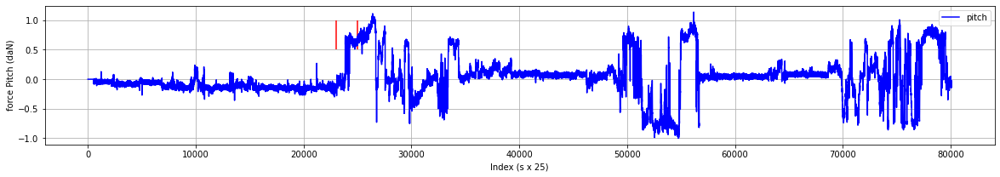

In [7]:
plt.figure(figsize=(20,3))
plt.plot(data_P8['force_pitch'],'b',label='pitch')
#plt.plot(data['force_roll'],'r',label='roll')
plt.legend()

plt.vlines(23000,0.5,1,'r')
plt.vlines(25000,0.5,1,'r')
plt.xlabel('Index (s x 25)')
plt.ylabel('force Pitch (daN)')
plt.grid()
plt.show()


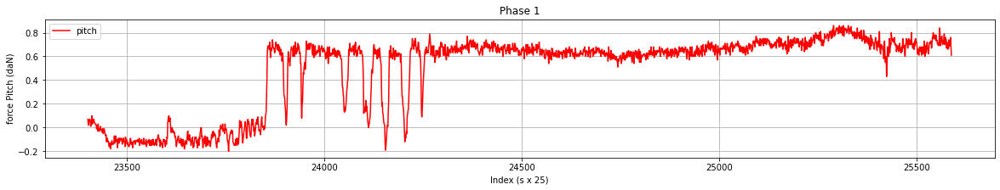

In [12]:
plt.figure(figsize=(20,3))
plt.title('Phase 1')
plt.plot(data_P8['force_pitch'].iloc[23402:25588],'r',label='pitch')

plt.legend()
plt.xlabel('Index (s x 25)')
plt.ylabel('force Pitch (daN)')
plt.grid()
plt.show()


In [13]:
time = data_P8['reltime'][23600]#donne le temps en s de l'abscisse demandé 
def convertime (time):
    date=time/60+time%60
convertime(time)

In [14]:
data_P8.shape

(80065, 18)

In [15]:
D=np.array(data_P8)
D

array([[0.001, '2018/01/23 14:30:48.954', 50.2, ..., 0, 0, 0],
       [0.01, '2018/01/23 14:30:48.963', 50.2, ..., 0, 0, 0],
       [0.05, '2018/01/23 14:30:49.003', 50.2, ..., 0, 0, 0],
       ...,
       [3201.962, '2018/01/23 15:24:10.915', 54.3, ..., 0, 0, 0],
       [3202.002, '2018/01/23 15:24:10.955', 54.3, ..., 0, 0, 0],
       [3202.042, '2018/01/23 15:24:10.995', 54.3, ..., 0, 0, 0]],
      dtype=object)

In [16]:
D[:,8] #8 pour force pitch
Force_pitch_filtred=[]

In [17]:
for i in range(len(D[:,8])+1):
    Force_pitch_filtred.append

In [18]:
from scipy.signal import savgol_filter

In [19]:
Force_pitch_filtred=savgol_filter(data_P8['force_pitch'],9 , 3)

In [20]:
fpf=pd.DataFrame(Force_pitch_filtred)

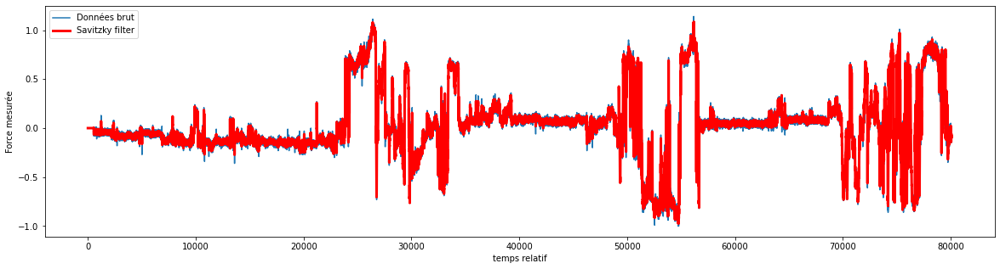

In [21]:
#---------------------------------Filtre Savitzky Golay sur Force pitch durant toute la session 1------------------------------

plt.figure(figsize=(20,5))
plt.plot(data_P8["force_pitch"],label='Données brut')
plt.plot(Force_pitch_filtred,'r',label='Savitzky filter',linewidth=3)
plt.legend()
plt.xlabel('temps relatif')
plt.ylabel('Force mesurée')
plt.show()

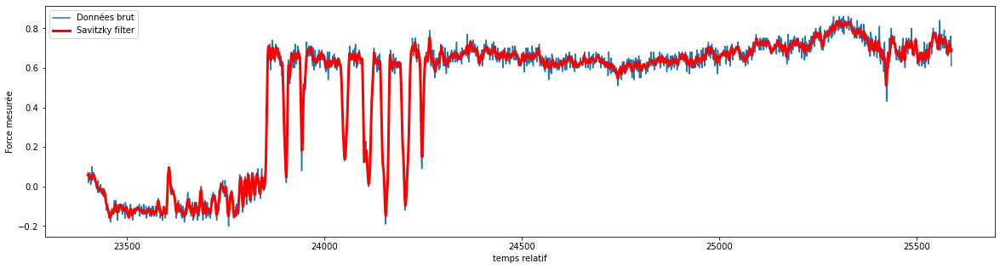

In [22]:
#---------------------------------Filtre Savitzky Golay sur Force pitch durant toute la session 1------------------------------

plt.figure(figsize=(20,5))
plt.plot(data_P8["force_pitch"].iloc[23402:25588],label='Données brut')
plt.plot(fpf.iloc[23402:25588],'r',label='Savitzky filter',linewidth=3)
plt.legend()
plt.xlabel('temps relatif')
plt.ylabel('Force mesurée')
plt.show()

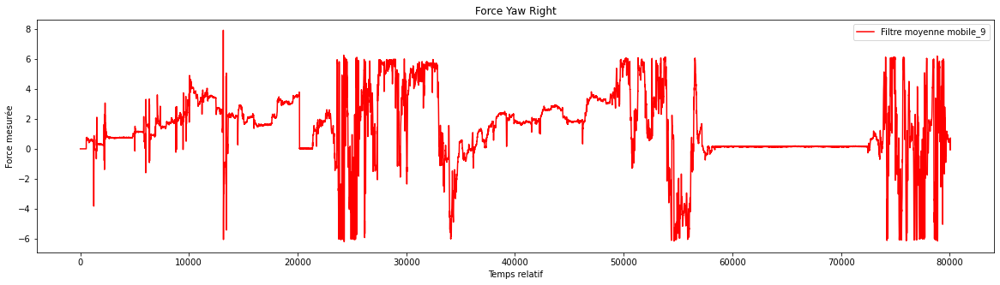

In [23]:
#---------------------------------Filtre moyennes mobiles sur Force pitch durant toute la session 1------------------------------

plt.figure(figsize=(20,5))
#plt.plot(data['force_pitch'],label="Données brut")
plt.title("Force Yaw Right")
plt.plot(data_P8['force_ryaw'].rolling(9).mean(),'r',label="Filtre moyenne mobile_9")
plt.xlabel('Temps relatif')
plt.ylabel('Force mesurée')
plt.legend()
plt.show()

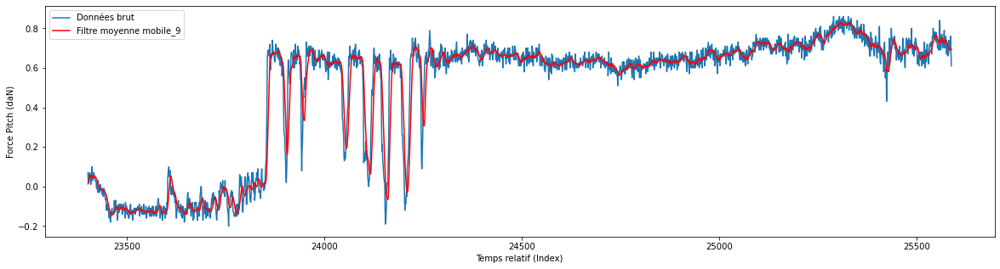

In [24]:
#---------------------------------Filtre moyennes mobiles sur Force pitch durant la phase stationnaire ------------------------------
plt.figure(figsize=(20,5))
plt.plot(data_P8['force_pitch'].iloc[23402:25588],label="Données brut")
plt.plot(data_P8['force_pitch'].rolling(9).mean().iloc[23402:25588],'r',label="Filtre moyenne mobile_9")
plt.xlabel('Temps relatif (Index)')
plt.ylabel('Force Pitch (daN)')
plt.legend()

In [25]:
data_P8 == pandas.core.frame.DataFrame

NameError: name 'pandas' is not defined

In [ ]:
plt.figure(figsize=(20,5))
plt.title('Phase de vol')
plt.plot(phases['0'],phases['0.1'])
plt.xlabel('Temps en s.')
plt.ylabel('Numero phase')
plt.show()

In [ ]:
alt = altitude_P3.iloc[1:80000]

In [ ]:
plt.figure(figsize=(25,5))
plt.title('Altitude')
plt.plot(altitude_P3['radio_alti'].iloc[0:80000])
plt.xlabel('Temps relatif')
plt.ylabel('Altitude en ft.')
plt.show()

In [ ]:
plt.figure(figsize=(25,3))
#plt.plot(data['force_pitch'],label="Données brut")
plt.title("Force Collectif")
plt.plot(data_P8['force_coll'].rolling(9).mean(),'r',label="Filtre moyenne mobile_9")
plt.xlabel('Temps relatif')
plt.ylabel('Force mesurée')
plt.legend()
plt.show()
plt.figure(figsize=(25,3))
plt.title('Altitude')
plt.plot(altitude_P3['radio_alti'].iloc[0:80100])
plt.xlabel('Temps relatif')
plt.ylabel('Altitude en ft.')
plt.show()

In [ ]:
data_P8

#---------------------Edute inter-pilotes phase stationnaire-----------------------

In [ ]:
altitude_P8

In [ ]:
#---------------temps tag sur le cahier 
stationnaire_P2 = data_P2.iloc[56425:58400]
stationnaire_P3 = data_P3.iloc[22625:24000]
stationnaire_P4 = data_P4.iloc[21100:23500]
stationnaire_P5 = data_P5.iloc[22100:25300]
stationnaire_P8 = data_P8.iloc[24000:26175]

#----------------temps -1min pour etre sur d'avoir le début 
#stationnaire_P2 = data_P8.iloc[55000:58400]
#stationnaire_P3 = data_P8.iloc[21000:24000]
#stationnaire_P4 = data_P8.iloc[19600:23500]
#stationnaire_P5 = data_P8.iloc[20600:25300]
#stationnaire_P8 = data_P8.iloc[22500:26175]
#------------------temps depuis le debut 
#stationnaire_P2 = data_P8.iloc[0:58400]
#stationnaire_P3 = data_P8.iloc[0:24000]
#stationnaire_P4 = data_P8.iloc[0:23500]
#stationnaire_P5 = data_P8.iloc[0:25300]
#stationnaire_P8 = data_P8.iloc[0:26175]

In [75]:
stationnaire_P8['cmd_pitch']

24000    30.2
24001    30.2
24002    30.1
24003    30.0
24004    29.8
         ... 
26170    34.2
26171    34.3
26172    34.4
26173    34.5
26174    34.5
Name: cmd_pitch, Length: 2175, dtype: float64

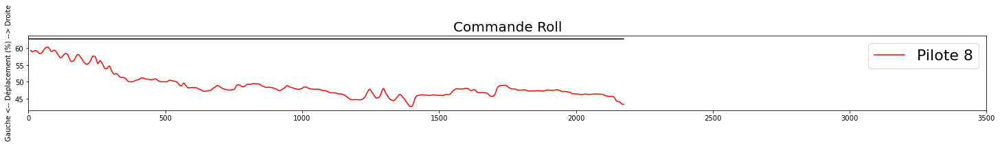

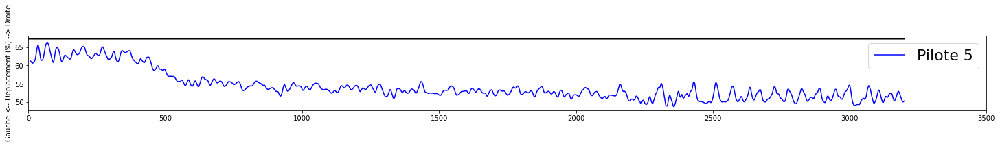

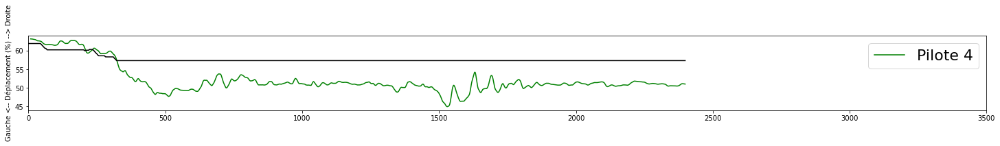

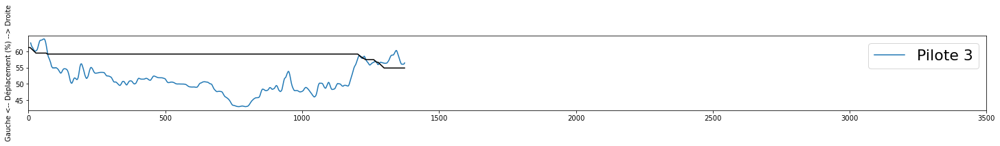

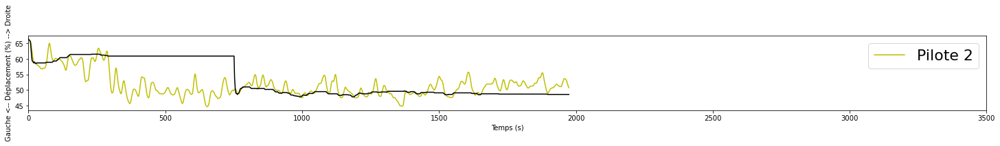

In [27]:
plt.figure(figsize=(25,2))
plt.title("Commande Roll",fontsize=20)
plt.plot(stationnaire_P8['cmd_roll'].reset_index(drop=True).rolling(9).mean(),'r',label='Pilote 8')
plt.plot(stationnaire_P8['trim_roll'].reset_index(drop=True),'k')
ylabel('Gauche <-- Déplacement (%) --> Droite')
xlim(0,3500)
plt.legend(prop={'size': 22})
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P5['cmd_roll'].reset_index(drop=True).rolling(9).mean(),'b',label='Pilote 5')
plt.plot(stationnaire_P5['trim_roll'].reset_index(drop=True),'k')
ylabel('Gauche <-- Déplacement (%) --> Droite')
xlim(0,3500)
plt.legend(prop={'size': 22})
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P4['cmd_roll'].reset_index(drop=True).rolling(9).mean(),'g',label='Pilote 4')
plt.plot(stationnaire_P4['trim_roll'].reset_index(drop=True),'k')
ylabel('Gauche <-- Déplacement (%) --> Droite')
xlim(0,3500)
plt.legend(prop={'size': 22})
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P3['cmd_roll'].reset_index(drop=True).rolling(9).mean(),label='Pilote 3')
plt.plot(stationnaire_P3['trim_roll'].reset_index(drop=True),'k')
ylabel('Gauche <-- Déplacement (%) --> Droite')
xlim(0,3500)
plt.legend(prop={'size': 22})
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P2['cmd_roll'].reset_index(drop=True).rolling(9).mean(),'y',label='Pilote 2')
plt.plot(stationnaire_P2['trim_roll'].reset_index(drop=True),'k')
ylabel('Gauche <-- Déplacement (%) --> Droite')
plt.xlabel('Temps (s)')
xlim(0,3500)
plt.legend(prop={'size': 22})
plt.show()

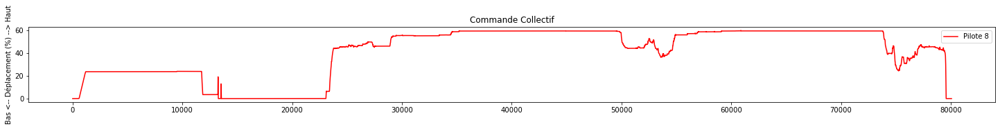

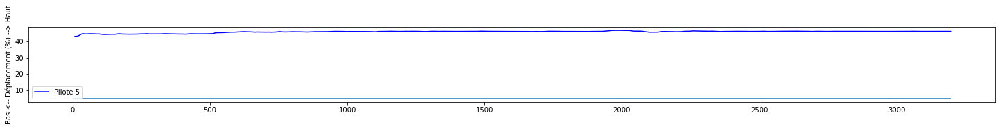

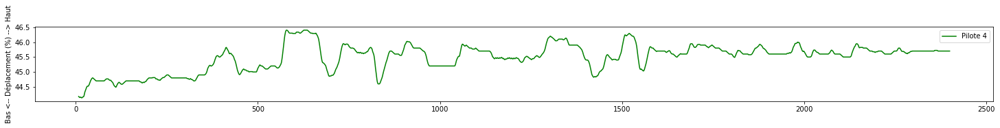

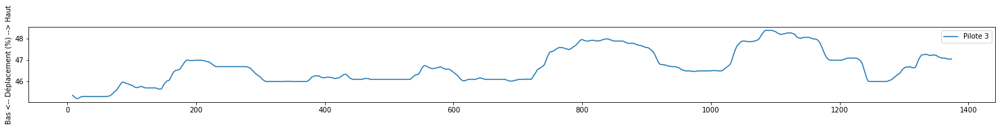

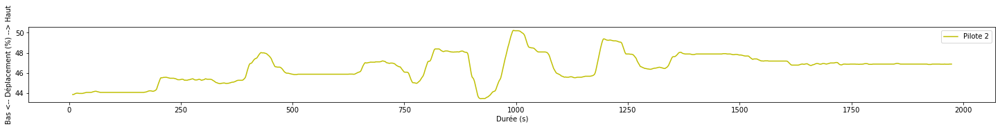

In [74]:
plt.figure(figsize=(25,2))
plt.title("Commande Collectif")
#fig, ax1=plt.subplots()
plt.plot(data_P8['cmd_coll'].reset_index(drop=True).rolling(9).mean(),'r',label='Pilote 8')
ylabel('Bas <-- Déplacement (%) --> Haut')
#ax2=ax1.twinx()
#ax2.plot(stationnaire_P8['reltime'],altitude_P8['radio_alti'].iloc[24000:26175],'tab:brown',label='Pilote 8')
#ax1.set_ylabel('%', color='r')
#ax2.set_ylabel('feet', color='tab:brown')
#ax1.tick_params(axis='y', labelcolor='r')
#ax2.tick_params(axis='y', labelcolor='tab:brown')
plt.legend()
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P5['cmd_coll'].reset_index(drop=True).rolling(9).mean(),'b',label='Pilote 5')
hlines(5,0,len(stationnaire_P5['cmd_coll'].reset_index(drop=True)))
ylabel('Bas <-- Déplacement (%) --> Haut')
plt.legend()
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P4['cmd_coll'].reset_index(drop=True).rolling(9).mean(),'g',label='Pilote 4')
ylabel('Bas <-- Déplacement (%) --> Haut')
plt.legend()
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P3['cmd_coll'].reset_index(drop=True).rolling(9).mean(),label='Pilote 3')
ylabel('Bas <-- Déplacement (%) --> Haut')
plt.legend()
plt.show()
plt.figure(figsize=(25,2))
plt.plot(stationnaire_P2['cmd_coll'].reset_index(drop=True).rolling(9).mean(),'y',label='Pilote 2')
ylabel('Bas <-- Déplacement (%) --> Haut')
plt.xlabel('Durée (s)')
plt.legend()
plt.show()

In [29]:
type(stationnaire_P3.rolling(9).mean())
sns.__version__

'0.11.0'



---------------------------Distribution des commandes sur le Cyclique---------------------




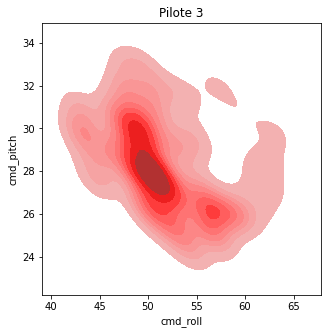

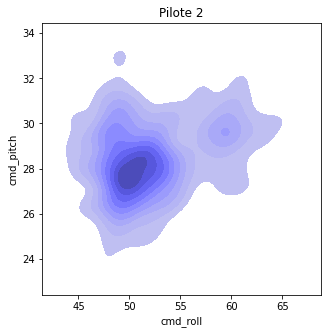

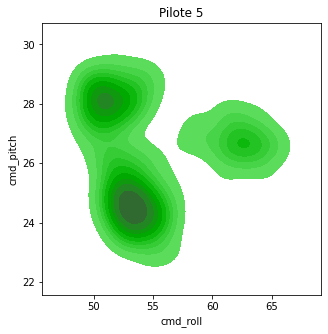

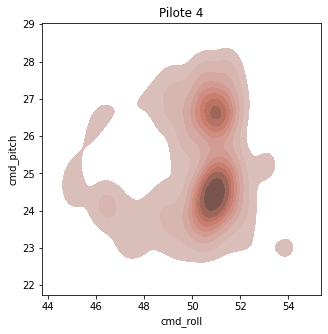

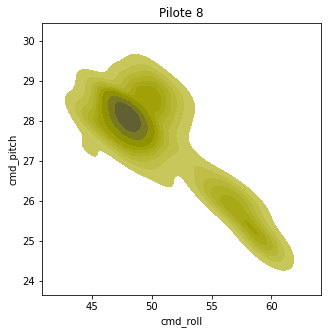

In [30]:
print('\n\n---------------------------Distribution des commandes sur le Cyclique---------------------\n\n')
plt.figure(figsize=(5,5))
plt.title("Pilote 3")
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['cmd_roll'].rolling(9).mean(),y=stationnaire_P3['cmd_pitch'].rolling(9).mean(),fill=True, color='r')
plt.show()

plt.figure(figsize=(5,5))
plt.title("Pilote 2")
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['cmd_roll'].rolling(9).mean(),y=stationnaire_P2['cmd_pitch'].rolling(9).mean(),fill=True, color='b')
plt.show()

plt.figure(figsize=(5,5))
plt.title("Pilote 5")
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['cmd_roll'].rolling(9).mean(),y=stationnaire_P5['cmd_pitch'].rolling(9).mean(),fill=True, color='g')
plt.show()

plt.figure(figsize=(5,5))
plt.title("Pilote 4")
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['cmd_roll'].rolling(9).mean(),y=stationnaire_P5['cmd_pitch'].rolling(9).mean(),fill=True, color='tab:brown')
plt.show()


plt.figure(figsize=(5,5))
plt.title("Pilote 8")
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['cmd_roll'].rolling(9).mean(),y=stationnaire_P5['cmd_pitch'].rolling(9).mean(),fill=True, color='y')
plt.show()



---------------------------Distribution des Forces intrapilotes sur le Cyclique---------------------




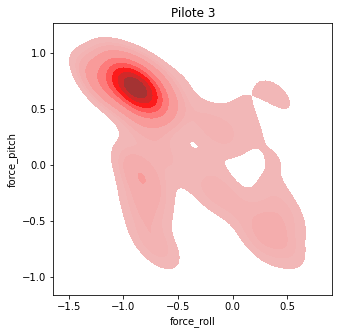

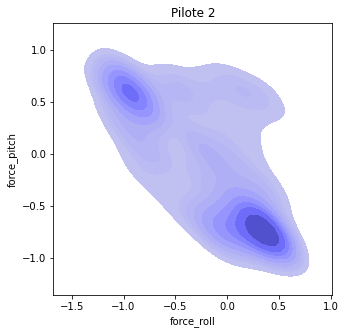

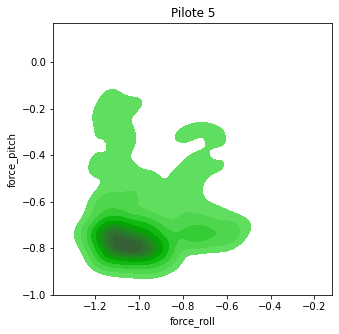

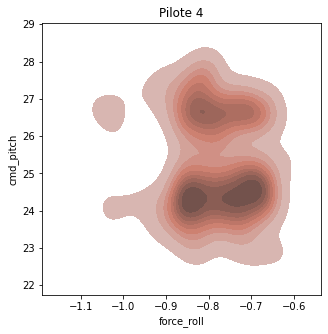

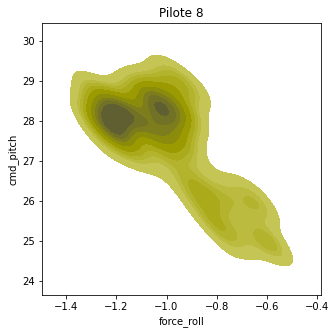

In [31]:
print('\n\n---------------------------Distribution des Forces intrapilotes sur le Cyclique---------------------\n\n')

plt.figure(figsize=(5,5))
plt.title("Pilote 3")
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_roll'].rolling(9,1).mean(),y=stationnaire_P3['force_pitch'].rolling(9).mean(),fill=True, color='r')
plt.show()

plt.figure(figsize=(5,5))
plt.title("Pilote 2")
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_roll'].rolling(9).mean(),y=stationnaire_P2['force_pitch'].rolling(9).mean(),fill=True, color='b')
plt.show()

plt.figure(figsize=(5,5))
plt.title("Pilote 5")
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_roll'].rolling(9).mean(),y=stationnaire_P5['force_pitch'].rolling(9).mean(),fill=True, color='g')
plt.show()

plt.figure(figsize=(5,5))
plt.title("Pilote 4")
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_roll'].rolling(9).mean(),y=stationnaire_P5['cmd_pitch'].rolling(9).mean(),fill=True, color='tab:brown')
plt.show()

plt.figure(figsize=(5,5))
plt.title("Pilote 8")
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_roll'].rolling(9).mean(),y=stationnaire_P5['cmd_pitch'].rolling(9).mean(),fill=True, color='y')
plt.show()



-----------------------Distributions des forces inter-pilotes-----------------------




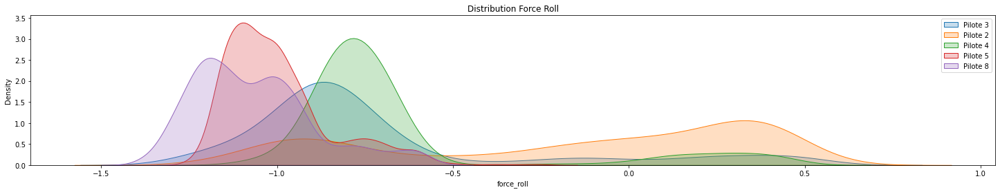

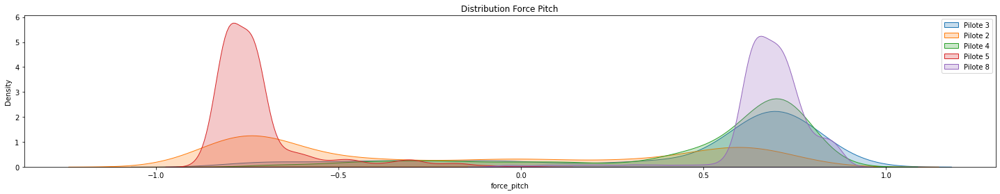

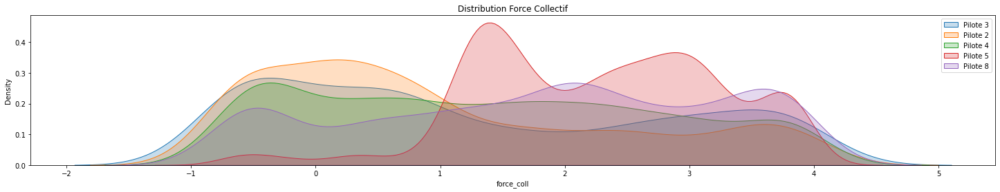

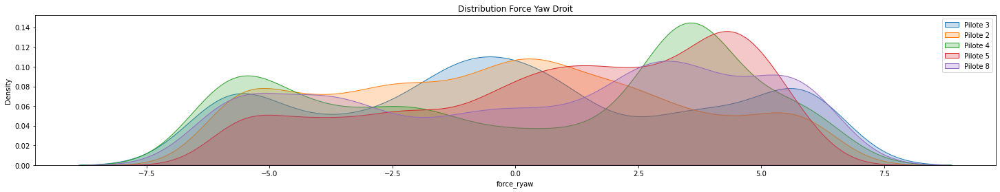

In [32]:
print('\n\n-----------------------Distributions des forces inter-pilotes-----------------------\n\n')
plt.figure(figsize=(25,4))
plt.title('Distribution Force Roll')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_roll'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_roll'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_roll'].rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_roll'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_roll'].rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.legend()
plt.show()

plt.figure(figsize=(25,4))
plt.title('Distribution Force Pitch')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_pitch'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_pitch'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_pitch'].rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_pitch'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_pitch'].rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.legend()
plt.show()

plt.figure(figsize=(25,4))
plt.title('Distribution Force Collectif')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_coll'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_coll'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_coll'].rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_coll'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_coll'].rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.legend()
plt.show()

plt.figure(figsize=(25,4))
plt.title('Distribution Force Yaw Droit')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_ryaw'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_ryaw'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_ryaw'].rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_ryaw'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_ryaw'].rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.legend()
plt.show()

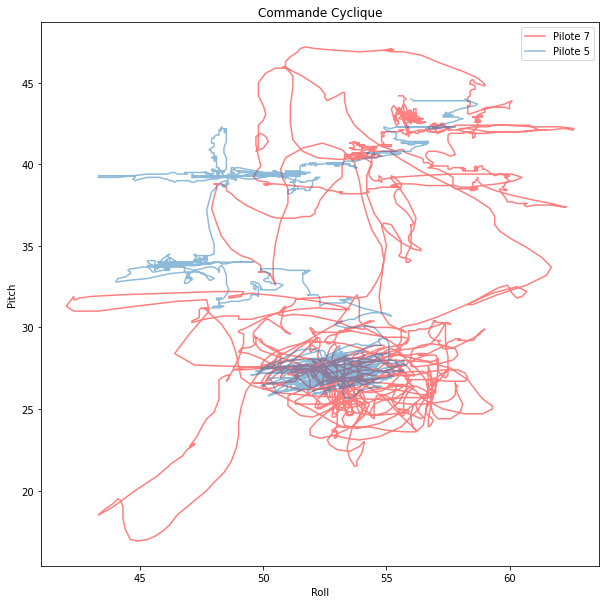

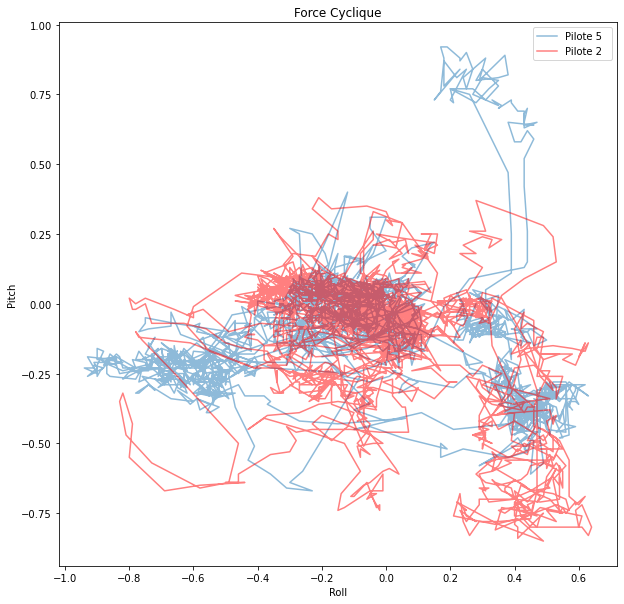

In [99]:
plt.figure(figsize=(10,10))
plt.title("Commande Cyclique")
plt.plot(decol1_P2['cmd_roll'],decol1_P2['cmd_pitch'],'r',label='Pilote 7',alpha=0.5)
plt.plot(decol1_P5['cmd_roll'],decol1_P5['cmd_pitch'],label='Pilote 5',alpha=0.5)

xlabel('Roll')
ylabel('Pitch')
plt.legend()
plt.show()

plt.figure(figsize=(10,10))
plt.title("Force Cyclique")
plt.plot(decol2_P5['force_roll'],decol2_P5['force_pitch'],label='Pilote 5  ',alpha=0.5)
plt.plot(decol2_P2['force_roll'],decol2_P2['force_pitch'],'r',label='Pilote 2',alpha=0.5)
xlabel('Roll')
ylabel('Pitch')
plt.legend()
plt.show()

In [34]:
stationnaire_P8['cmd_roll'].rolling(9,1).mean().diff()

24000         NaN
24001   -0.050000
24002   -0.016667
24003   -0.033333
24004   -0.040000
           ...   
26170    0.000000
26171   -0.011111
26172   -0.033333
26173   -0.033333
26174   -0.011111
Name: cmd_roll, Length: 2175, dtype: float64



-----------------------Distributions des Jerk inter-pilotes-----------------------




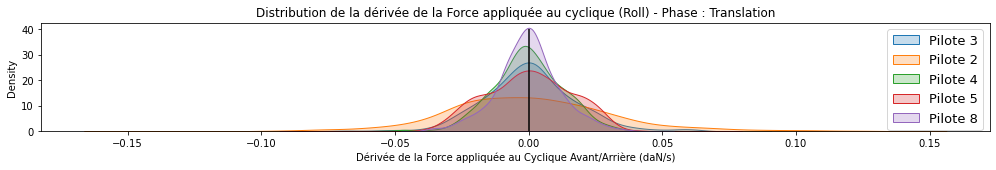

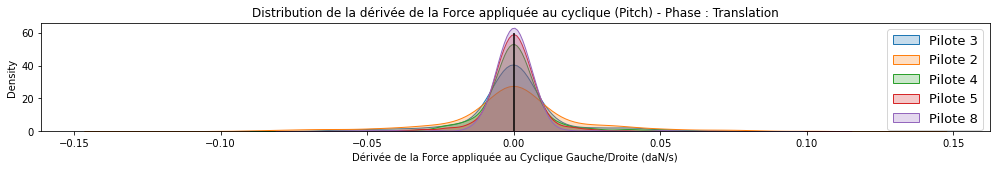

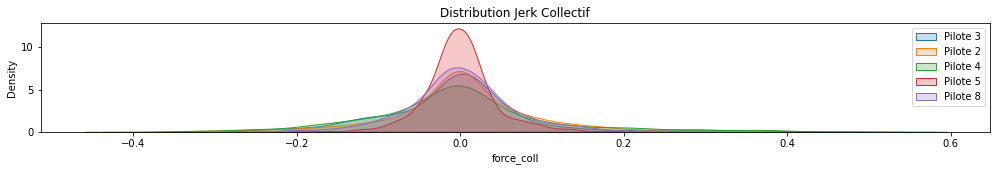

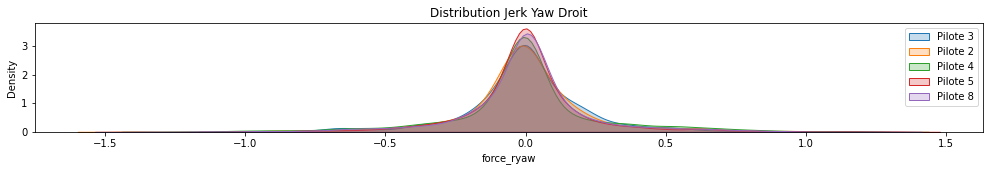

In [35]:
print('\n\n-----------------------Distributions des Jerk inter-pilotes-----------------------\n\n')
plt.figure(figsize=(17,2))
plt.title('Distribution de la dérivée de la Force appliquée au cyclique (Roll) - Phase : Translation')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_roll'].rolling(9,1).mean().diff(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_roll'].rolling(9,1).mean().diff(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_roll'].rolling(9,1).mean().diff(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_roll'].rolling(9,1).mean().diff(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_roll'].rolling(9,1).mean().diff(),label='Pilote 8',fill=True,common_norm = True)
plt.legend(prop={'size': 13})
vlines(0,0,40,'k')
plt.xlabel('Dérivée de la Force appliquée au Cyclique Avant/Arrière (daN/s)')
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution de la dérivée de la Force appliquée au cyclique (Pitch) - Phase : Translation')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_pitch'].rolling(9,1).mean().diff(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_pitch'].rolling(9,1).mean().diff(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_pitch'].rolling(9,1).mean().diff(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_pitch'].rolling(9,1).mean().diff(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_pitch'].rolling(9,1).mean().diff(),label='Pilote 8',fill=True)
plt.legend(prop={'size': 13})
vlines(0,0,60,'k')
plt.xlabel('Dérivée de la Force appliquée au Cyclique Gauche/Droite (daN/s)')
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution Jerk Collectif')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_coll'].rolling(9,1).mean().diff(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_coll'].rolling(9,1).mean().diff(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_coll'].rolling(9,1).mean().diff(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_coll'].rolling(9,1).mean().diff(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_coll'].rolling(9,1).mean().diff(),label='Pilote 8',fill=True)
plt.legend()
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution Jerk Yaw Droit')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['force_ryaw'].rolling(9,1).mean().diff(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['force_ryaw'].rolling(9,1).mean().diff(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['force_ryaw'].rolling(9,1).mean().diff(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['force_ryaw'].rolling(9,1).mean().diff(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['force_ryaw'].rolling(9,1).mean().diff(),label='Pilote 8',fill=True)
plt.legend()
plt.show()



-----------------------Distributions des Jerk inter-pilotes sur toutes les phases-----------------------




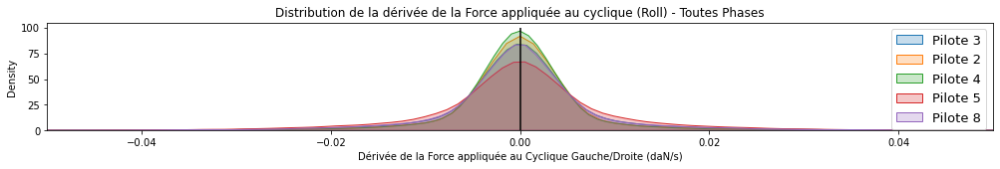

In [36]:
print('\n\n-----------------------Distributions des Jerk inter-pilotes sur toutes les phases-----------------------\n\n')
plt.figure(figsize=(17,2))
plt.title('Distribution de la dérivée de la Force appliquée au cyclique (Roll) - Toutes Phases')
xlim(-0.05,0.05)
sns.kdeplot(data=data_P3,x=data_P3['force_roll'].rolling(9,1).mean().diff(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=data_P2,x=data_P2['force_roll'].rolling(9,1).mean().diff(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=data_P4,x=data_P4['force_roll'].rolling(9,1).mean().diff(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=data_P5,x=data_P5['force_roll'].rolling(9,1).mean().diff(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=data_P8,x=data_P8['force_roll'].rolling(9,1).mean().diff(),label='Pilote 8',fill=True,common_norm = True)
plt.legend(prop={'size': 13})
vlines(0,0,100,'k')
plt.xlabel('Dérivée de la Force appliquée au Cyclique Gauche/Droite (daN/s)')

plt.show()

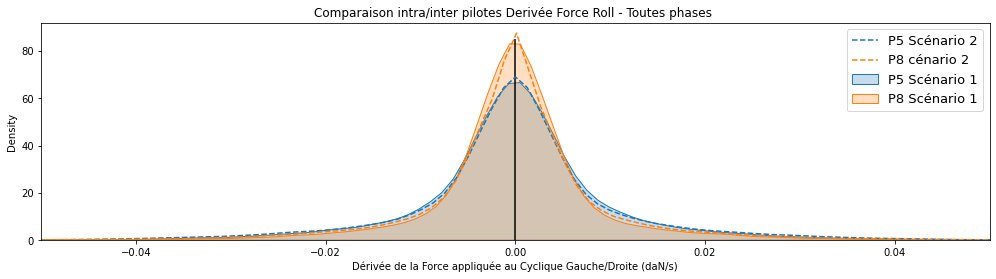

In [37]:
plt.figure(figsize=(17,4))
plt.title('Comparaison intra/inter pilotes Derivée Force Roll - Toutes phases ')
xlim(-0.05,0.05)



#Pilote 2
    #Roll
#sns.kdeplot(data=data_P2,x=data_P2['force_roll'].rolling(9,1).mean().diff(),label='P2 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P2S2,x=data_P2S2['force_roll'].rolling(9,1).mean().diff(),label='P2 cénario 2')
    #Pitch
#sns.kdeplot(data=data_P2,x=data_P2['force_pitch'].rolling(9,1).mean().diff(),label='P2 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P2S2,x=data_P2S2['force_pitch'].rolling(9,1).mean().diff(),label='P2 cénario 2')
    #Collectif
#sns.kdeplot(data=data_P2,x=data_P2['force_coll'].rolling(9,1).mean().diff(),label='P2 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P2S2,x=data_P2S2['force_coll'].rolling(9,1).mean().diff(),label='P2 cénario 2')

#Pilote 3
    #Roll
#sns.kdeplot(data=data_P3,x=data_P3['force_roll'].rolling(9,1).mean().diff(),label='P3 Scénario 1',fill=True)
#sns.kdeplot(data=data_P3S2,x=data_P3S2['force_roll'].rolling(9,1).mean().diff(),label='P3 Scénario 2')
    #Pitch
#sns.kdeplot(data=data_P3,x=data_P3['force_pitch'].rolling(9,1).mean().diff(),label='P3 Scénario 1',fill=True)
#sns.kdeplot(data=data_P3S2,x=data_P3S2['force_pitch'].rolling(9,1).mean().diff(),label='P3 Scénario 2')
    #Collectif
#sns.kdeplot(data=data_P3,x=data_P3['force_coll'].rolling(9,1).mean().diff(),label='P3 Scénario 1',fill=True)
#sns.kdeplot(data=data_P3S2,x=data_P3S2['force_coll'].rolling(9,1).mean().diff(),label='P3 Scénario 2')

#Pilote 4
    #Roll
#sns.kdeplot(data=data_P4,x=data_P4['force_roll'].rolling(9,1).mean().diff(),label='P4 Scénario 1',fill=True)
#sns.kdeplot(data=data_P4S2,x=data_P4S2['force_roll'].rolling(9,1).mean().diff(),label='P4 Scénario 2')
    #Roll
#sns.kdeplot(data=data_P4,x=data_P4['force_roll'].rolling(9,1).mean().diff(),label='P4 Scénario 1',fill=True)
#sns.kdeplot(data=data_P4S2,x=data_P4S2['force_roll'].rolling(9,1).mean().diff(),label='P4 Scénario 2')
    #Roll
#sns.kdeplot(data=data_P4,x=data_P4['force_roll'].rolling(9,1).mean().diff(),label='P4 Scénario 1',fill=True)
#sns.kdeplot(data=data_P4S2,x=data_P4S2['force_roll'].rolling(9,1).mean().diff(),label='P4 Scénario 2')

#Pilote 5
    #Roll
sns.kdeplot(data=data_P5,x=data_P5['force_roll'].rolling(9,1).mean().diff(),label='P5 Scénario 1',fill=True)
sns.kdeplot(data=data_P5S2,x=data_P5S2['force_roll'].rolling(9,1).mean().diff(),label='P5 Scénario 2',linestyle='--')
    #Pitch
#sns.kdeplot(data=data_P5,x=data_P5['force_pitch'].rolling(9,1).mean().diff(),label='P5 Scénario 1',fill=True)
#sns.kdeplot(data=data_P5S2,x=data_P5S2['force_pitch'].rolling(9,1).mean().diff(),label='P5 Scénario 2')
    #Collectif
#sns.kdeplot(data=data_P5,x=data_P5['force_coll'].rolling(9,1).mean().diff(),label='P5 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P5S2,x=data_P5S2['force_coll'].rolling(9,1).mean().diff(),label='S5 cénario 2')

#Pilote 7
    #Roll
#sns.kdeplot(data=data_P7,x=data_P7['force_roll'].rolling(9,1).mean().diff(),label='P7 Scénario 1',fill=True)
#sns.kdeplot(data=data_P7S2,x=data_P7S2['force_roll'].rolling(9,1).mean().diff(),label='P7 Scénario 2')
    #Pitch
#sns.kdeplot(data=data_P7,x=data_P7['force_pitch'].rolling(9,1).mean().diff(),label='P7 Scénario 1',fill=True)
#sns.kdeplot(data=data_P7S2,x=data_P7S2['force_pitch'].rolling(9,1).mean().diff(),label='P7 Scénario 2')
    #Collectif
#sns.kdeplot(data=data_P7,x=data_P7['force_coll'].rolling(9,1).mean().diff(),label='P7 Scénario 1',fill=True)
#sns.kdeplot(data=data_P7S2,x=data_P7S2['force_coll'].rolling(9,1).mean().diff(),label='P7 Scénario 2')

#Pilote 8
    #Roll
sns.kdeplot(data=data_P8,x=data_P8['force_roll'].rolling(9,1).mean().diff(),label='P8 Scénario 1',fill=True)
sns.kdeplot(data=data_P8S2,x=data_P8S2['force_roll'].rolling(9,1).mean().diff(),label='P8 cénario 2',linestyle='--')
    #Pitch
#sns.kdeplot(data=data_P8,x=data_P8['force_pitch'].rolling(9,1).mean().diff(),label='P8 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P8S2,x=data_P8S2['force_pitch'].rolling(9,1).mean().diff(),label='P8 cénario 2')
    #Collectif
#sns.kdeplot(data=data_P8,x=data_P8['force_coll'].rolling(9,1).mean().diff(),label='P8 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P8S2,x=data_P8S2['force_coll'].rolling(9,1).mean().diff(),label='P8 cénario 2')

#Pilote 9
    #Roll
#sns.kdeplot(data=data_P9,x=data_P9['force_roll'].rolling(9,1).mean().diff(),label='P9 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P9S2,x=data_P9S2['force_roll'].rolling(9,1).mean().diff(),label='P9 cénario 2')
    #Pitch
#sns.kdeplot(data=data_P9,x=data_P9['force_pitch'].rolling(9,1).mean().diff(),label='P9 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P9S2,x=data_P9S2['force_pitch'].rolling(9,1).mean().diff(),label='P9 cénario 2')
    #Collectif
#sns.kdeplot(data=data_P9,x=data_P9['force_coll'].rolling(9,1).mean().diff(),label='P9 Scénario 1',fill=True,)
#sns.kdeplot(data=data_P9S2,x=data_P9S2['force_coll'].rolling(9,1).mean().diff(),label='P9 cénario 2')
plt.legend(prop={'size': 13})
vlines(0,0,85,'k')
plt.xlabel('Dérivée de la Force appliquée au Cyclique Gauche/Droite (daN/s)')

plt.show()




----------------------- Distributions des positions inter-pilotes -----------------------




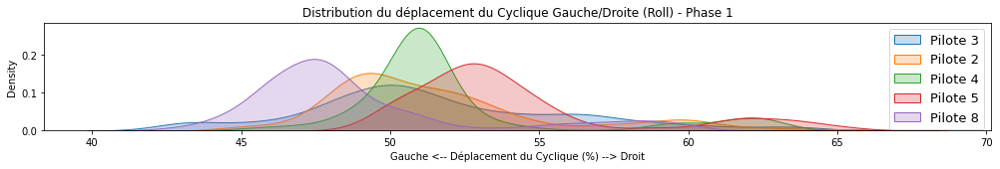

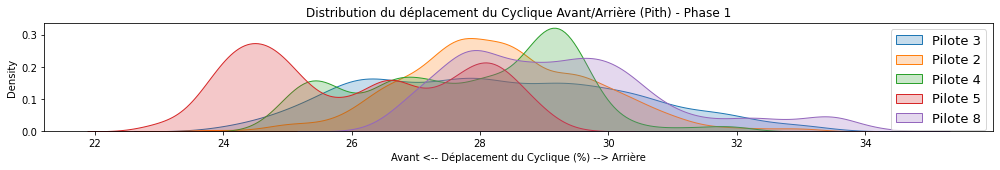

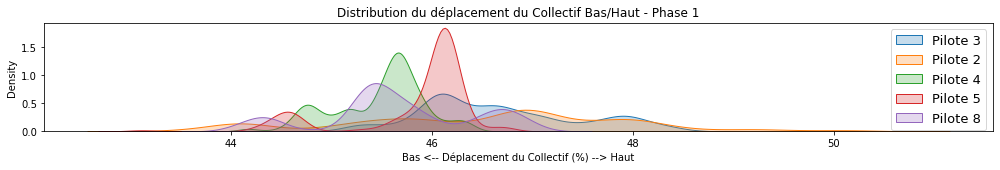

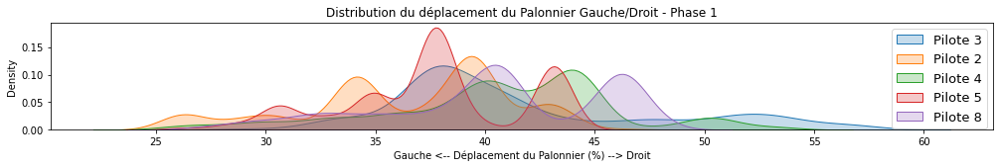

In [38]:
print('\n\n----------------------- Distributions des positions inter-pilotes -----------------------\n\n')
plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement du Cyclique Gauche/Droite (Roll) - Phase 1')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['cmd_roll'].rolling(9,1).mean(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['cmd_roll'].rolling(9,1).mean(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['cmd_roll'].rolling(9,1).mean(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['cmd_roll'].rolling(9,1).mean(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['cmd_roll'].rolling(9,1).mean(),label='Pilote 8',fill=True,common_norm = True)
plt.xlabel('Gauche <-- Déplacement du Cyclique (%) --> Droit')
plt.legend(loc=1, prop={'size': 13})
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement du Cyclique Avant/Arrière (Pith) - Phase 1')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['cmd_pitch'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['cmd_pitch'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['cmd_pitch'].rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['cmd_pitch'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['cmd_pitch'].rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.xlabel('Avant <-- Déplacement du Cyclique (%) --> Arrière')
plt.legend(loc=1, prop={'size': 13})
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement du Collectif Bas/Haut - Phase 1')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['cmd_coll'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['cmd_coll'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['cmd_coll'].rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['cmd_coll'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['cmd_coll'].rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.xlabel('Bas <-- Déplacement du Collectif (%) --> Haut')
plt.legend(loc=1, prop={'size': 13})
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement du Palonnier Gauche/Droit - Phase 1')
sns.kdeplot(data=stationnaire_P3,x=stationnaire_P3['cmd_yaw'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=stationnaire_P2['cmd_yaw'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=stationnaire_P4['cmd_yaw'].rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=stationnaire_P5['cmd_yaw'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=stationnaire_P8['cmd_yaw'].rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.xlabel('Gauche <-- Déplacement du Palonnier (%) --> Droit')
plt.legend(loc=1, prop={'size': 13})
plt.show()

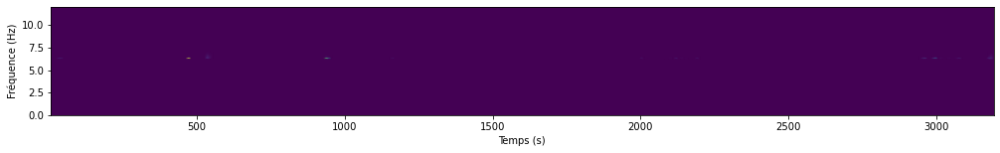

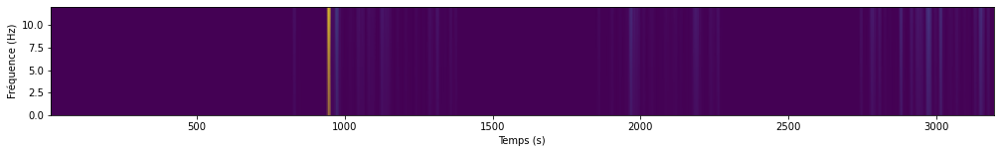

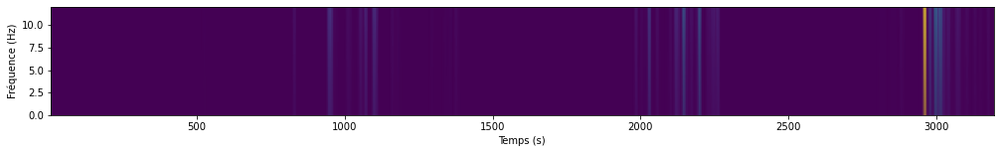

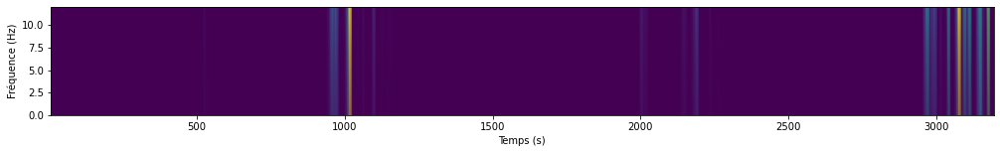

In [39]:
f, t, s= scipy.signal.spectrogram(data_P8['cmd_coll'],25,nfft=514)
plt.figure(figsize=(17,2))
plt.pcolormesh(t, f, fftshift(s, axes=0), shading='gouraud')
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
ylim(0,12)
plt.show()
f, t, s= scipy.signal.spectrogram(data_P8['cmd_roll'],25,return_onesided=False)
plt.figure(figsize=(17,2))
plt.pcolormesh(t, f, fftshift(s, axes=0), shading='gouraud')
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
ylim(0,12)
plt.show()
f, t, s= scipy.signal.spectrogram(data_P8['cmd_pitch'],25,return_onesided=False)
plt.figure(figsize=(17,2))
plt.pcolormesh(t, f, fftshift(s, axes=0), shading='gouraud')
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
ylim(0,12)
plt.show()
f, t, s= scipy.signal.spectrogram(data_P8['cmd_yaw'],25,return_onesided=False)
plt.figure(figsize=(17,2))
plt.pcolormesh(t, f, fftshift(s, axes=0), shading='gouraud')
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
ylim(0,12)
plt.show()

In [40]:
data_P8['reltime']

0           0.001
1           0.010
2           0.050
3           0.090
4           0.130
           ...   
80060    3201.882
80061    3201.922
80062    3201.962
80063    3202.002
80064    3202.042
Name: reltime, Length: 80065, dtype: float64

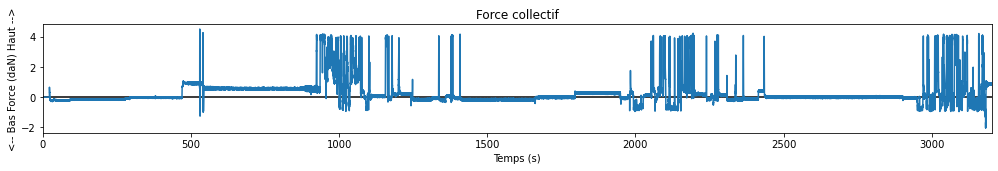

C:\Users\THALES\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7558: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


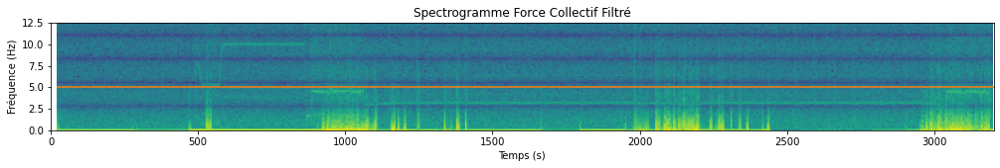

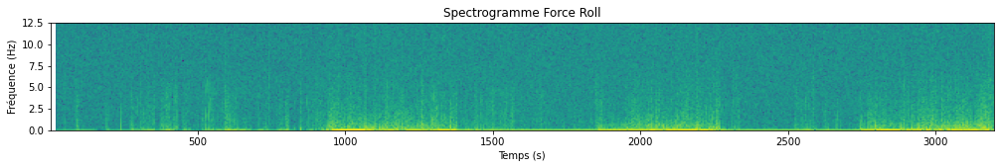

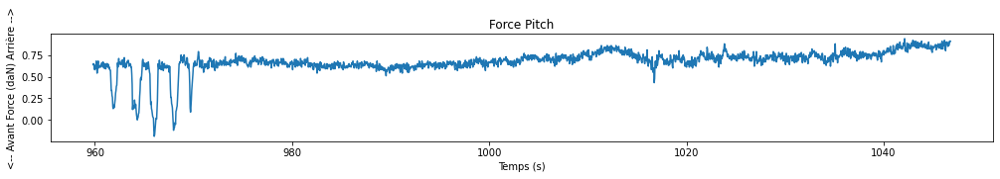

C:\Users\THALES\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7558: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


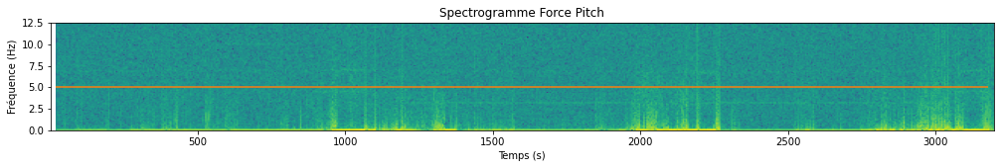

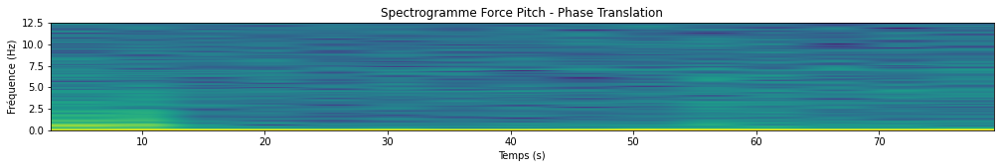

In [41]:

plt.figure(figsize=(17,2))
title('Force collectif')
plt.plot(data_P8['reltime'],data_P8['force_coll'])
hlines(0,1,3202,'k')
xlim(0,3202)
xlabel('Temps (s)')
ylabel('<-- Bas Force (daN) Haut -->')
plt.show()


plt.figure(figsize=(17,2))
title('Spectrogramme Force Collectif Filtré')
specgram(data_P8['force_coll'].rolling(9,1).mean(),Fs=25)
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
xlim(0,3202)
hlines(5,20,3202,'tab:orange')
plt.show()


plt.figure(figsize=(17,2))
title("Spectrogramme Force Roll")
specgram(data_P8['force_roll'],Fs=25)
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
#hlines(5,20,3180,'tab:orange')
plt.show()


plt.figure(figsize=(17,2))
title('Force Pitch')
plt.plot(stationnaire_P8['reltime'],stationnaire_P8['force_pitch'])

xlabel('Temps (s)')
ylabel('<-- Avant Force (daN) Arrière -->')
plt.show()


plt.figure(figsize=(17,2))
title('Spectrogramme Force Pitch')
specgram(data_P8['force_pitch'],Fs=25)
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
hlines(5,20,3180,'tab:orange')
plt.show()

plt.figure(figsize=(17,2))
title('Spectrogramme Force Pitch - Phase Translation')
specgram(stationnaire_P8['force_pitch'],Fs=25)
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
#hlines(5,20,3180,'tab:orange')
plt.show()

TypeError: 'int' object is not iterable

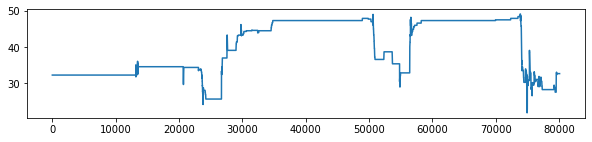

In [42]:
fig, ax_array = rpt.display(data_P8['trim_pitch'], 5)

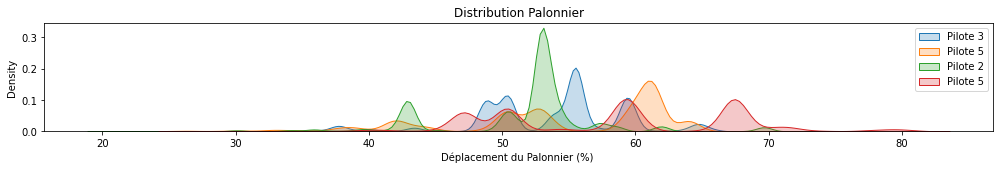

In [43]:
plt.figure(figsize=(17,2))
plt.title('Distribution Palonnier')
sns.kdeplot(data=data_P3,x=data_P3['cmd_yaw'].rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=data_P5,x=data_P5['cmd_yaw'].rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=data_P2,x=data_P2['cmd_yaw'].rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=data_P8,x=data_P8['cmd_yaw'].rolling(9,1).mean(),label='Pilote 5',fill=True)
plt.xlabel('Déplacement du Palonnier (%) ')
#vlines(0,0,0.06,'k')
plt.legend()
plt.show()

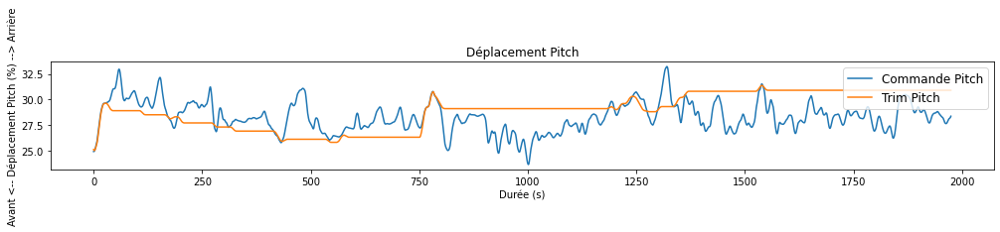

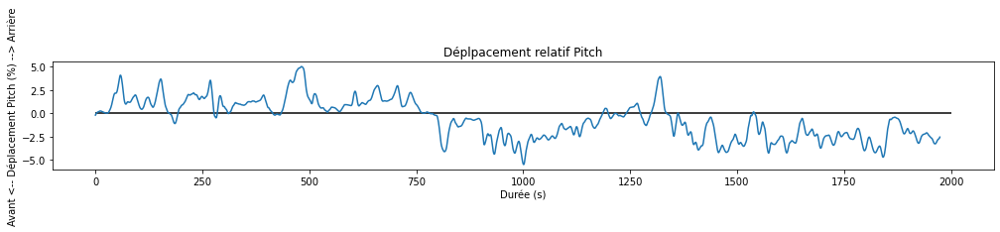

In [44]:
plt.figure(figsize=(17,2))
plt.title('Déplacement Pitch')
plt.plot(stationnaire_P2['cmd_pitch'].reset_index(drop=True).rolling(9,1).mean(),label="Commande Pitch")
plt.plot(stationnaire_P2['trim_pitch'].reset_index(drop=True).rolling(9,1).mean(),label="Trim Pitch")
plt.ylabel('Avant <-- Déplacement Pitch (%) --> Arrière')
plt.xlabel('Durée (s)')
plt.legend(loc=1, prop={'size': 12})
plt.show()
plt.figure(figsize=(17,2))
plt.title('Déplpacement relatif Pitch')
plt.plot((stationnaire_P2['cmd_pitch']-stationnaire_P2['trim_pitch']).rolling(9,1).mean().reset_index(drop=True),label="Commande Pitch")
plt.ylabel('Avant <-- Déplacement Pitch (%) --> Arrière')
hlines(0,0,2000,'k')
plt.xlabel('Durée (s)')
plt.show()

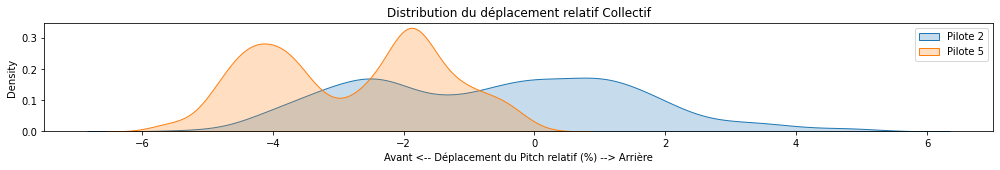

In [45]:
plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement relatif Collectif')
sns.kdeplot(data=stationnaire_P2,x=(stationnaire_P2['cmd_pitch']-stationnaire_P2['trim_pitch']).reset_index(drop=True).rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P5,x=(stationnaire_P5['cmd_pitch']-stationnaire_P5['trim_pitch']).reset_index(drop=True).rolling(9,1).mean(),label='Pilote 5',fill=True)
plt.xlabel('Avant <-- Déplacement du Pitch relatif (%) --> Arrière')
plt.legend()
plt.show()



-----------------------Distributions des positions Relatves inter-pilote Phase 1-----------------------




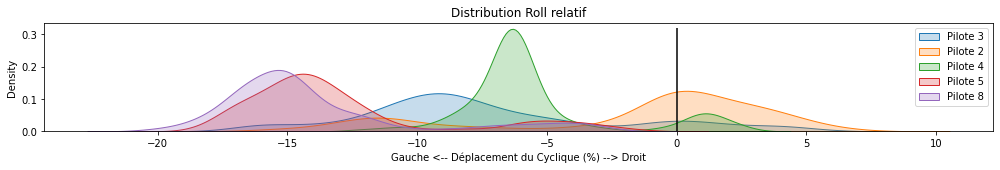

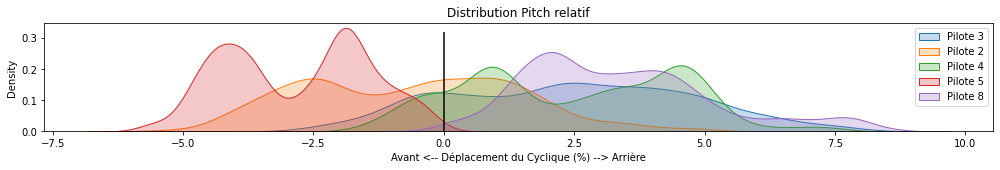

In [46]:
print('\n\n-----------------------Distributions des positions Relatves inter-pilote Phase 1-----------------------\n\n')
plt.figure(figsize=(17,2))
plt.title('Distribution Roll relatif')
sns.kdeplot(data=stationnaire_P3,x=(stationnaire_P3['cmd_roll']-stationnaire_P3['trim_roll']).rolling(9,1).mean(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P2,x=(stationnaire_P2['cmd_roll']-stationnaire_P2['trim_roll']).rolling(9,1).mean(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P4,x=(stationnaire_P4['cmd_roll']-stationnaire_P4['trim_roll']).rolling(9,1).mean(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P5,x=(stationnaire_P5['cmd_roll']-stationnaire_P5['trim_roll']).rolling(9,1).mean(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=stationnaire_P8,x=(stationnaire_P8['cmd_roll']-stationnaire_P8['trim_roll']).rolling(9,1).mean(),label='Pilote 8',fill=True,common_norm = True)
plt.xlabel('Gauche <-- Déplacement du Cyclique (%) --> Droit')
vlines(0,0,0.32,'k')
plt.legend()
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution Pitch relatif')
sns.kdeplot(data=stationnaire_P3,x=(stationnaire_P3['cmd_pitch']-stationnaire_P3['trim_pitch']).rolling(9,1).mean(),label='Pilote 3',fill=True)
sns.kdeplot(data=stationnaire_P2,x=(stationnaire_P2['cmd_pitch']-stationnaire_P2['trim_pitch']).rolling(9,1).mean(),label='Pilote 2',fill=True)
sns.kdeplot(data=stationnaire_P4,x=(stationnaire_P4['cmd_pitch']-stationnaire_P4['trim_pitch']).rolling(9,1).mean(),label='Pilote 4',fill=True)
sns.kdeplot(data=stationnaire_P5,x=(stationnaire_P5['cmd_pitch']-stationnaire_P5['trim_pitch']).rolling(9,1).mean(),label='Pilote 5',fill=True)
sns.kdeplot(data=stationnaire_P8,x=(stationnaire_P8['cmd_pitch']-stationnaire_P8['trim_pitch']).rolling(9,1).mean(),label='Pilote 8',fill=True)
plt.xlabel('Avant <-- Déplacement du Cyclique (%) --> Arrière')
vlines(0,0,0.32,'k')
plt.legend()
plt.show()




-----------------------Distributions des positions Relatves inter-pilote S1 Tout le vol -----------------------




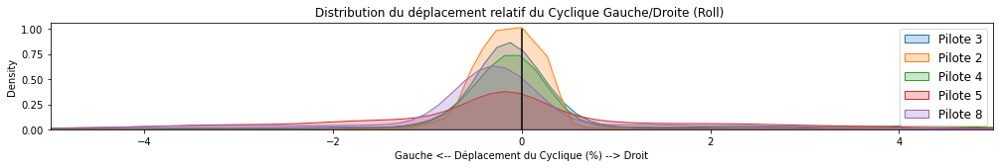

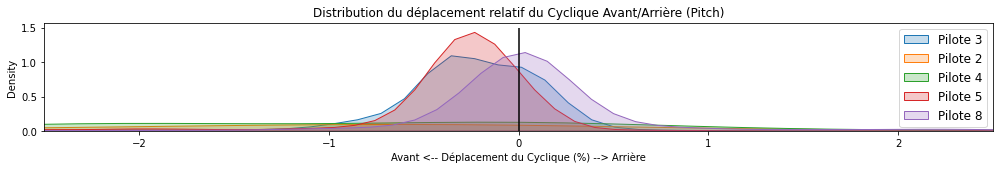

In [47]:
print('\n\n-----------------------Distributions des positions Relatves inter-pilote S1 Tout le vol -----------------------\n\n')
plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement relatif du Cyclique Gauche/Droite (Roll) ')
xlim(-5,5)
sns.kdeplot(data=data_P3,x=(data_P3['cmd_roll']-data_P3['trim_roll']).rolling(9,1).mean(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=data_P2,x=(data_P2['cmd_roll']-data_P2['trim_roll']).rolling(9,1).mean(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=data_P4,x=(data_P4['cmd_roll']-data_P4['trim_roll']).rolling(9,1).mean(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=data_P5,x=(data_P5['cmd_roll']-data_P5['trim_roll']).rolling(9,1).mean(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=data_P8,x=(data_P8['cmd_roll']-data_P8['trim_roll']).rolling(9,1).mean(),label='Pilote 8',fill=True,common_norm = True)
plt.legend(loc=1, prop={'size': 12})
plt.xlabel('Gauche <-- Déplacement du Cyclique (%) --> Droit')
vlines(0,0,1,'k')
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement relatif du Cyclique Avant/Arrière (Pitch)')
xlim(-2.5,2.5)
sns.kdeplot(data=data_P3,x=(data_P3['cmd_pitch']-data_P3['trim_pitch']).rolling(9,1).mean(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=data_P2,x=(data_P3['cmd_pitch']-data_P2['trim_pitch']).rolling(9,1).mean(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=data_P4,x=(data_P4['cmd_pitch']-data_P3['trim_pitch']).rolling(9,1).mean(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=data_P5,x=(data_P5['cmd_pitch']-data_P5['trim_pitch']).rolling(9,1).mean(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=data_P8,x=(data_P8['cmd_pitch']-data_P8['trim_pitch']).rolling(9,1).mean(),label='Pilote 8',fill=True,common_norm = True)
plt.xlabel('Avant <-- Déplacement du Cyclique (%) --> Arrière')
vlines(0,0,1.5,'k')
plt.legend(loc=1, prop={'size': 12})
plt.show()




-----------------------Distributions des positions Relatves inter-pilote S2 Tout le vol -----------------------




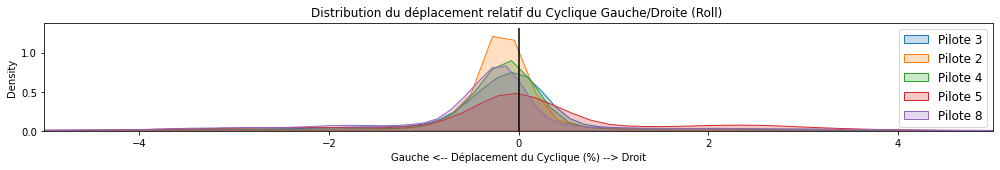

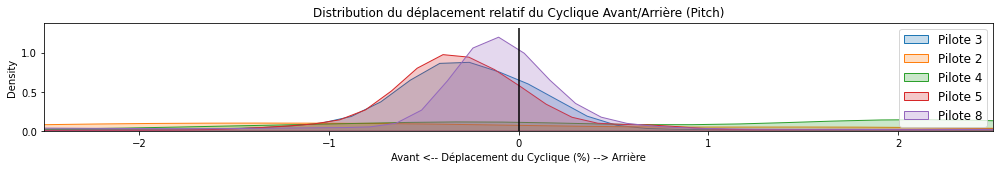

In [48]:
print('\n\n-----------------------Distributions des positions Relatves inter-pilote S2 Tout le vol -----------------------\n\n')
plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement relatif du Cyclique Gauche/Droite (Roll) ')
xlim(-5,5)
sns.kdeplot(data=data_P3S2,x=(data_P3S2['cmd_roll']-data_P3S2['trim_roll']).rolling(9,1).mean(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=data_P2S2,x=(data_P2S2['cmd_roll']-data_P2S2['trim_roll']).rolling(9,1).mean(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=data_P4S2,x=(data_P4S2['cmd_roll']-data_P4S2['trim_roll']).rolling(9,1).mean(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=data_P5S2,x=(data_P5S2['cmd_roll']-data_P5S2['trim_roll']).rolling(9,1).mean(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=data_P8S2,x=(data_P8S2['cmd_roll']-data_P8S2['trim_roll']).rolling(9,1).mean(),label='Pilote 8',fill=True,common_norm = True)
plt.legend(loc=1, prop={'size': 12})
plt.xlabel('Gauche <-- Déplacement du Cyclique (%) --> Droit')
vlines(0,0,1.32,'k')
plt.show()

plt.figure(figsize=(17,2))
plt.title('Distribution du déplacement relatif du Cyclique Avant/Arrière (Pitch)')
xlim(-2.5,2.5)
sns.kdeplot(data=data_P3S2,x=(data_P3S2['cmd_pitch']-data_P3S2['trim_pitch']).rolling(9,1).mean(),label='Pilote 3',fill=True,common_norm = True)
sns.kdeplot(data=data_P2S2,x=(data_P3S2['cmd_pitch']-data_P2S2['trim_pitch']).rolling(9,1).mean(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=data_P4S2,x=(data_P4S2['cmd_pitch']-data_P3S2['trim_pitch']).rolling(9,1).mean(),label='Pilote 4',fill=True,common_norm = True)
sns.kdeplot(data=data_P5S2,x=(data_P5S2['cmd_pitch']-data_P5S2['trim_pitch']).rolling(9,1).mean(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=data_P8S2,x=(data_P8S2['cmd_pitch']-data_P8S2['trim_pitch']).rolling(9,1).mean(),label='Pilote 8',fill=True,common_norm = True)
plt.xlabel('Avant <-- Déplacement du Cyclique (%) --> Arrière')
vlines(0,0,1.32,'k')
plt.legend(loc=1, prop={'size': 12})
plt.show()


In [ ]:
plt.figure(figsize=(17,4))
plt.title('Distribution du déplacement relatif du Cyclique Gauche/Droite (Roll) ')
xlim(-10,10)
sns.kdeplot(data=data_P5,x=(data_P5['cmd_roll']-data_P5['trim_roll']).rolling(9,1).mean(),label='Pilote 5',fill=True,common_norm = True)
sns.kdeplot(data=data_P5S2,x=(data_P5S2['cmd_roll']-data_P5S2['trim_roll']).rolling(9,1).mean(),label='Pilote 5 S2',linestyle="--",fill=False,common_norm = True)
sns.kdeplot(data=data_P2,x=(data_P2['cmd_roll']-data_P2['trim_roll']).rolling(9,1).mean(),label='Pilote 2',fill=True,common_norm = True)
sns.kdeplot(data=data_P2S2,x=(data_P2S2['cmd_roll']-data_P2S2['trim_roll']).rolling(9,1).mean(),label='Pilote 2 S2',linestyle="--",fill=False,common_norm = True)
plt.legend(loc=1, prop={'size': 22})
plt.xlabel('Gauche <-- Déplacement du Cyclique (%) --> Droit')
vlines(0,0,1.2,'k')
plt.show()


In [8]:
#Dataframe pour analyse inter-phases

ROLL_P2={
        'Décollage':decol1_P2['cmd_roll']-decol1_P2['trim_roll'],
        'Virage 1':vir1_P2['cmd_roll']-vir1_P2['trim_roll'],
       'Descente':desc1_P2['cmd_roll']-desc1_P2['trim_roll'],
       'Remontée':decol2_P2['cmd_roll']-decol2_P2['trim_roll'],
       'Virage 2':vir2_P2['cmd_roll']-vir2_P2['trim_roll'], 
        'Atterrissage':desc2_P2['cmd_roll']-desc2_P2['trim_roll']
       }

PITCH_P2={
        'Décollage':decol1_P2['cmd_pitch']-decol1_P2['trim_pitch'],
        'Virage 1':vir1_P2['cmd_pitch']-vir1_P2['trim_pitch'],
       'Descente':desc1_P2['cmd_pitch']-desc1_P2['trim_pitch'],
       'Remontée':decol2_P2['cmd_pitch']-decol2_P2['trim_pitch'],
       'Virage 2':vir2_P2['cmd_pitch']-vir2_P2['trim_pitch'], 
        'Atterrissage':desc2_P2['cmd_pitch']-desc2_P2['trim_pitch']
       }

YAW_P2={
        'Décollage':decol1_P2['cmd_yaw'],
        'Virage 1':vir1_P2['cmd_yaw'],
       'Descente':desc1_P2['cmd_yaw'],
       'Remontée':decol2_P2['cmd_yaw'],
       'Virage 2':vir2_P2['cmd_yaw'], 
        'Atterrissage':desc2_P2['cmd_yaw']
       }

JRK_P2={
        'Décollage':decol1_P2['force_roll'].rolling(9,1).mean(),
        'Virage 1':vir1_P2['force_roll'].rolling(9,1).mean(),
       'Descente':desc1_P2['force_roll'].rolling(9,1).mean(),
       'Remontée':decol2_P2['force_roll'].rolling(9,1).mean(),
       'Virage 2':vir2_P2['force_roll'].rolling(9,1).mean(), 
        'Atterrissage':desc2_P2['force_roll'].rolling(9,1).mean()
       }
ROLL_P3={
        'Décollage':decol1_P3['cmd_roll']-decol1_P3['trim_roll'],
        'Virage 1':vir1_P3['cmd_roll']-vir1_P3['trim_roll'],
       'Descente':desc1_P3['cmd_roll']-desc1_P3['trim_roll'],
       'Remontée':decol2_P3['cmd_roll']-decol2_P3['trim_roll'],
       'Virage 2':vir2_P3['cmd_roll']-vir2_P3['trim_roll'], 
        'Atterrissage':desc2_P3['cmd_roll']-desc2_P3['trim_roll']
       }

PITCH_P3={
        'Décollage':decol1_P3['cmd_pitch']-decol1_P3['trim_pitch'],
        'Virage 1':vir1_P3['cmd_pitch']-vir1_P3['trim_pitch'],
       'Descente':desc1_P2['cmd_pitch']-desc1_P3['trim_pitch'],
       'Remontée':decol2_P3['cmd_pitch']-decol2_P3['trim_pitch'],
       'Virage 2':vir2_P3['cmd_pitch']-vir2_P3['trim_pitch'], 
        'Atterrissage':desc2_P3['cmd_pitch']-desc2_P3['trim_pitch']
       }

YAW_P3={
        'Décollage':decol1_P3['cmd_yaw'],
        'Virage 1':vir1_P3['cmd_yaw'],
       'Descente':desc1_P3['cmd_yaw'],
       'Remontée':decol2_P3['cmd_yaw'],
       'Virage 2':vir2_P3['cmd_yaw'], 
        'Atterrissage':desc2_P3['cmd_yaw']
       }

JRK_P3={
        'Décollage':decol1_P3['force_roll'].rolling(9,1).mean(),
        'Virage 1':vir1_P3['force_roll'].rolling(9,1).mean(),
       'Descente':desc1_P3['force_roll'].rolling(9,1).mean(),
       'Remontée':decol2_P3['force_roll'].rolling(9,1).mean(),
       'Virage 2':vir2_P3['force_roll'].rolling(9,1).mean(), 
        'Atterrissage':desc2_P3['force_roll'].rolling(9,1).mean()
       }
ROLL_P4={
        'Décollage':decol1_P4['cmd_roll']-decol1_P4['trim_roll'],
        'Virage 1':vir1_P4['cmd_roll']-vir1_P4['trim_roll'],
       'Descente':desc1_P4['cmd_roll']-desc1_P4['trim_roll'],
       'Remontée':decol2_P4['cmd_roll']-decol2_P4['trim_roll'],
       'Virage 2':vir2_P4['cmd_roll']-vir2_P4['trim_roll'], 
        'Atterrissage':desc2_P4['cmd_roll']-desc2_P4['trim_roll']
       }

PITCH_P4={
        'Décollage':decol1_P4['cmd_pitch']-decol1_P4['trim_pitch'],
        'Virage 1':vir1_P4['cmd_pitch']-vir1_P4['trim_pitch'],
       'Descente':desc1_P4['cmd_pitch']-desc1_P4['trim_pitch'],
       'Remontée':decol2_P4['cmd_pitch']-decol2_P4['trim_pitch'],
       'Virage 2':vir2_P4['cmd_pitch']-vir2_P4['trim_pitch'], 
        'Atterrissage':desc2_P4['cmd_pitch']-desc2_P4['trim_pitch']
       }

YAW_P4={
        'Décollage':decol1_P4['cmd_yaw'],
        'Virage 1':vir1_P4['cmd_yaw'],
       'Descente':desc1_P4['cmd_yaw'],
       'Remontée':decol2_P4['cmd_yaw'],
       'Virage 2':vir2_P4['cmd_yaw'], 
        'Atterrissage':desc2_P4['cmd_yaw']
       }

JRK_P4={
        'Décollage':decol1_P4['force_roll'].rolling(9,1).mean().diff(),
        'Virage 1':vir1_P4['force_roll'].rolling(9,1).mean().diff(),
       'Descente':desc1_P4['force_roll'].rolling(9,1).mean().diff(),
       'Remontée':decol2_P4['force_roll'].rolling(9,1).mean().diff(),
       'Virage 2':vir2_P4['force_roll'].rolling(9,1).mean().diff(), 
        'Atterrissage':desc2_P4['force_roll'].rolling(9,1).mean().diff()
       }

ROLL_P5={
        'Décollage':decol1_P5['cmd_roll']-decol1_P5['trim_roll'],
        'Virage 1':vir1_P5['cmd_roll']-vir1_P5['trim_roll'],
       'Descente':desc1_P5['cmd_roll']-desc1_P5['trim_roll'],
       'Remontée':decol2_P5['cmd_roll']-decol2_P5['trim_roll'],
       'Virage 2':vir2_P5['cmd_roll']-vir2_P5['trim_roll'], 
        'Atterrissage':desc2_P5['cmd_roll']-desc2_P5['trim_roll']
       }

JRK_P5={
        'Décollage':decol1_P5['force_roll'].rolling(9,1).mean().diff(),
        'Virage 1':vir1_P5['force_roll'].rolling(9,1).mean().diff(),
       'Descente':desc1_P5['force_roll'].rolling(9,1).mean().diff(),
       'Remontée':decol2_P5['force_roll'].rolling(9,1).mean().diff(),
       'Virage 2':vir2_P5['force_roll'].rolling(9,1).mean().diff(), 
        'Atterrissage':desc2_P5['force_roll'].rolling(9,1).mean().diff()
       }

PITCH_P5={
        'Décollage':decol1_P5['cmd_pitch']-decol1_P5['trim_pitch'],
        'Virage 1':vir1_P5['cmd_pitch']-vir1_P5['trim_pitch'],
       'Descente':desc1_P5['cmd_pitch']-desc1_P5['trim_pitch'],
       'Remontée':decol2_P5['cmd_pitch']-decol2_P5['trim_pitch'],
       'Virage 2':vir2_P5['cmd_pitch']-vir2_P5['trim_pitch'], 
        'Atterrissage':desc2_P5['cmd_pitch']-desc2_P5['trim_pitch']
       }

YAW_P5={
        'Décollage':decol1_P5['cmd_yaw'],
        'Virage 1':vir1_P5['cmd_yaw'],
       'Descente':desc1_P5['cmd_yaw'],
       'Remontée':decol2_P5['cmd_yaw'],
       'Virage 2':vir2_P5['cmd_yaw'], 
        'Atterrissage':desc2_P5['cmd_yaw']
       }
ROLL_P7={
        'Décollage':decol1_P7['cmd_roll']-decol1_P7['trim_roll'],
        'Virage 1':vir1_P7['cmd_roll']-vir1_P7['trim_roll'],
       'Descente':desc1_P7['cmd_roll']-desc1_P7['trim_roll'],
       'Remontée':decol2_P7['cmd_roll']-decol2_P7['trim_roll'],
       'Virage 2':vir2_P7['cmd_roll']-vir2_P7['trim_roll'], 
        'Atterrissage':desc2_P7['cmd_roll']-desc2_P7['trim_roll']
       }

PITCH_P7={
        'Décollage':decol1_P7['cmd_pitch']-decol1_P7['trim_pitch'],
        'Virage 1':vir1_P7['cmd_pitch']-vir1_P7['trim_pitch'],
       'Descente':desc1_P7['cmd_pitch']-desc1_P7['trim_pitch'],
       'Remontée':decol2_P7['cmd_pitch']-decol2_P7['trim_pitch'],
       'Virage 2':vir2_P7['cmd_pitch']-vir2_P7['trim_pitch'], 
        'Atterrissage':desc2_P7['cmd_pitch']-desc2_P7['trim_pitch']
       }

YAW_P7={
        'Décollage':decol1_P7['cmd_yaw'],
        'Virage 1':vir1_P7['cmd_yaw'],
       'Descente':desc1_P7['cmd_yaw'],
       'Remontée':decol2_P7['cmd_yaw'],
       'Virage 2':vir2_P7['cmd_yaw'], 
        'Atterrissage':desc2_P7['cmd_yaw']
       }

JRK_P7={
        'Décollage':decol1_P7['force_roll'].rolling(9,1).mean().diff(),
        'Virage 1':vir1_P7['force_roll'].rolling(9,1).mean().diff(),
       'Descente':desc1_P7['force_roll'].rolling(9,1).mean().diff(),
       'Remontée':decol2_P7['force_roll'].rolling(9,1).mean().diff(),
       'Virage 2':vir2_P7['force_roll'].rolling(9,1).mean().diff(), 
        'Atterrissage':desc2_P7['force_roll'].rolling(9,1).mean().diff()
       }
ROLL_P8={
        'Décollage':decol1_P8['cmd_roll']-decol1_P8['trim_roll'],
        'Virage 1':vir1_P8['cmd_roll']-vir1_P8['trim_roll'],
       'Descente':desc1_P8['cmd_roll']-desc1_P8['trim_roll'],
       'Remontée':decol2_P8['cmd_roll']-decol2_P8['trim_roll'],
       'Virage 2':vir2_P8['cmd_roll']-vir2_P8['trim_roll'], 
        'Atterrissage':desc2_P8['cmd_roll']-desc2_P8['trim_roll']
       }

PITCH_P8={
        'Décollage':decol1_P8['cmd_pitch']-decol1_P8['trim_pitch'],
        'Virage 1':vir1_P8['cmd_pitch']-vir1_P8['trim_pitch'],
       'Descente':desc1_P8['cmd_pitch']-desc1_P8['trim_pitch'],
       'Remontée':decol2_P8['cmd_pitch']-decol2_P8['trim_pitch'],
       'Virage 2':vir2_P8['cmd_pitch']-vir2_P8['trim_pitch'], 
        'Atterrissage':desc2_P2['cmd_pitch']-desc2_P8['trim_pitch']
       }

YAW_P8={
        'Décollage':decol1_P8['cmd_yaw'],
        'Virage 1':vir1_P8['cmd_yaw'],
       'Descente':desc1_P8['cmd_yaw'],
       'Remontée':decol2_P8['cmd_yaw'],
       'Virage 2':vir2_P8['cmd_yaw'], 
        'Atterrissage':desc2_P8['cmd_yaw']
       }

JRK_P8={
        'Décollage':decol1_P8['force_roll'].rolling(9,1).mean().diff(),
        'Virage 1':vir1_P8['force_roll'].rolling(9,1).mean().diff(),
       'Descente':desc1_P8['force_roll'].rolling(9,1).mean().diff(),
       'Remontée':decol2_P8['force_roll'].rolling(9,1).mean().diff(),
       'Virage 2':vir2_P8['force_roll'].rolling(9,1).mean().diff(), 
        'Atterrissage':desc2_P8['force_roll'].rolling(9,1).mean().diff()
       }
ROLL_P9={
        'Décollage':decol1_P9['cmd_roll']-decol1_P9['trim_roll'],
        'Virage 1':vir1_P9['cmd_roll']-vir1_P9['trim_roll'],
       'Descente':desc1_P9['cmd_roll']-desc1_P9['trim_roll'],
       'Remontée':decol2_P9['cmd_roll']-decol2_P9['trim_roll'],
       'Virage 2':vir2_P9['cmd_roll']-vir2_P9['trim_roll'], 
        'Atterrissage':desc2_P9['cmd_roll']-desc2_P9['trim_roll']
       }

PITCH_P9={
        'Décollage':decol1_P9['cmd_pitch']-decol1_P9['trim_pitch'],
        'Virage 1':vir1_P9['cmd_pitch']-vir1_P9['trim_pitch'],
       'Descente':desc1_P9['cmd_pitch']-desc1_P9['trim_pitch'],
       'Remontée':decol2_P9['cmd_pitch']-decol2_P9['trim_pitch'],
       'Virage 2':vir2_P9['cmd_pitch']-vir2_P9['trim_pitch'], 
        'Atterrissage':desc2_P9['cmd_pitch']-desc2_P9['trim_pitch']
       }

YAW_P9={
        'Décollage':decol1_P9['cmd_yaw'],
        'Virage 1':vir1_P9['cmd_yaw'],
       'Descente':desc1_P9['cmd_yaw'],
       'Remontée':decol2_P9['cmd_yaw'],
       'Virage 2':vir2_P9['cmd_yaw'], 
        'Atterrissage':desc2_P9['cmd_yaw']
       }

JRK_P9={
        'Décollage':decol1_P9['force_roll'].rolling(9,1).mean().diff(),
        'Virage 1':vir1_P9['force_roll'].rolling(9,1).mean().diff(),
       'Descente':desc1_P9['force_roll'].rolling(9,1).mean().diff(),
       'Remontée':decol2_P9['force_roll'].rolling(9,1).mean().diff(),
       'Virage 2':vir2_P9['force_roll'].rolling(9,1).mean().diff(), 
        'Atterrissage':desc2_P9['force_roll'].rolling(9,1).mean().diff()
       }

In [9]:
ROLL_P2=pd.DataFrame(data=ROLL_P2)
JRK_P2=pd.DataFrame(data=JRK_P2)
YAW_P2=pd.DataFrame(data=YAW_P2)
PITCH_P2=pd.DataFrame(data=PITCH_P2)

ROLL_P3=pd.DataFrame(data=ROLL_P3)
JRK_P3=pd.DataFrame(data=JRK_P3)
YAW_P3=pd.DataFrame(data=YAW_P3)
PITCH_P3=pd.DataFrame(data=PITCH_P3)

ROLL_P4=pd.DataFrame(data=ROLL_P4)
JRK_P4=pd.DataFrame(data=JRK_P4)
YAW_P4=pd.DataFrame(data=YAW_P4)
PITCH_P4=pd.DataFrame(data=PITCH_P4)

ROLL_P5=pd.DataFrame(data=ROLL_P5)
JRK_P5=pd.DataFrame(data=JRK_P5)
PITCH_P5=pd.DataFrame(data=PITCH_P5)
YAW_P5=pd.DataFrame(data=YAW_P5)

ROLL_P7=pd.DataFrame(data=ROLL_P7)
JRK_P7=pd.DataFrame(data=JRK_P7)
YAW_P7=pd.DataFrame(data=YAW_P7)
PITCH_P7=pd.DataFrame(data=PITCH_P7)

ROLL_P8=pd.DataFrame(data=ROLL_P8)
JRK_P8=pd.DataFrame(data=JRK_P8)
YAW_P8=pd.DataFrame(data=YAW_P8)
PITCH_P8=pd.DataFrame(data=PITCH_P8)

ROLL_P9=pd.DataFrame(data=ROLL_P9)
JRK_P9=pd.DataFrame(data=JRK_P9)
YAW_P9=pd.DataFrame(data=YAW_P9)
PITCH_P9=pd.DataFrame(data=PITCH_P9)

<IPython.core.display.Javascript object>


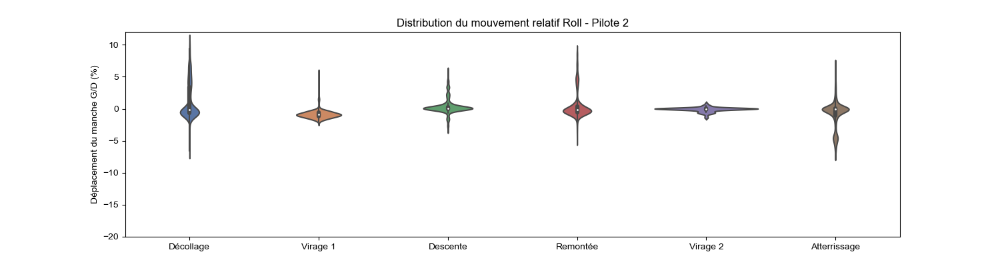

<IPython.core.display.Javascript object>


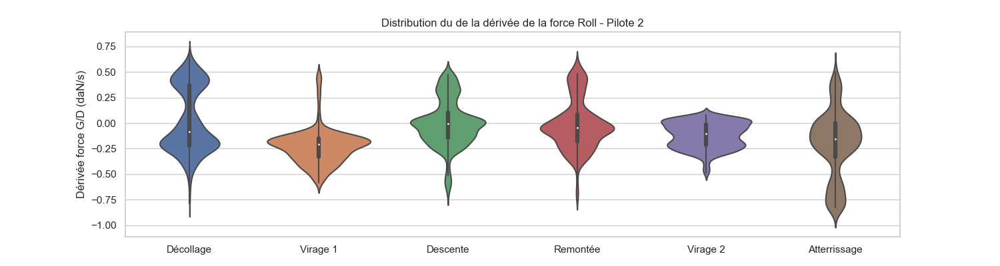

<IPython.core.display.Javascript object>


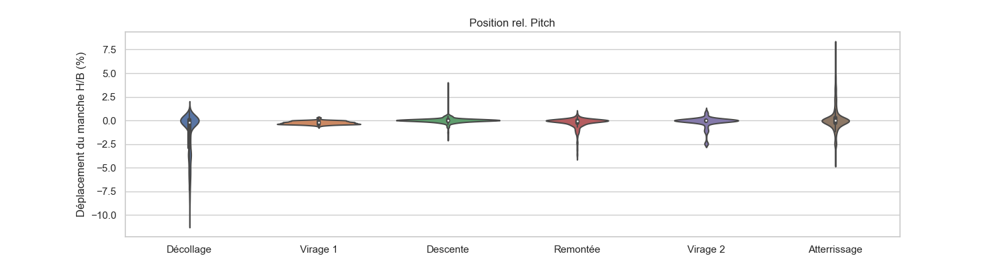

<IPython.core.display.Javascript object>


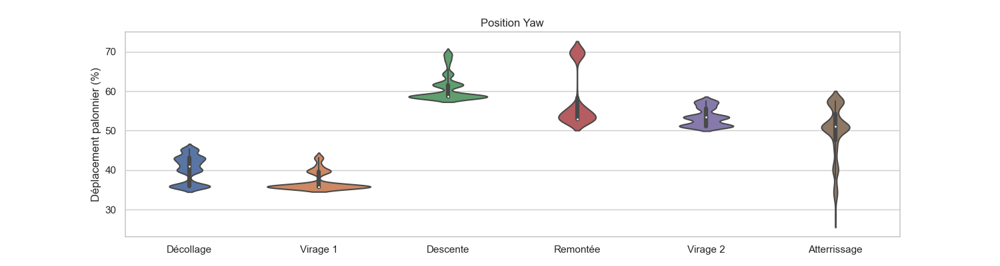

In [12]:
plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 2')
sns.set_theme(style="whitegrid")
sns.violinplot(data=ROLL_P2,gridsize=100)
ylabel("Déplacement du manche G/D (%)")
ylim(-20,12)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 2')
sns.violinplot(data=JRK_P2,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
#ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P2,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P2,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

In [ ]:
# PILOTE 3

plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 3')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P3,gridsize=200)
ylim(-20,12)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 3')
sns.violinplot(data=JRK_P3,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
#ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P3,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P3,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

In [ ]:
# PILOTE 4

plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 4')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P4,gridsize=200)
ylim(-20,12)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 4')
sns.violinplot(data=JRK_P4,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P4,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P4,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

In [ ]:
# PILOTE 5

plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 5')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P5,gridsize=200)
ylim(-20,12)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 5')
sns.violinplot(data=JRK_P5,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P5,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P5,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

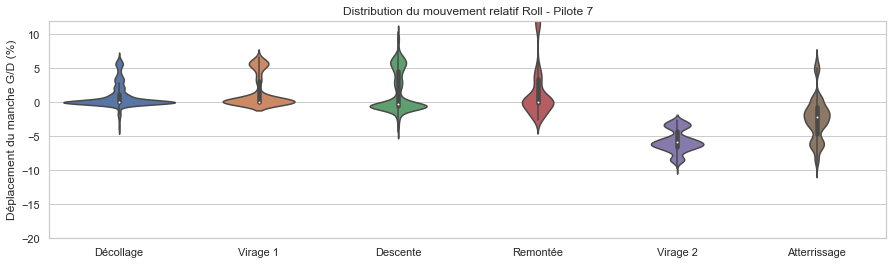

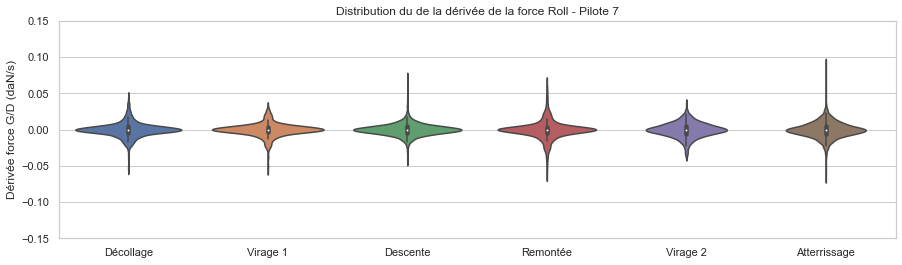

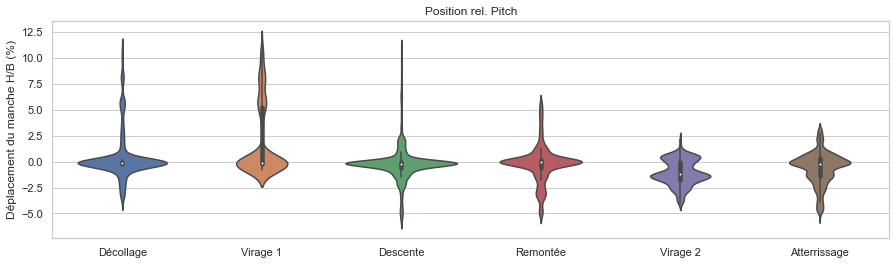

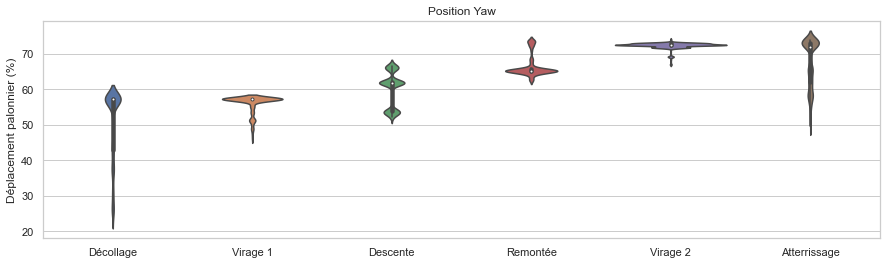

In [254]:
# PILOTE 7

plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 7')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P7,gridsize=200)
ylim(-20,12)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 7')
sns.violinplot(data=JRK_P7,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P7,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P7,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

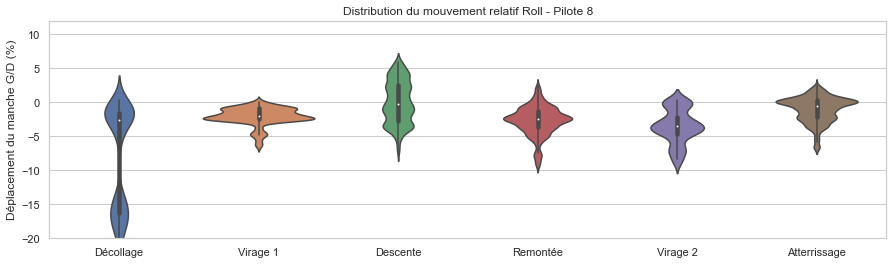

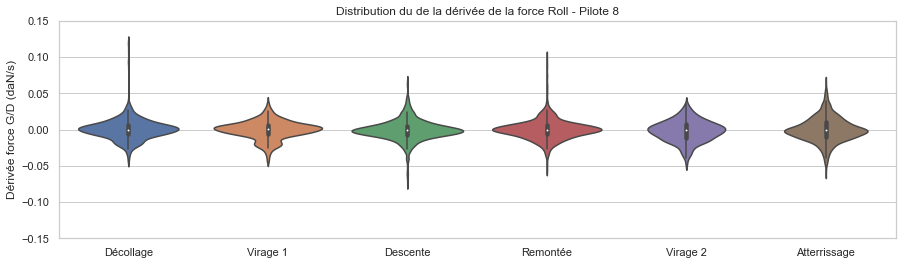

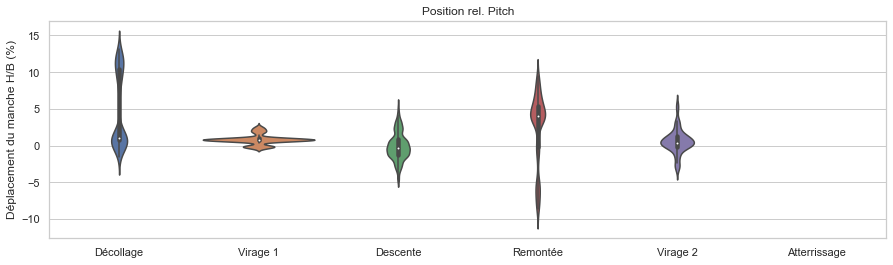

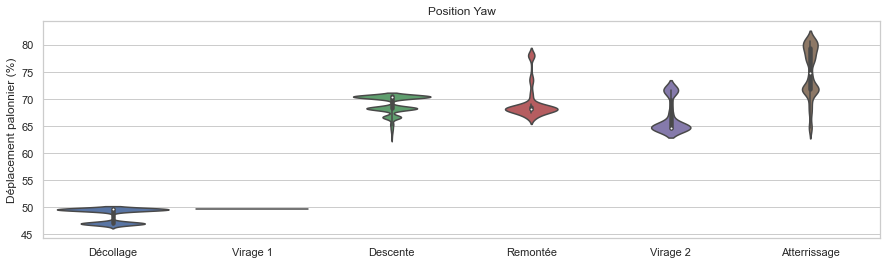

In [255]:
# PILOTE 8

plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 8')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P8,gridsize=200)
ylim(-20,12)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 8')
sns.violinplot(data=JRK_P8,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P8,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P8,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

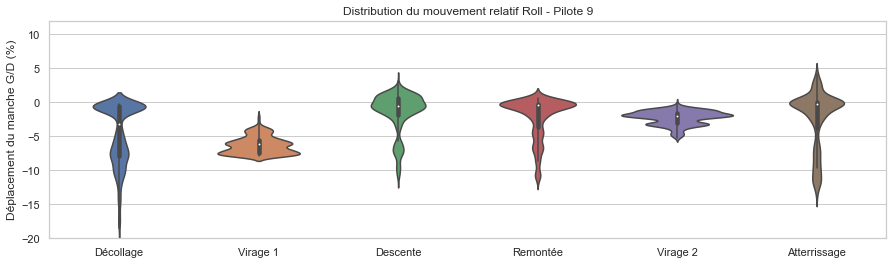

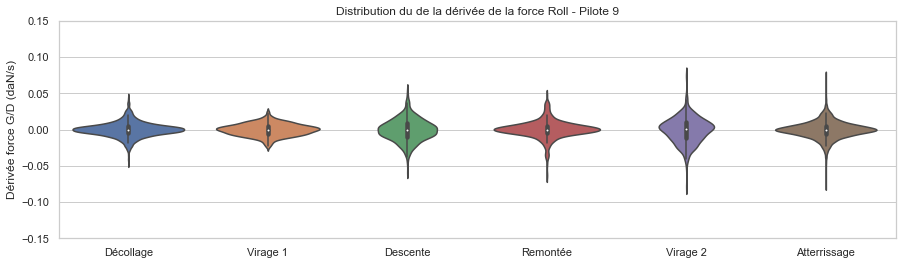

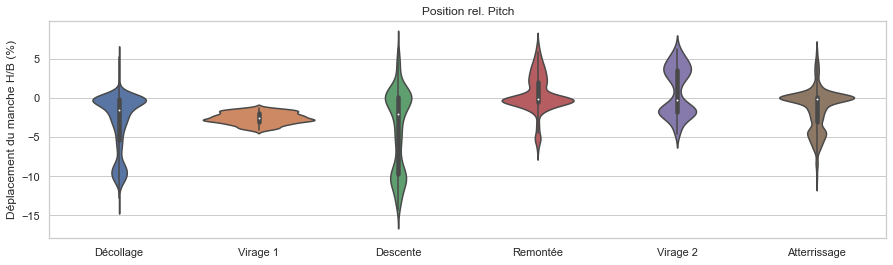

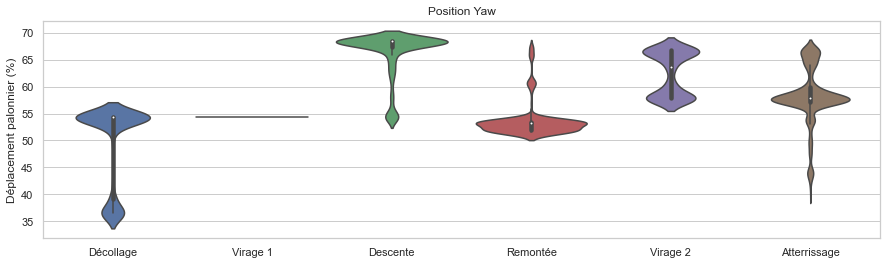

In [256]:
# PILOTE 9

plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 9')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P9,gridsize=200)
ylim(-20,12)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 9')
sns.violinplot(data=JRK_P9,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P9,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P9,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

In [10]:
#ETUDE DU COMPORTEMENT SUR UNE PHASE REPETEE 
#P9

ROLL_P9S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['cmd_roll']-decol1_P9['trim_roll'],
    'Décollage 2S1':decol2_P9['cmd_roll']-decol2_P9['trim_roll'],
    'Décollage 1S2':decol1_P9S2['cmd_roll']-decol1_P9S2['trim_roll'],
    'Décollage 2S2':decol2_P9S2['cmd_roll']-decol2_P9S2['trim_roll'],
    'Décollage 3S2':decol3_P9S2['cmd_roll']-decol3_P9S2['trim_roll'],
    'Décollage 4S2':decol4_P9S2['cmd_roll']-decol4_P9S2['trim_roll'],
    'Décollage 5S2':decol5_P9S2['cmd_roll']-decol5_P9S2['trim_roll'], 
       })

PITCH_P9S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['cmd_pitch']-decol1_P9['trim_pitch'],
    'Décollage 2S1':decol2_P9['cmd_pitch']-decol2_P9['trim_pitch'],
    'Décollage 1S2':decol1_P9S2['cmd_pitch']-decol1_P9S2['trim_pitch'],
    'Décollage 2S2':decol2_P9S2['cmd_pitch']-decol2_P9S2['trim_pitch'],
    'Décollage 3S2':decol3_P9S2['cmd_pitch']-decol3_P9S2['trim_pitch'],
    'Décollage 4S2':decol4_P9S2['cmd_pitch']-decol4_P9S2['trim_pitch'],
    'Décollage 5S2':decol5_P9S2['cmd_pitch']-decol5_P9S2['trim_pitch'], 
       })

YAW_P9S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['cmd_yaw'],
    'Décollage 1S2':decol1_P9S2['cmd_yaw'],
    'Décollage 2S2':decol2_P9S2['cmd_yaw'],      
    'Décollage 3S2':decol3_P9S2['cmd_yaw'],
    'Décollage 4S2':decol4_P9S2['cmd_yaw'],
    'Décollage 5S2':decol5_P9S2['cmd_yaw'],
       })
FROLL_P9S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['force_roll'],
    'Décollage 2S1':decol2_P9['force_roll'],
    'Décollage 1S2':decol1_P9S2['force_roll'],
    'Décollage 2S2':decol2_P9S2['force_roll'],
    'Décollage 3S2':decol3_P9S2['force_roll'],
    'Décollage 4S2':decol4_P9S2['force_roll'],
    'Décollage 5S2':decol5_P9S2['force_roll'], 
       })
FPITCH_P9S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['force_pitch'],
    'Décollage 2S1':decol2_P9['force_pitch'],
    'Décollage 1S2':decol1_P9S2['force_pitch'],
    'Décollage 2S2':decol2_P9S2['force_pitch'],
    'Décollage 3S2':decol3_P9S2['force_pitch'],
    'Décollage 4S2':decol4_P9S2['force_pitch'],
    'Décollage 5S2':decol5_P9S2['force_pitch'], 
       })
FCOLL_P9S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['force_coll'],
    'Décollage 2S1':decol2_P9['force_coll'],
    'Décollage 1S2':decol1_P9S2['force_coll'],
    'Décollage 2S2':decol2_P9S2['force_coll'],
    'Décollage 3S2':decol3_P9S2['force_coll'],
    'Décollage 4S2':decol4_P9S2['force_coll'],
    'Décollage 5S2':decol5_P9S2['force_coll'], 
       })

FYAW_P9S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['force_ryaw'],
    'Décollage 2S1':decol2_P9['force_ryaw'],
    'Décollage 1S2':decol1_P9S2['force_ryaw'],
    'Décollage 2S2':decol2_P9S2['force_ryaw'],      
    'Décollage 3S2':decol3_P9S2['force_ryaw'],
    'Décollage 4S2':decol4_P9S2['force_ryaw'],
    'Décollage 5S2':decol5_P9S2['force_ryaw'],
       })
JRK_P9S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P9['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S1':decol2_P9['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 1S2':decol1_P9S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S2':decol2_P9S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 3S2':decol3_P9S2['force_roll'].rolling(9,1).mean().diff(), 
    'Décollage 4S2':decol4_P9S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 5S2':decol5_P9S2['force_roll'].rolling(9,1).mean().diff()
       })
#P8
ROLL_P8S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['cmd_roll']-decol1_P8['trim_roll'],
    'Décollage 2S1':decol2_P8['cmd_roll']-decol2_P8['trim_roll'],
    'Décollage 1S2':decol1_P8S2['cmd_roll']-decol1_P8S2['trim_roll'],
    'Décollage 2S2':decol2_P8S2['cmd_roll']-decol2_P8S2['trim_roll'],
    'Décollage 3S2':decol3_P8S2['cmd_roll']-decol3_P8S2['trim_roll'],
    'Décollage 4S2':decol4_P8S2['cmd_roll']-decol4_P8S2['trim_roll'],
    'Décollage 5S2':decol5_P8S2['cmd_roll']-decol5_P8S2['trim_roll'], 
       })
PITCH_P8S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['cmd_pitch']-decol1_P8['trim_pitch'],
    'Décollage 2S1':decol2_P8['cmd_pitch']-decol2_P8['trim_pitch'],
    'Décollage 1S2':decol1_P8S2['cmd_pitch']-decol1_P8S2['trim_pitch'],
    'Décollage 2S2':decol2_P8S2['cmd_pitch']-decol2_P8S2['trim_pitch'],
    'Décollage 3S2':decol3_P8S2['cmd_pitch']-decol3_P8S2['trim_pitch'],
    'Décollage 4S2':decol4_P8S2['cmd_pitch']-decol4_P8S2['trim_pitch'],
    'Décollage 5S2':decol5_P8S2['cmd_pitch']-decol5_P8S2['trim_pitch'], 
       })

YAW_P8S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['cmd_yaw'],
    'Décollage 2S1':decol2_P8['cmd_yaw'],
    'Décollage 1S2':decol1_P8S2['cmd_yaw'],
    'Décollage 2S2':decol2_P8S2['cmd_yaw'],      
    'Décollage 3S2':decol3_P8S2['cmd_yaw'],
    'Décollage 4S2':decol4_P8S2['cmd_yaw'],
    'Décollage 5S2':decol5_P8S2['cmd_yaw'],
       })

JRK_P8S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S1':decol2_P8['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 1S2':decol1_P8S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S2':decol2_P8S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 3S2':decol3_P8S2['force_roll'].rolling(9,1).mean().diff(), 
    'Décollage 4S2':decol4_P8S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 5S2':decol5_P8S2['force_roll'].rolling(9,1).mean().diff()
       })
FROLL_P8S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['force_roll'],
    'Décollage 2S1':decol2_P8['force_roll'],
    'Décollage 1S2':decol1_P8S2['force_roll'],
    'Décollage 2S2':decol2_P8S2['force_roll'],
    'Décollage 3S2':decol3_P8S2['force_roll'],
    'Décollage 4S2':decol4_P8S2['force_roll'],
    'Décollage 5S2':decol5_P8S2['force_roll'], 
       })
FPITCH_P8S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['force_pitch'],
    'Décollage 2S1':decol2_P8['force_pitch'],
    'Décollage 1S2':decol1_P8S2['force_pitch'],
    'Décollage 2S2':decol2_P8S2['force_pitch'],
    'Décollage 3S2':decol3_P8S2['force_pitch'],
    'Décollage 4S2':decol4_P8S2['force_pitch'],
    'Décollage 5S2':decol5_P8S2['force_pitch'], 
       })
FCOLL_P8S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['force_coll'],
    'Décollage 2S1':decol2_P8['force_coll'],
    'Décollage 1S2':decol1_P8S2['force_coll'],
    'Décollage 2S2':decol2_P8S2['force_coll'],
    'Décollage 3S2':decol3_P8S2['force_coll'],
    'Décollage 4S2':decol4_P8S2['force_coll'],
    'Décollage 5S2':decol5_P9S2['force_coll'], 
       })

FYAW_P8S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P8['force_ryaw'],
    'Décollage 2S1':decol2_P8['force_ryaw'],
    'Décollage 1S2':decol1_P8S2['force_ryaw'],
    'Décollage 2S2':decol2_P8S2['force_ryaw'],      
    'Décollage 3S2':decol3_P8S2['force_ryaw'],
    'Décollage 4S2':decol4_P8S2['force_ryaw'],
    'Décollage 5S2':decol5_P8S2['force_ryaw'],
       })
#P7
ROLL_P7S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['cmd_roll']-decol1_P7['trim_roll'],
    'Décollage 2S1':decol2_P7['cmd_roll']-decol2_P7['trim_roll'],
    'Décollage 1S2':decol1_P7S2['cmd_roll']-decol1_P7S2['trim_roll'],
    'Décollage 2S2':decol2_P7S2['cmd_roll']-decol2_P7S2['trim_roll'],
    'Décollage 3S2':decol3_P7S2['cmd_roll']-decol3_P7S2['trim_roll'],
    'Décollage 4S2':decol4_P7S2['cmd_roll']-decol4_P7S2['trim_roll'],
    'Décollage 5S2':decol5_P7S2['cmd_roll']-decol5_P7S2['trim_roll'], 
       })
PITCH_P7S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['cmd_pitch']-decol1_P7['trim_pitch'],
    'Décollage 2S1':decol2_P7['cmd_pitch']-decol2_P7['trim_pitch'],
    'Décollage 1S2':decol1_P7S2['cmd_pitch']-decol1_P7S2['trim_pitch'],
    'Décollage 2S2':decol2_P7S2['cmd_pitch']-decol2_P7S2['trim_pitch'],
    'Décollage 3S2':decol3_P7S2['cmd_pitch']-decol3_P7S2['trim_pitch'],
    'Décollage 4S2':decol4_P7S2['cmd_pitch']-decol4_P7S2['trim_pitch'],
    'Décollage 5S2':decol5_P7S2['cmd_pitch']-decol5_P7S2['trim_pitch'], 
       })

YAW_P7S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['cmd_yaw'],
    'Décollage 2S1':decol2_P7['cmd_yaw'],
    'Décollage 1S2':decol1_P7S2['cmd_yaw'],
    'Décollage 2S2':decol2_P7S2['cmd_yaw'],      
    'Décollage 3S2':decol3_P7S2['cmd_yaw'],
    'Décollage 4S2':decol4_P7S2['cmd_yaw'],
    'Décollage 5S2':decol5_P7S2['cmd_yaw'],
       })

JRK_P7S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S1':decol2_P7['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 1S2':decol1_P7S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S2':decol2_P7S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 3S2':decol3_P7S2['force_roll'].rolling(9,1).mean().diff(), 
    'Décollage 4S2':decol4_P7S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 5S2':decol5_P7S2['force_roll'].rolling(9,1).mean().diff()
       })
FROLL_P7S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['force_roll'],
    'Décollage 2S1':decol2_P7['force_roll'],
    'Décollage 1S2':decol1_P7S2['force_roll'],
    'Décollage 2S2':decol2_P7S2['force_roll'],
    'Décollage 3S2':decol3_P7S2['force_roll'],
    'Décollage 4S2':decol4_P7S2['force_roll'],
    'Décollage 5S2':decol5_P7S2['force_roll'], 
       })
FPITCH_P7S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['force_pitch'],
    'Décollage 2S1':decol2_P7['force_pitch'],
    'Décollage 1S2':decol1_P7S2['force_pitch'],
    'Décollage 2S2':decol2_P7S2['force_pitch'],
    'Décollage 3S2':decol3_P7S2['force_pitch'],
    'Décollage 4S2':decol4_P7S2['force_pitch'],
    'Décollage 5S2':decol5_P7S2['force_pitch'], 
       })
FCOLL_P7S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['force_coll'],
    'Décollage 2S1':decol2_P7['force_coll'],
    'Décollage 1S2':decol1_P7S2['force_coll'],
    'Décollage 2S2':decol2_P7S2['force_coll'],
    'Décollage 3S2':decol3_P7S2['force_coll'],
    'Décollage 4S2':decol4_P7S2['force_coll'],
    'Décollage 5S2':decol5_P7S2['force_coll'], 
       })

FYAW_P7S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P7['force_ryaw'],
    'Décollage 2S1':decol2_P7['force_ryaw'],
    'Décollage 1S2':decol1_P7S2['force_ryaw'],
    'Décollage 2S2':decol2_P7S2['force_ryaw'],      
    'Décollage 3S2':decol3_P7S2['force_ryaw'],
    'Décollage 4S2':decol4_P7S2['force_ryaw'],
    'Décollage 5S2':decol5_P7S2['force_ryaw'],
       })
#P5
ROLL_P5S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['cmd_roll']-decol1_P5['trim_roll'],
    'Décollage 2S1':decol2_P5['cmd_roll']-decol2_P5['trim_roll'],
    'Décollage 1S2':decol1_P5S2['cmd_roll']-decol1_P5S2['trim_roll'],
    'Décollage 2S2':decol2_P5S2['cmd_roll']-decol2_P5S2['trim_roll'],
    'Décollage 3S2':decol3_P5S2['cmd_roll']-decol3_P5S2['trim_roll'],
    'Décollage 4S2':decol4_P5S2['cmd_roll']-decol4_P5S2['trim_roll'] 
       })
PITCH_P5S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['cmd_pitch']-decol1_P5['trim_pitch'],
    'Décollage 2S1':decol2_P5['cmd_pitch']-decol2_P5['trim_pitch'],
    'Décollage 1S2':decol1_P5S2['cmd_pitch']-decol1_P5S2['trim_pitch'],
    'Décollage 2S2':decol2_P5S2['cmd_pitch']-decol2_P5S2['trim_pitch'],
    'Décollage 3S2':decol3_P5S2['cmd_pitch']-decol3_P5S2['trim_pitch'],
    'Décollage 4S2':decol4_P5S2['cmd_pitch']-decol4_P5S2['trim_pitch'] 
       })

YAW_P5S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['cmd_yaw'],
    'Décollage 2S1':decol2_P5['cmd_yaw'],
    'Décollage 1S2':decol1_P5S2['cmd_yaw'],
    'Décollage 2S2':decol2_P5S2['cmd_yaw'],      
    'Décollage 3S2':decol3_P5S2['cmd_yaw'],
    'Décollage 4S2':decol4_P5S2['cmd_yaw']
       })

JRK_P5S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S1':decol2_P5['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 1S2':decol1_P5S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S2':decol2_P5S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 3S2':decol3_P5S2['force_roll'].rolling(9,1).mean().diff(), 
    'Décollage 4S2':decol4_P5S2['force_roll'].rolling(9,1).mean().diff()
       })
                       
FROLL_P5S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['force_roll'],
    'Décollage 2S1':decol2_P5['force_roll'],
    'Décollage 1S2':decol1_P5S2['force_roll'],
    'Décollage 2S2':decol2_P5S2['force_roll'],
    'Décollage 3S2':decol3_P5S2['force_roll'],
    'Décollage 4S2':decol4_P5S2['force_roll'],

       })
FPITCH_P5S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['force_pitch'],
    'Décollage 2S1':decol2_P5['force_pitch'],
    'Décollage 1S2':decol1_P5S2['force_pitch'],
    'Décollage 2S2':decol2_P5S2['force_pitch'],
    'Décollage 3S2':decol3_P5S2['force_pitch'],
    'Décollage 4S2':decol4_P5S2['force_pitch'],

       })
FCOLL_P5S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['force_coll'],
    'Décollage 2S1':decol2_P5['force_coll'],
    'Décollage 1S2':decol1_P5S2['force_coll'],
    'Décollage 2S2':decol2_P5S2['force_coll'],
    'Décollage 3S2':decol3_P5S2['force_coll'],
    'Décollage 4S2':decol4_P5S2['force_coll'],

       })

FYAW_P5S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P5['force_ryaw'],
    'Décollage 2S1':decol2_P5['force_ryaw'],
    'Décollage 1S2':decol1_P5S2['force_ryaw'],
    'Décollage 2S2':decol2_P5S2['force_ryaw'],      
    'Décollage 3S2':decol3_P5S2['force_ryaw'],
    'Décollage 4S2':decol4_P5S2['force_ryaw'],

       })

#P3
ROLL_P3S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['cmd_roll']-decol1_P3['trim_roll'],
    'Décollage 2S1':decol2_P3['cmd_roll']-decol2_P3['trim_roll'],
    'Décollage 1S2':decol1_P3S2['cmd_roll']-decol1_P3S2['trim_roll'],
    'Décollage 2S2':decol2_P3S2['cmd_roll']-decol2_P3S2['trim_roll'],
    'Décollage 3S2':decol3_P3S2['cmd_roll']-decol3_P3S2['trim_roll'],
    'Décollage 4S2':decol4_P3S2['cmd_roll']-decol4_P3S2['trim_roll'] 
       })
PITCH_P3S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['cmd_pitch']-decol1_P3['trim_pitch'],
    'Décollage 2S1':decol2_P3['cmd_pitch']-decol2_P3['trim_pitch'],
    'Décollage 1S2':decol1_P3S2['cmd_pitch']-decol1_P3S2['trim_pitch'],
    'Décollage 2S2':decol2_P3S2['cmd_pitch']-decol2_P3S2['trim_pitch'],
    'Décollage 3S2':decol3_P3S2['cmd_pitch']-decol3_P3S2['trim_pitch'],
    'Décollage 4S2':decol4_P3S2['cmd_pitch']-decol4_P3S2['trim_pitch'] 
       })

YAW_P3S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['cmd_yaw'],
    'Décollage 2S1':decol2_P3['cmd_yaw'],
    'Décollage 1S2':decol1_P3S2['cmd_yaw'],
    'Décollage 2S2':decol2_P3S2['cmd_yaw'],      
    'Décollage 3S2':decol3_P3S2['cmd_yaw'],
    'Décollage 4S2':decol4_P3S2['cmd_yaw']
       })

JRK_P3S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S1':decol2_P3['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 1S2':decol1_P3S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S2':decol2_P3S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 3S2':decol3_P3S2['force_roll'].rolling(9,1).mean().diff(), 
    'Décollage 4S2':decol4_P3S2['force_roll'].rolling(9,1).mean().diff()
       })
FROLL_P3S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['force_roll'],
    'Décollage 2S1':decol2_P3['force_roll'],
    'Décollage 1S2':decol1_P3S2['force_roll'],
    'Décollage 2S2':decol2_P3S2['force_roll'],
    'Décollage 3S2':decol3_P3S2['force_roll'],
    'Décollage 4S2':decol4_P3S2['force_roll'],

       })
FPITCH_P3S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['force_pitch'],
    'Décollage 2S1':decol2_P3['force_pitch'],
    'Décollage 1S2':decol1_P3S2['force_pitch'],
    'Décollage 2S2':decol2_P3S2['force_pitch'],
    'Décollage 3S2':decol3_P3S2['force_pitch'],
    'Décollage 4S2':decol4_P3S2['force_pitch'],

       })
FCOLL_P3S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['force_coll'],
    'Décollage 2S1':decol2_P3['force_coll'],
    'Décollage 1S2':decol1_P3S2['force_coll'],
    'Décollage 2S2':decol2_P3S2['force_coll'],
    'Décollage 3S2':decol3_P3S2['force_coll'],
    'Décollage 4S2':decol4_P3S2['force_coll'],

       })

FYAW_P3S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P3['force_ryaw'],
    'Décollage 2S1':decol2_P3['force_ryaw'],
    'Décollage 1S2':decol1_P3S2['force_ryaw'],
    'Décollage 2S2':decol2_P3S2['force_ryaw'],      
    'Décollage 3S2':decol3_P3S2['force_ryaw'],
    'Décollage 4S2':decol4_P3S2['force_ryaw'],

       })
#P2
ROLL_P2S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['cmd_roll']-decol1_P2['trim_roll'],
    'Décollage 2S1':decol2_P2['cmd_roll']-decol2_P2['trim_roll'],
    'Décollage 1S2':decol1_P2S2['cmd_roll']-decol1_P2S2['trim_roll'],
    'Décollage 2S2':decol2_P2S2['cmd_roll']-decol2_P2S2['trim_roll'],
    'Décollage 3S2':decol3_P2S2['cmd_roll']-decol3_P2S2['trim_roll'],
    'Décollage 4S2':decol4_P2S2['cmd_roll']-decol4_P2S2['trim_roll'] 
       })
PITCH_P2S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['cmd_pitch']-decol1_P2['trim_pitch'],
    'Décollage 2S1':decol2_P2['cmd_pitch']-decol2_P2['trim_pitch'],
    'Décollage 1S2':decol1_P2S2['cmd_pitch']-decol1_P2S2['trim_pitch'],
    'Décollage 2S2':decol2_P2S2['cmd_pitch']-decol2_P2S2['trim_pitch'],
    'Décollage 3S2':decol3_P2S2['cmd_pitch']-decol3_P2S2['trim_pitch'],
    'Décollage 4S2':decol4_P2S2['cmd_pitch']-decol4_P2S2['trim_pitch'] 
       })

YAW_P2S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['cmd_yaw'],
    'Décollage 2S1':decol2_P2['cmd_yaw'],
    'Décollage 1S2':decol1_P2S2['cmd_yaw'],
    'Décollage 2S2':decol2_P2S2['cmd_yaw'],      
    'Décollage 3S2':decol3_P2S2['cmd_yaw'],
    'Décollage 4S2':decol4_P2S2['cmd_yaw']
       })

JRK_P2S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S1':decol2_P2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 1S2':decol1_P2S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 2S2':decol2_P2S2['force_roll'].rolling(9,1).mean().diff(),
    'Décollage 3S2':decol3_P2S2['force_roll'].rolling(9,1).mean().diff(), 
    'Décollage 4S2':decol4_P2S2['force_roll'].rolling(9,1).mean().diff()
       })

FROLL_P2S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['force_roll'],
    'Décollage 2S1':decol2_P2['force_roll'],
    'Décollage 1S2':decol1_P2S2['force_roll'],
    'Décollage 2S2':decol2_P2S2['force_roll'],
    'Décollage 3S2':decol3_P2S2['force_roll'],
    'Décollage 4S2':decol4_P2S2['force_roll'],

       })
FPITCH_P2S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['force_pitch'],
    'Décollage 2S1':decol2_P2['force_pitch'],
    'Décollage 1S2':decol1_P2S2['force_pitch'],
    'Décollage 2S2':decol2_P2S2['force_pitch'],
    'Décollage 3S2':decol3_P2S2['force_pitch'],
    'Décollage 4S2':decol4_P2S2['force_pitch'],

       })
FCOLL_P2S2 = pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['force_coll'],
    'Décollage 2S1':decol2_P2['force_coll'],
    'Décollage 1S2':decol1_P2S2['force_coll'],
    'Décollage 2S2':decol2_P2S2['force_coll'],
    'Décollage 3S2':decol3_P2S2['force_coll'],
    'Décollage 4S2':decol4_P2S2['force_coll'],

       })

FYAW_P2S2=pd.DataFrame(data={
    'Décollage 1S1':decol1_P2['force_ryaw'],
    'Décollage 2S1':decol2_P2['force_ryaw'],
    'Décollage 1S2':decol1_P2S2['force_ryaw'],
    'Décollage 2S2':decol2_P2S2['force_ryaw'],      
    'Décollage 3S2':decol3_P2S2['force_ryaw'],
    'Décollage 4S2':decol4_P2S2['force_ryaw'],
   
       })

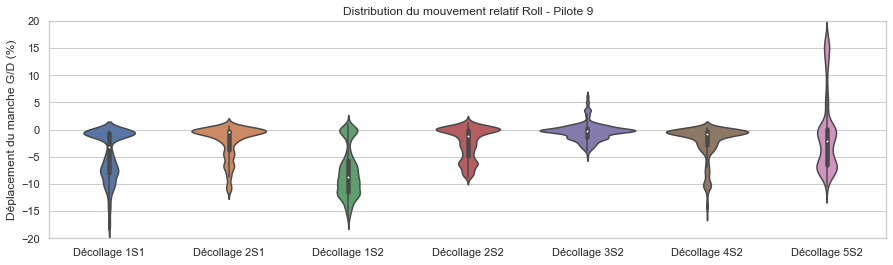

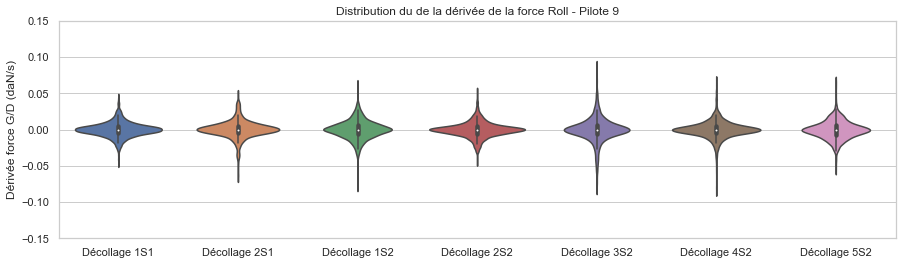

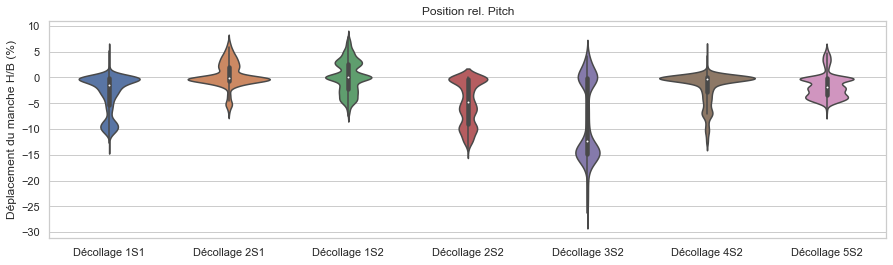

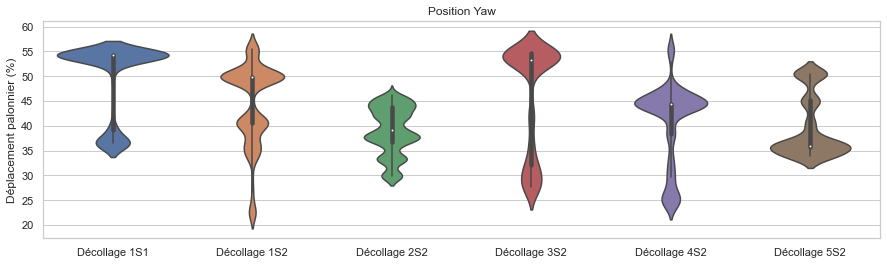

In [258]:
plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 9')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P9S2,gridsize=200)
ylim(-20,20)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 9')
sns.violinplot(data=JRK_P9S2,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P9S2,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P9S2,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

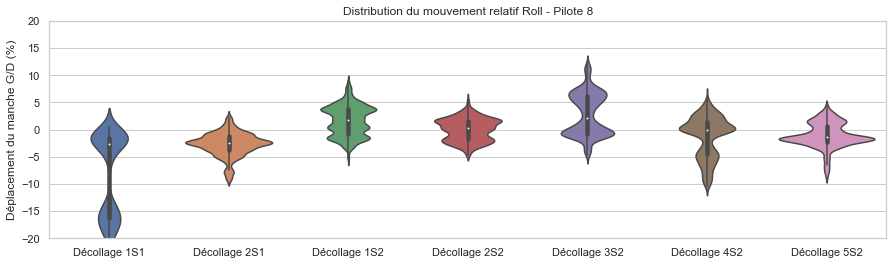

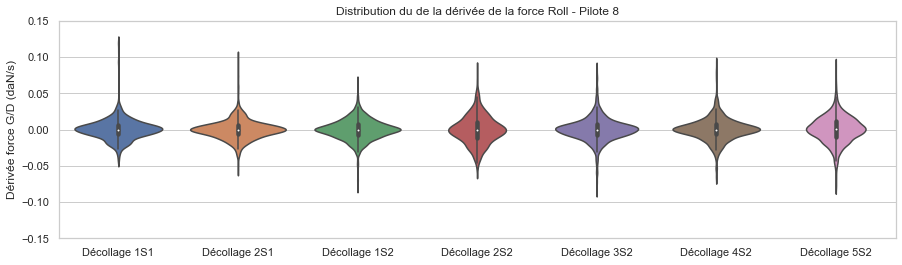

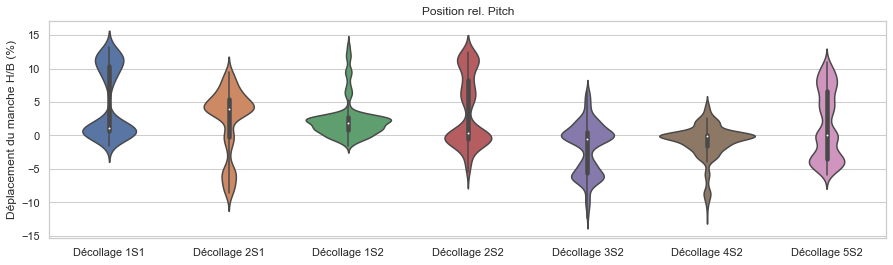

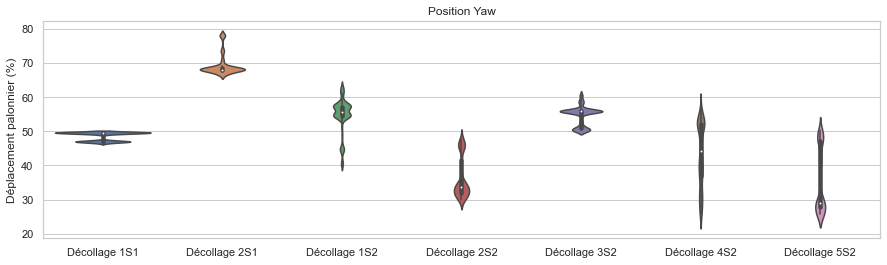

In [259]:
plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 8')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P8S2,gridsize=200)
ylim(-20,20)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 8')
sns.violinplot(data=JRK_P8S2,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P8S2,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P8S2,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

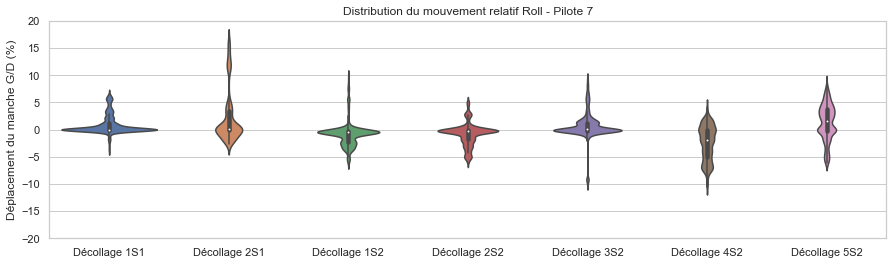

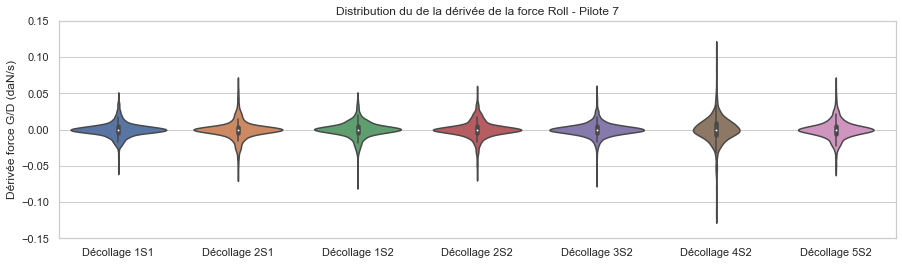

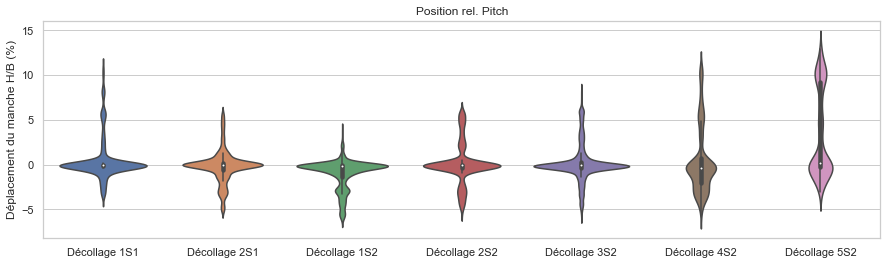

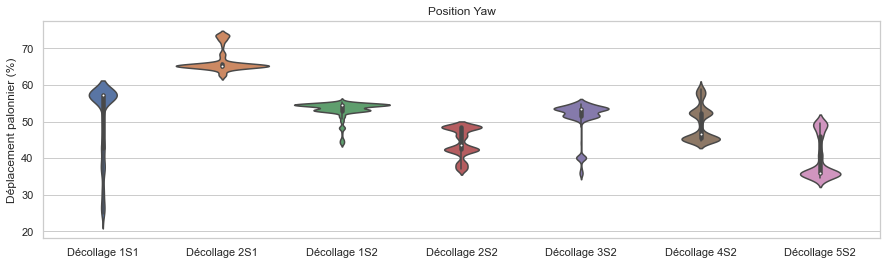

In [260]:
plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 7')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P7S2,gridsize=200)
ylim(-20,20)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 7')
sns.violinplot(data=JRK_P7S2,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P7S2,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P7S2,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

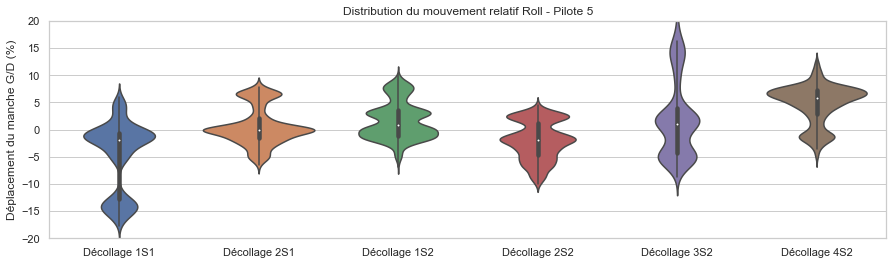

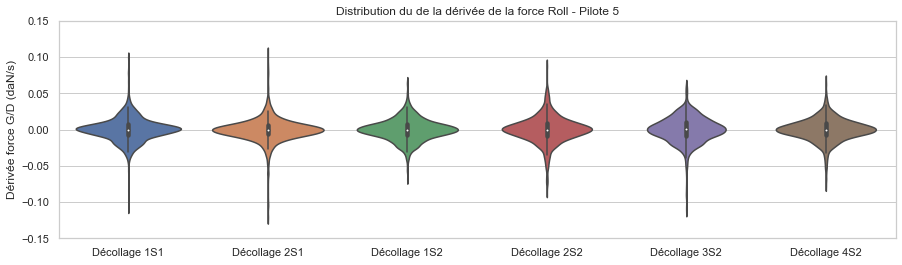

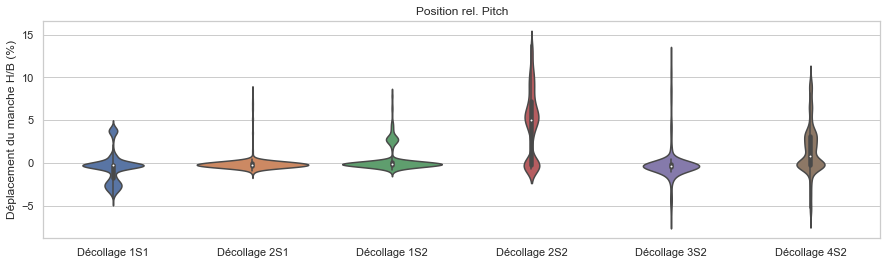

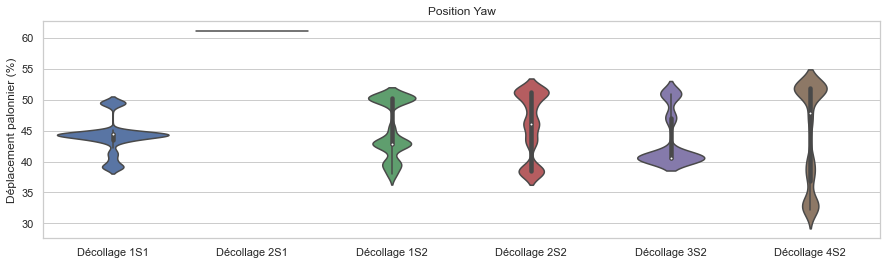

In [261]:
plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 5')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P5S2,gridsize=200)
ylim(-20,20)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 5')
sns.violinplot(data=JRK_P5S2,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P5S2,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P5S2,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

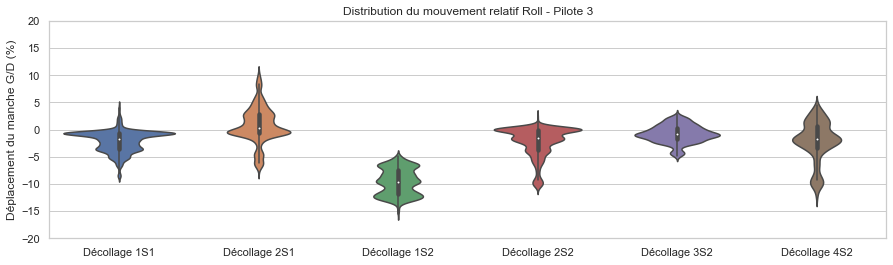

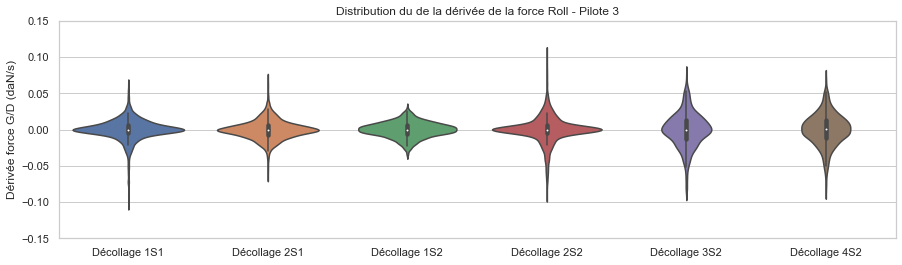

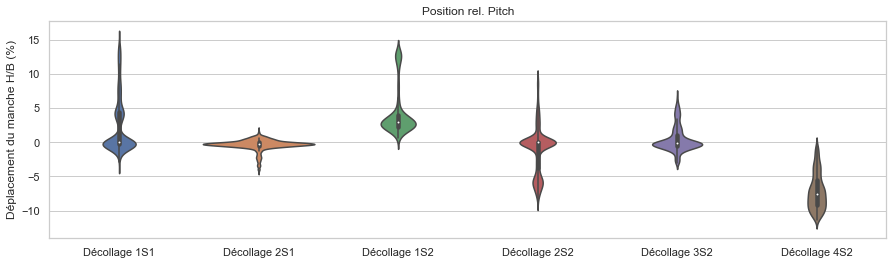

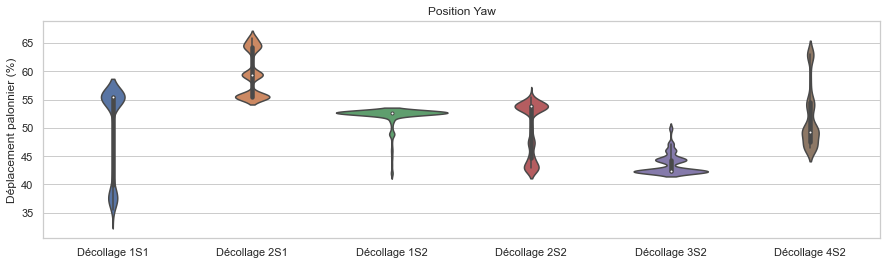

In [262]:
plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 3')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P3S2,gridsize=200)
ylim(-20,20)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 3')
sns.violinplot(data=JRK_P3S2,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P3S2,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P3S2,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

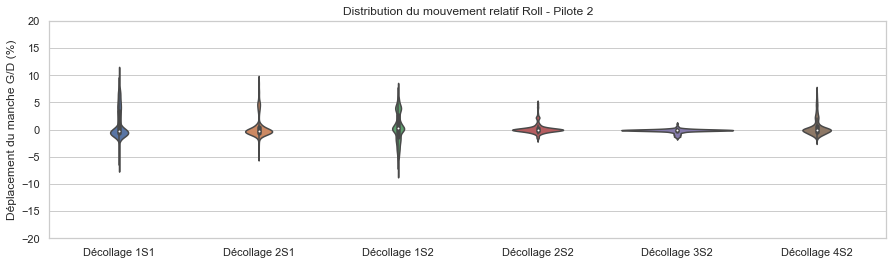

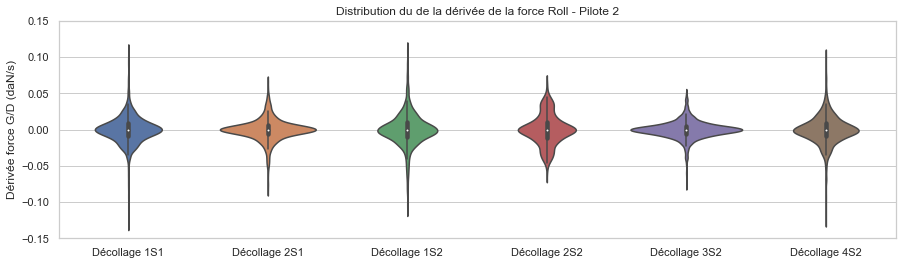

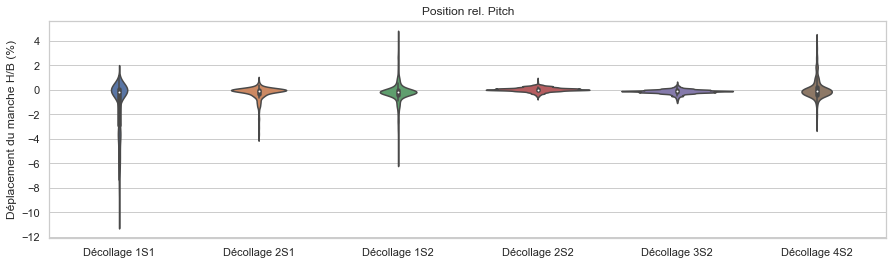

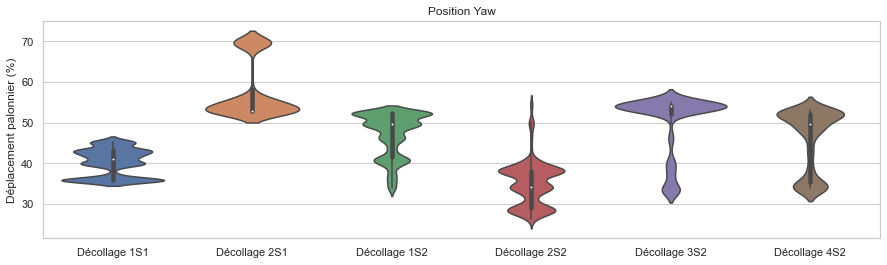

In [263]:
plt.figure(figsize=(15,4))
plt.title('Distribution du mouvement relatif Roll - Pilote 2')
sns.set_theme(style="whitegrid")
ylabel("Déplacement du manche G/D (%)")
sns.violinplot(data=ROLL_P2S2,gridsize=200)
ylim(-20,20)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution du de la dérivée de la force Roll - Pilote 2')
sns.violinplot(data=JRK_P2S2,gridsize=200)
ylabel("Dérivée force G/D (daN/s)")
ylim(-0.15,0.15)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position rel. Pitch')
sns.violinplot(data=PITCH_P2S2,gridsize=200)
ylabel("Déplacement du manche H/B (%)")
plt.show()

plt.figure(figsize=(15,4))
plt.title('Position Yaw')
sns.violinplot(data=YAW_P2S2,gridsize=200)
ylabel("Déplacement palonnier (%)")
plt.show()

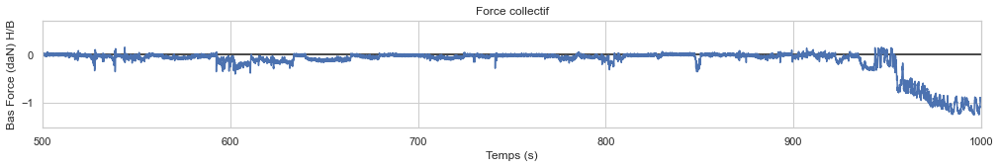

C:\Users\THALES\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7558: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


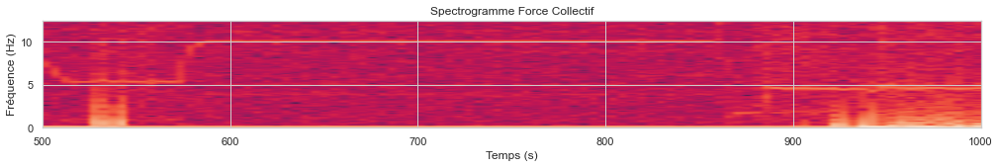

In [264]:
plt.figure(figsize=(17,2))
title('Force collectif')
plt.plot(data_P8['reltime'],data_P8['force_roll'])
hlines(0,1,3202,'k')
xlim(500,1000)
xlabel('Temps (s)')
ylabel('Bas Force (daN) H/B')
plt.show()


plt.figure(figsize=(17,2))
title('Spectrogramme Force Collectif')
specgram(data_P8['force_coll'],Fs=25)
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
xlim(500,1000)
#hlines(5,20,3202,'tab:orange')
#plt.rcParams["axes.grid"] = False
plt.show()


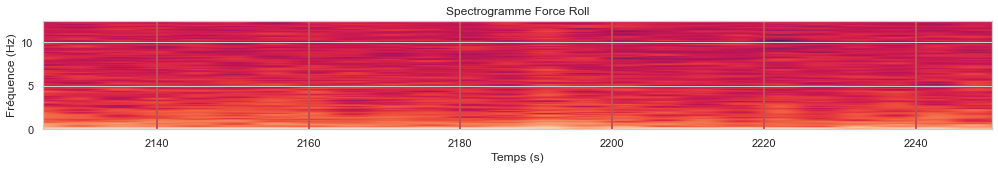

In [265]:
plt.figure(figsize=(17,2))
title("Spectrogramme Force Roll")
specgram(data_P8['force_roll'],Fs=25)
xlabel('Temps (s)')
ylabel('Fréquence (Hz)')
grid(color='r', linestyle='-',axis='x', linewidth=2)
#hlines(5,20,3180,'tab:orange')
xlim(2125,2250)
plt.show()

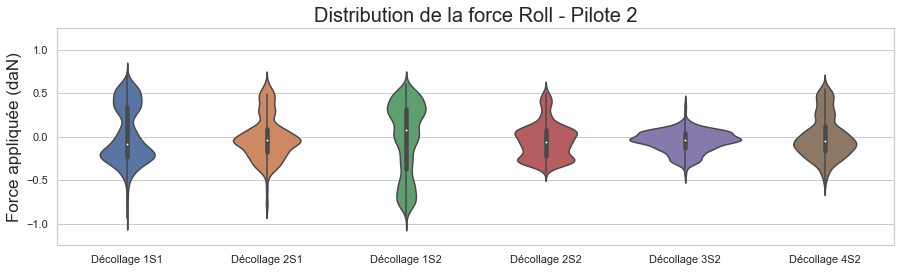

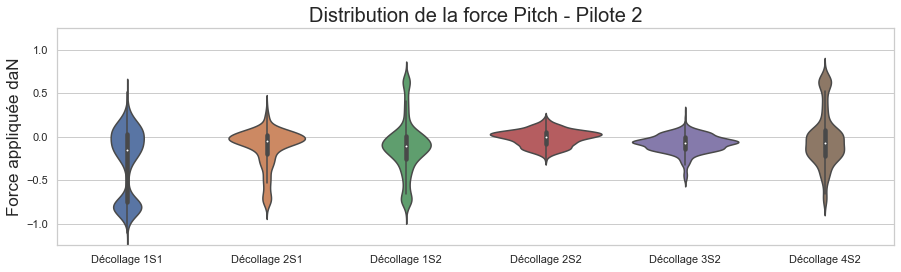

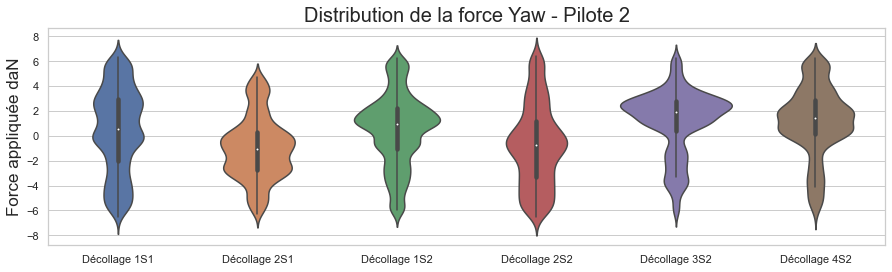

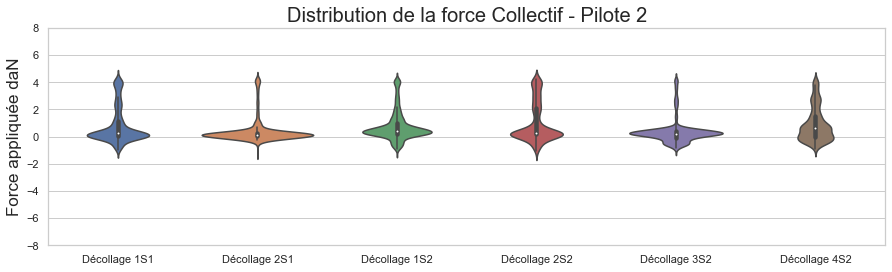

In [271]:
plt.figure(figsize=(15,4))
plt.title('Distribution de la force Roll - Pilote 2',fontsize=20)
#sns.set_theme(style="whitegrid")
ylabel("Force appliquée (daN)",fontsize=17)
sns.violinplot(data=FROLL_P2S2,gridsize=200)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Pitch - Pilote 2',fontsize=20)
sns.violinplot(data=FPITCH_P2S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Yaw - Pilote 2',fontsize=20)
sns.violinplot(data=FYAW_P2S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Collectif - Pilote 2',fontsize=20)
sns.violinplot(data=FCOLL_P2S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-8,8)
plt.show()


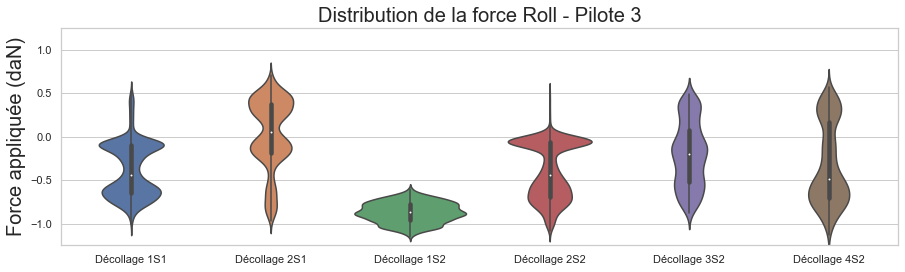

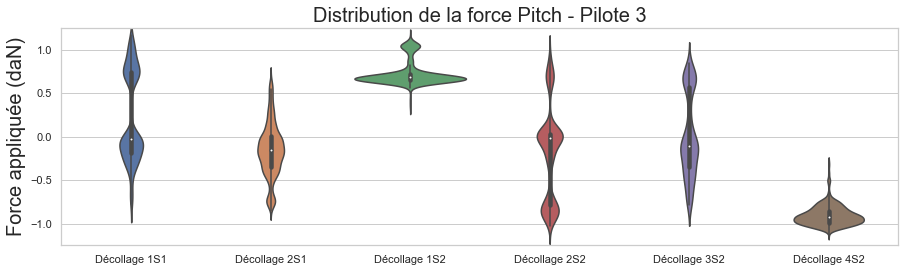

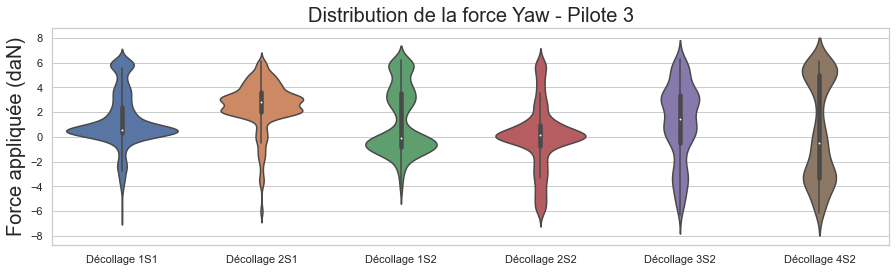

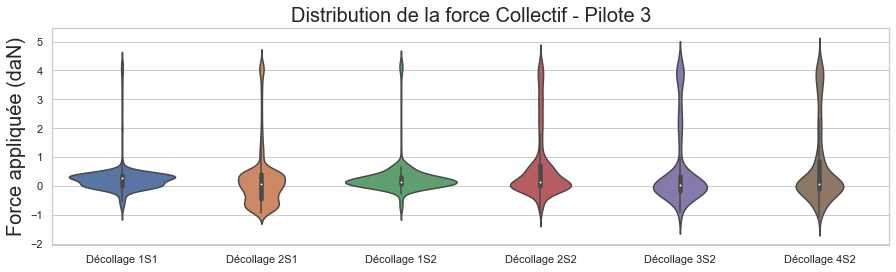

In [275]:
plt.figure(figsize=(15,4))
plt.title('Distribution de la force Roll - Pilote 3',fontsize=20)
#sns.set_theme(style="whitegrid")
ylabel("Force appliquée (daN)",fontsize=20)
sns.violinplot(data=FROLL_P3S2,gridsize=200)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Pitch - Pilote 3',fontsize=20)
sns.violinplot(data=FPITCH_P3S2,gridsize=200)
ylabel("Force appliquée (daN)",fontsize=20)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Yaw - Pilote 3',fontsize=20)
sns.violinplot(data=FYAW_P3S2,gridsize=200)
ylabel("Force appliquée (daN)",fontsize=20)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Collectif - Pilote 3',fontsize=20)
sns.violinplot(data=FCOLL_P3S2,gridsize=200)
ylabel("Force appliquée (daN)",fontsize=20)
#ylim(-0.15,0.15)
plt.show()


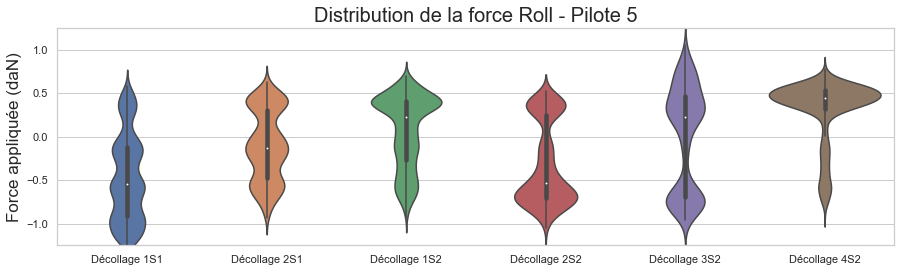

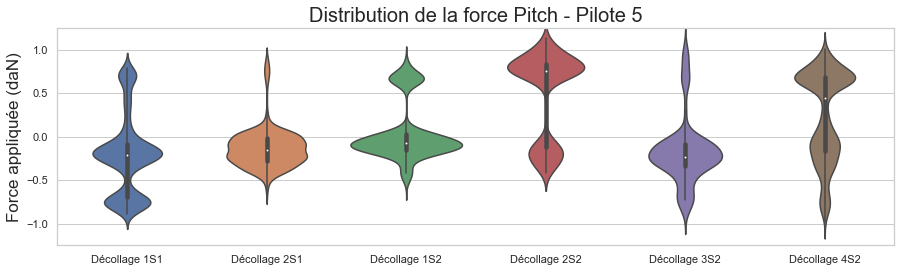

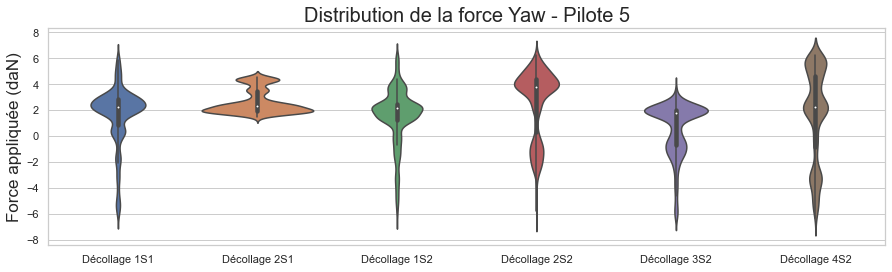

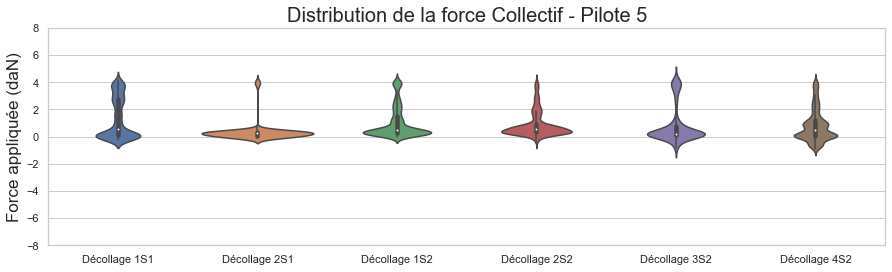

In [278]:
plt.figure(figsize=(15,4))
plt.title('Distribution de la force Roll - Pilote 5',fontsize=20)
#sns.set_theme(style="whitegrid")
ylabel("Force appliquée (daN)",fontsize=17)
sns.violinplot(data=FROLL_P5S2,gridsize=200)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Pitch - Pilote 5',fontsize=20)
sns.violinplot(data=FPITCH_P5S2,gridsize=200)
ylabel("Force appliquée (daN)",fontsize=17)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Yaw - Pilote 5',fontsize=20)
sns.violinplot(data=FYAW_P5S2,gridsize=200)
ylabel("Force appliquée (daN)",fontsize=17)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Collectif - Pilote 5',fontsize=20)
sns.violinplot(data=FCOLL_P5S2,gridsize=200)
ylabel("Force appliquée (daN)",fontsize=17)
ylim(-8,8)
plt.show()


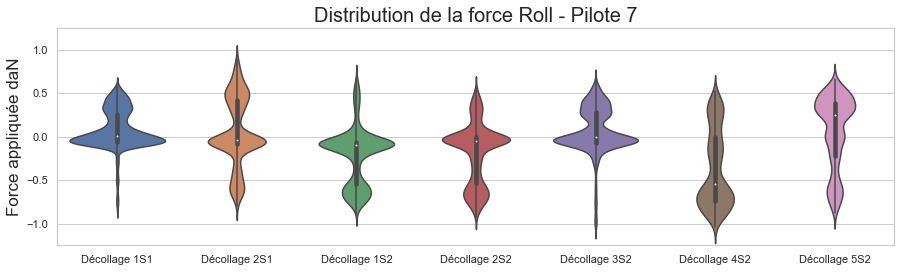

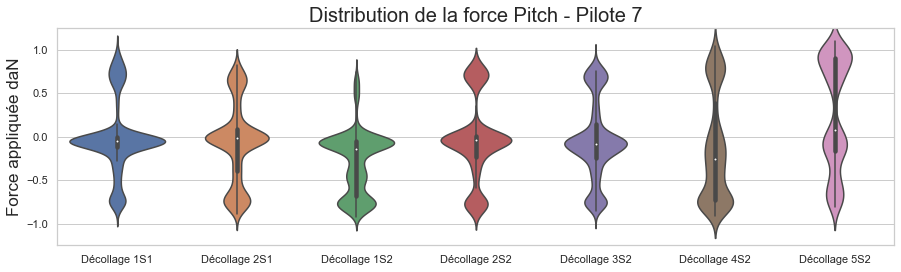

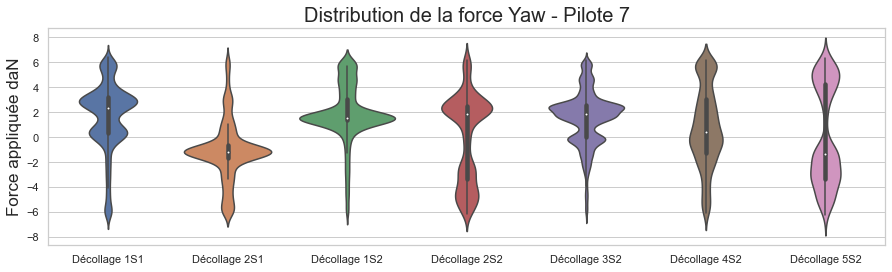

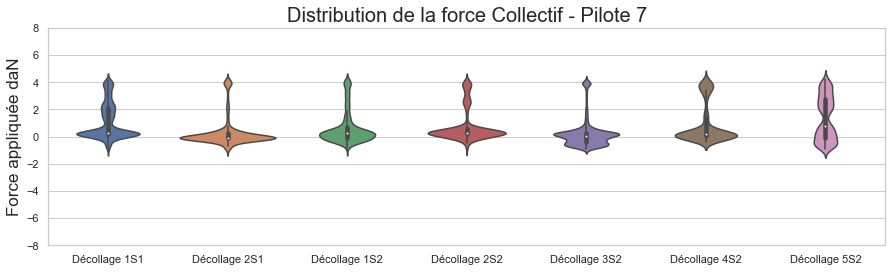

In [280]:
plt.figure(figsize=(15,4))
plt.title('Distribution de la force Roll - Pilote 7',fontsize=20)
#sns.set_theme(style="whitegrid")
ylabel("Force appliquée daN",fontsize=17)
sns.violinplot(data=FROLL_P7S2,gridsize=200)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Pitch - Pilote 7',fontsize=20)
sns.violinplot(data=FPITCH_P7S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Yaw - Pilote 7',fontsize=20)
sns.violinplot(data=FYAW_P7S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Collectif - Pilote 7',fontsize=20)
sns.violinplot(data=FCOLL_P7S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-8,8)
plt.show()


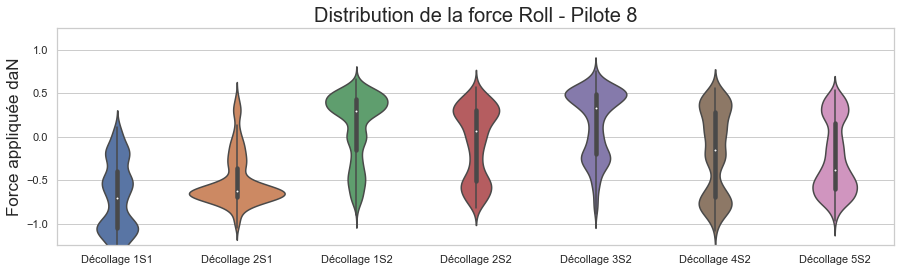

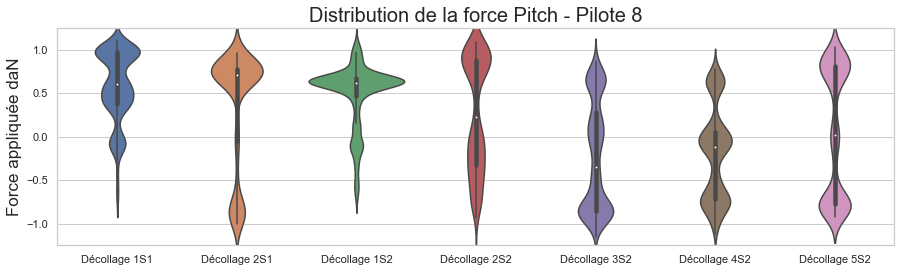

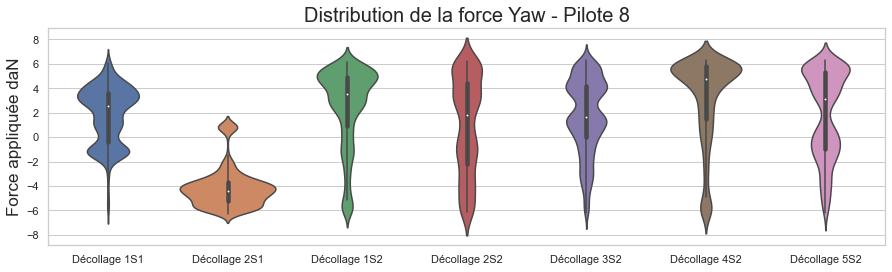

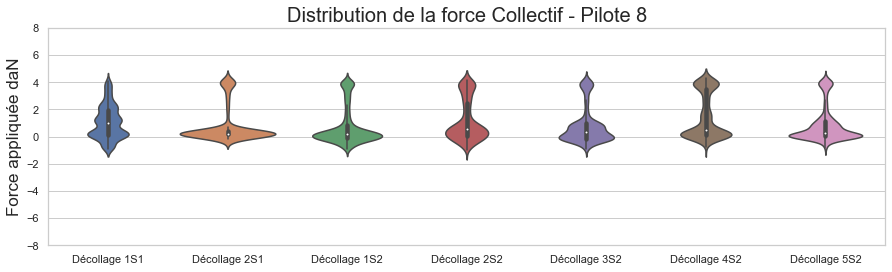

In [281]:
plt.figure(figsize=(15,4))
plt.title('Distribution de la force Roll - Pilote 8',fontsize=20)
#sns.set_theme(style="whitegrid")
ylabel("Force appliquée daN",fontsize=17)
sns.violinplot(data=FROLL_P8S2,gridsize=200)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Pitch - Pilote 8',fontsize=20)
sns.violinplot(data=FPITCH_P8S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Yaw - Pilote 8',fontsize=20)
sns.violinplot(data=FYAW_P8S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Collectif - Pilote 8',fontsize=20)
sns.violinplot(data=FCOLL_P8S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-8,8)
plt.show()

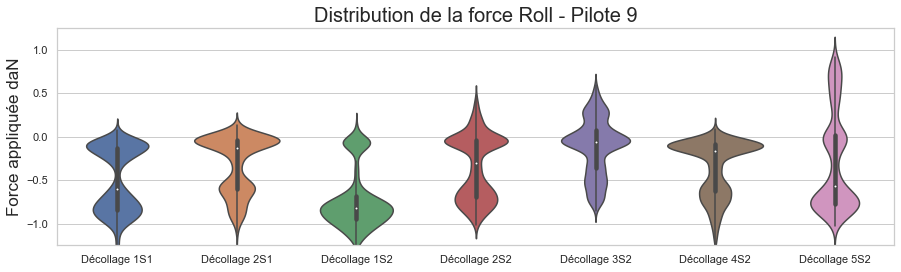

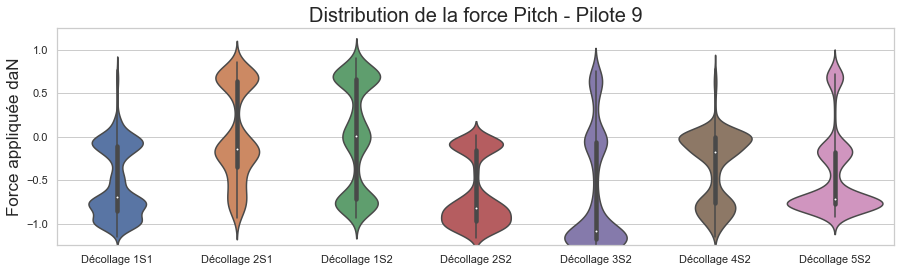

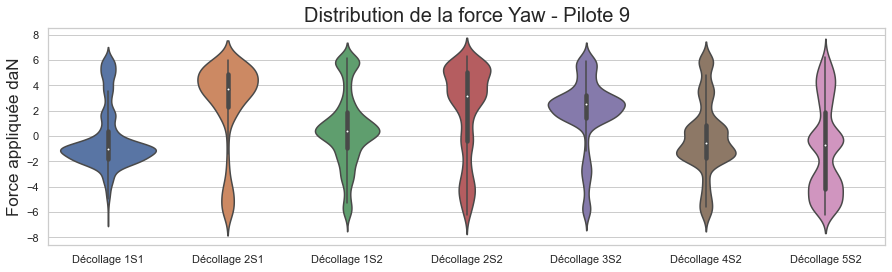

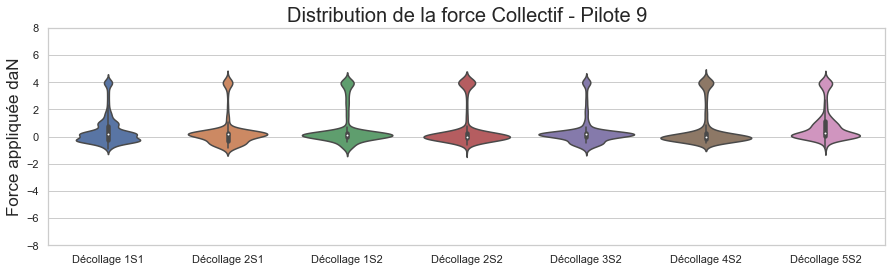

In [282]:
plt.figure(figsize=(15,4))
plt.title('Distribution de la force Roll - Pilote 9',fontsize=20)
#sns.set_theme(style="whitegrid")
ylabel("Force appliquée daN",fontsize=17)
sns.violinplot(data=FROLL_P9S2,gridsize=200)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Pitch - Pilote 9',fontsize=20)
sns.violinplot(data=FPITCH_P9S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-1.25,1.25)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Yaw - Pilote 9',fontsize=20)
sns.violinplot(data=FYAW_P9S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
plt.show()

plt.figure(figsize=(15,4))
plt.title('Distribution de la force Collectif - Pilote 9',fontsize=20)
sns.violinplot(data=FCOLL_P9S2,gridsize=200)
ylabel("Force appliquée daN",fontsize=17)
ylim(-8,8)
plt.show()

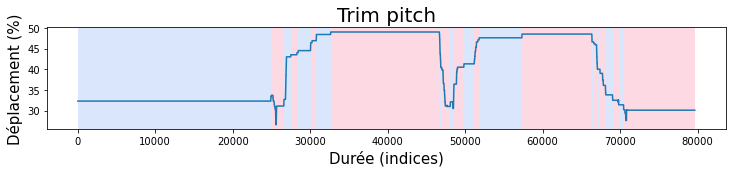

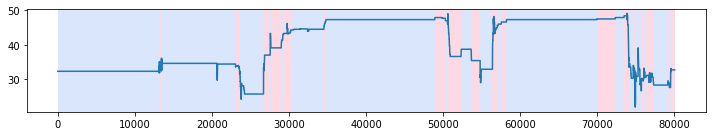

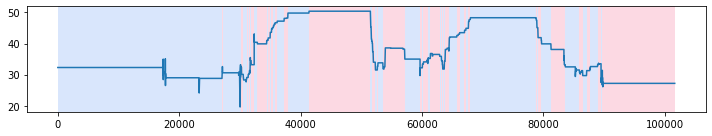

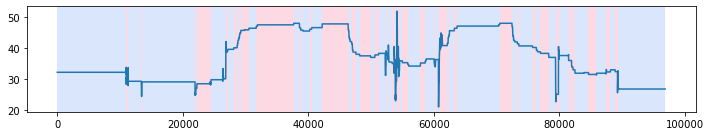

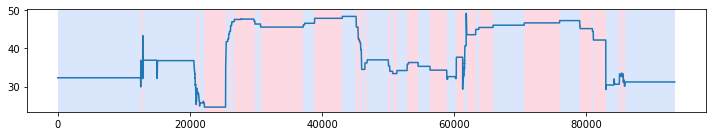

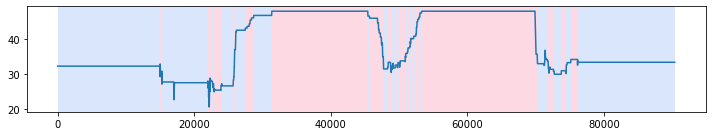

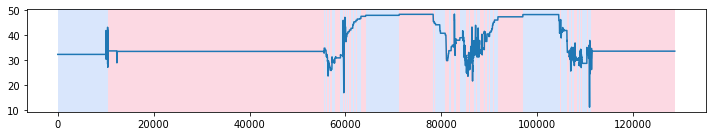

In [11]:
%matplotlib inline
nb_ruptures_pitch = []
algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P9['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
nb_ruptures_pitch.append(len(result))

rpt.display(data_P9['trim_pitch'].to_numpy(), result)
title("Trim pitch",fontsize=20)
xlabel('Durée (indices)',fontsize=15)
ylabel('Déplacement (%)',fontsize=15)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P8['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P8['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch.append(len(result))
plt.show()

algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P7['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P7['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P5['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P5['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P4['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P4['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P3['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P3['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P2['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch.append(len(result))
plt.show()


In [12]:
from sklearn.preprocessing import normalize

In [13]:
exp_pilotes=[2100,2450,1840,300,965,1000,5000]

In [14]:
exp_pilotes=np.array(exp_pilotes)
nb_ruptures_pitch=np.array(nb_ruptures_pitch)

In [15]:
exp_pilotes_norm=(exp_pilotes-exp_pilotes.mean())/4700
nb_ruptures_pitch_norm=(nb_ruptures_pitch)/nb_ruptures_pitch.max()

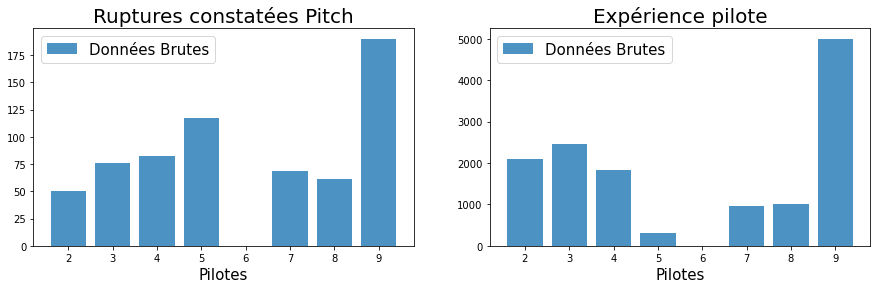

In [16]:
figure(figsize=(15,4))
subplot(1,2,1)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch, alpha=0.8,label='Données Brutes',width=0.8,color='')
legend(fontsize=15)
title("Ruptures constatées Pitch",fontsize=20)
xlabel("Pilotes",fontsize=15)
subplot(1,2,2)
plt.bar([2,3,4,5,7,8,9],exp_pilotes,alpha=0.8,label='Données Brutes')
legend(fontsize=15)
title("Expérience pilote",fontsize=20)
xlabel("Pilotes",fontsize=15)
show()

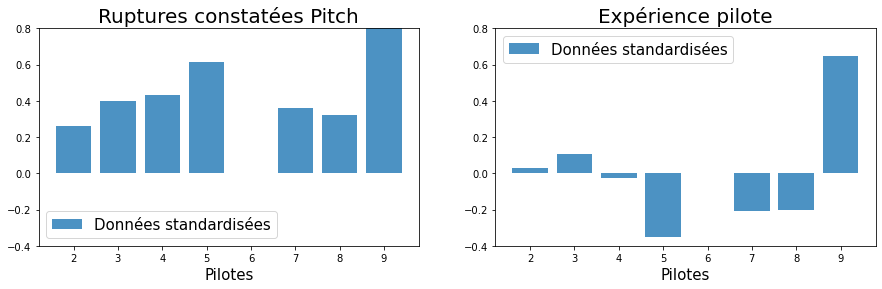

In [17]:
figure(figsize=(15,4))
subplot(1,2,1)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch_norm, alpha=0.8,label='Données standardisées',width=0.8)
legend(fontsize=15)
title("Ruptures constatées Pitch",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(-0.4,0.8)
subplot(1,2,2)
plt.bar([2,3,4,5,7,8,9],exp_pilotes_norm,alpha=0.8,label='Données standardisées')
legend(fontsize=15)
title("Expérience pilote",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(-0.4,0.8)
show()

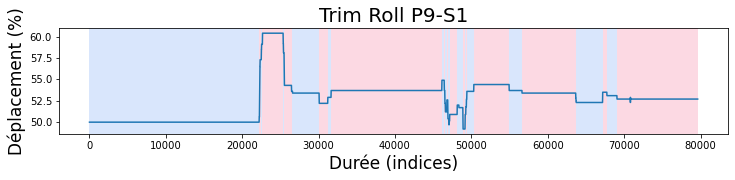

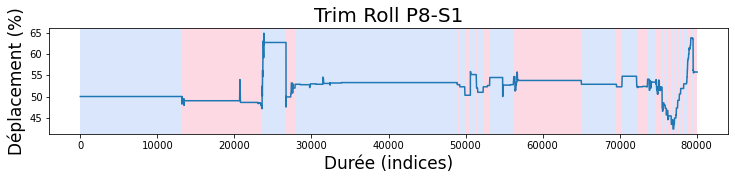

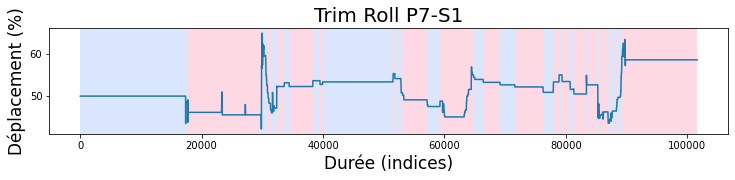

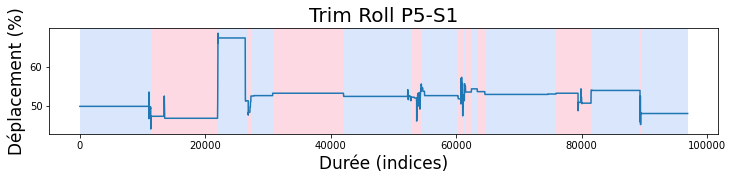

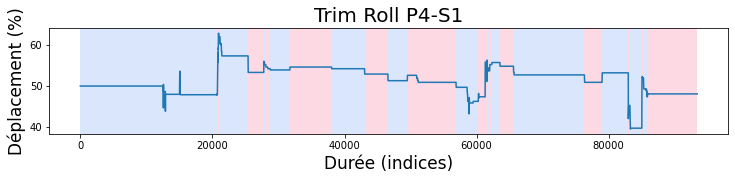

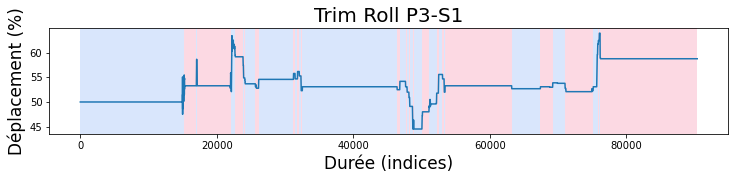

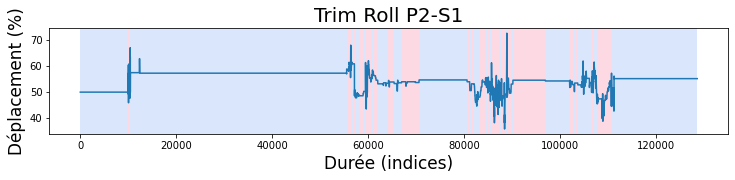

In [19]:
nb_ruptures_roll = []
algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P9['trim_roll'].to_numpy())
result = algo.predict(pen=50)
nb_ruptures_roll.append(len(result))

rpt.display(data_P9['trim_roll'].to_numpy(), result)
title("Trim Roll P9-S1",fontsize=20)
xlabel('Durée (indices)',fontsize=17)
ylabel('Déplacement (%)',fontsize=17)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P8['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P8['trim_roll'].to_numpy(), result)
nb_ruptures_roll.append(len(result))
title("Trim Roll P8-S1",fontsize=20)
xlabel('Durée (indices)',fontsize=17)
ylabel('Déplacement (%)',fontsize=17)
plt.show()

algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P7['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P7['trim_roll'].to_numpy(), result)
nb_ruptures_roll.append(len(result))
title("Trim Roll P7-S1",fontsize=20)
xlabel('Durée (indices)',fontsize=17)
ylabel('Déplacement (%)',fontsize=17)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P5['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P5['trim_roll'].to_numpy(), result)
nb_ruptures_roll.append(len(result))
title("Trim Roll P5-S1",fontsize=20)
xlabel('Durée (indices)',fontsize=17)
ylabel('Déplacement (%)',fontsize=17)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P4['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P4['trim_roll'].to_numpy(), result)
nb_ruptures_roll.append(len(result))
title("Trim Roll P4-S1",fontsize=20)
xlabel('Durée (indices)',fontsize=17)
ylabel('Déplacement (%)',fontsize=17)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P3['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P3['trim_roll'].to_numpy(), result)
nb_ruptures_roll.append(len(result))
title("Trim Roll P3-S1",fontsize=20)
xlabel('Durée (indices)',fontsize=17)
ylabel('Déplacement (%)',fontsize=17)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P2['trim_roll'].to_numpy(), result)
nb_ruptures_roll.append(len(result))
title("Trim Roll P2-S1",fontsize=20)
xlabel('Durée (indices)',fontsize=17)
ylabel('Déplacement (%)',fontsize=17)
plt.show()

In [20]:
exp_pilotes=np.array(exp_pilotes)
nb_ruptures_roll=np.array(nb_ruptures_roll)

In [21]:
exp_pilotes_norm=(exp_pilotes-exp_pilotes.mean())/4700
nb_ruptures_roll_norm=nb_ruptures_roll/(nb_ruptures_roll.max())

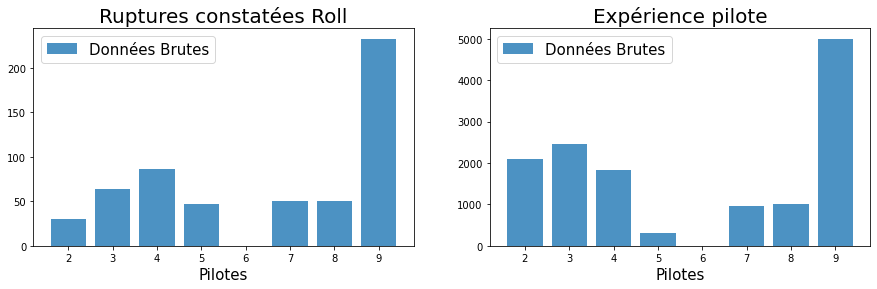

In [22]:
figure(figsize=(15,4))
subplot(1,2,1)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll, alpha=0.8,label='Données Brutes',width=0.8)
legend(fontsize=15)
title("Ruptures constatées Roll",fontsize=20)
xlabel("Pilotes",fontsize=15)
subplot(1,2,2)
plt.bar([2,3,4,5,7,8,9],exp_pilotes,alpha=0.8,label='Données Brutes')
legend(fontsize=15)
title("Expérience pilote",fontsize=20)
xlabel("Pilotes",fontsize=15)
show()

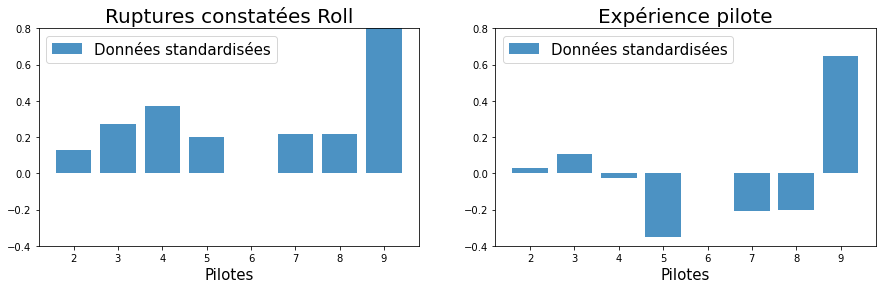

In [23]:
figure(figsize=(15,4))
subplot(1,2,1)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll_norm, alpha=0.8,label='Données standardisées',width=0.8)
legend(fontsize=15)
title("Ruptures constatées Roll",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(-0.4,0.8)
subplot(1,2,2)
plt.bar([2,3,4,5,7,8,9],exp_pilotes_norm,alpha=0.8,label='Données standardisées')
legend(fontsize=15)
title("Expérience pilote",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(-0.4,0.8)
show()


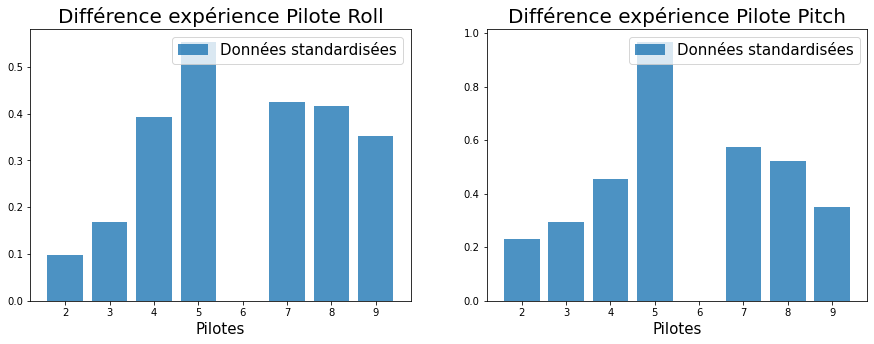

In [24]:
figure(figsize=(15,5))
subplot(1,2,1)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll_norm-exp_pilotes_norm,alpha=0.8,label='Données standardisées')
legend(fontsize=15)
title("Différence expérience Pilote Roll",fontsize=20)
xlabel("Pilotes",fontsize=15)

subplot(1,2,2)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch_norm-exp_pilotes_norm,alpha=0.8,label='Données standardisées')
legend(fontsize=15)
title("Différence expérience Pilote Pitch",fontsize=20)
xlabel("Pilotes",fontsize=15)

show()

In [ ]:
exp_pilotes_norm

In [ ]:
nb_ruptures_pitch_S2 = []
algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P9S2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
nb_ruptures_pitch_S2.append(len(result))

rpt.display(data_P9S2['trim_pitch'].to_numpy(), result)
title("Trim pitch Scénario 2",fontsize=20)
xlabel('Durée (indices)',fontsize=15)
ylabel('Déplacement (%)',fontsize=15)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P8S2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P8S2['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch_S2.append(len(result))
plt.show()

algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P7S2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P7S2['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P5S2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P5S2['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P4S2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P4S2['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P3S2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P3S2['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P2S2['trim_pitch'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P2S2['trim_pitch'].to_numpy(), result)
nb_ruptures_pitch_S2.append(len(result))
plt.show()

In [158]:
nb_ruptures_pitch_S2=np.array(nb_ruptures_pitch_S2)
nb_ruptures_pitch_S2_norm=(nb_ruptures_pitch_S2)/500

<IPython.core.display.Javascript object>


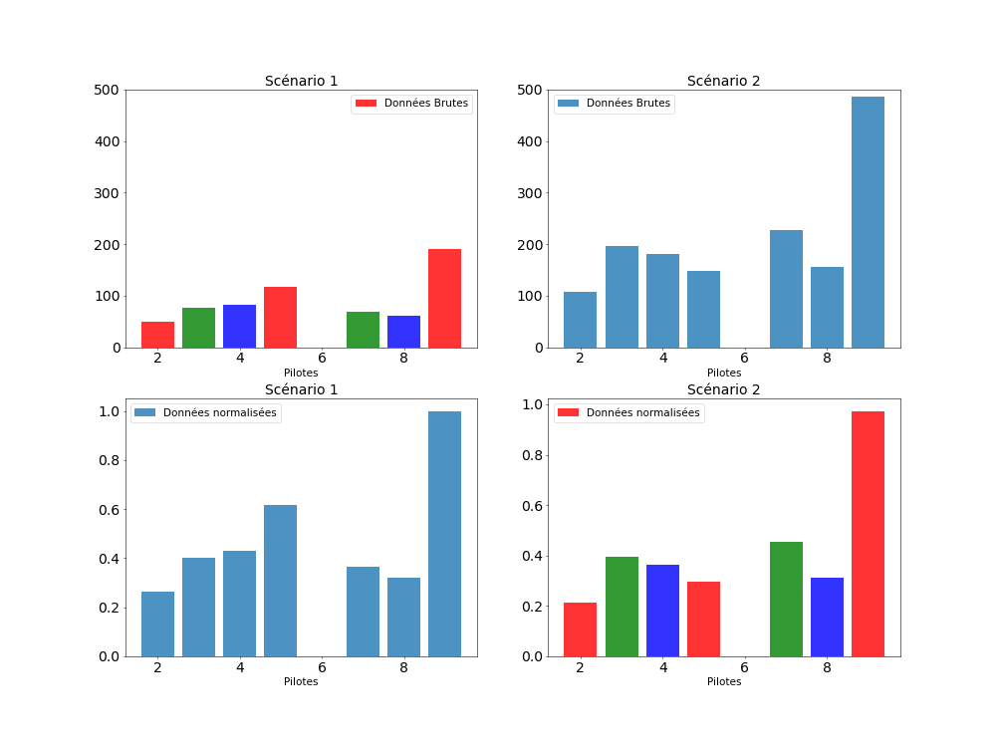

<ipython-input-215-4ef5d12ec0dc>:4: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated since 3.2 and will be removed two minor releases later. Use an explicit list instead.
  plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch, alpha=0.8,label='Données Brutes',width=0.8,color='rgb')
<ipython-input-215-4ef5d12ec0dc>:26: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated since 3.2 and will be removed two minor releases later. Use an explicit list instead.
  plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch_S2_norm,alpha=0.8,label='Données normalisées',color='rgb')


In [215]:
figure(figsize=(20,15))

subplot(2,2,1)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch, alpha=0.8,label='Données Brutes',width=0.8,color='rgb')
legend(fontsize=15)
title("Scénario 1",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(0,500)

subplot(2,2,2)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch_S2,alpha=0.8,label='Données Brutes')
legend(fontsize=15)
title("Scénario 2",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(0,500)

subplot(2,2,3)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch_norm, alpha=0.8,label='Données normalisées',width=0.8)
legend(fontsize=15)
title("Scénario 1",fontsize=20)
xlabel("Pilotes",fontsize=15)
ax.tick_params(labelsize=30)


subplot(2,2,4)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_pitch_S2_norm,alpha=0.8,label='Données normalisées',color='rgb')
legend(fontsize=15)
title("Scénario 2",fontsize=20)
xlabel("Pilotes",fontsize=15)


show()

In [213]:
nb_ruptures_pitch,nb_ruptures_pitch_S2

(array([ 50,  76,  82, 117,  69,  61, 190]),
 array([107, 197, 181, 148, 228, 155, 487]))

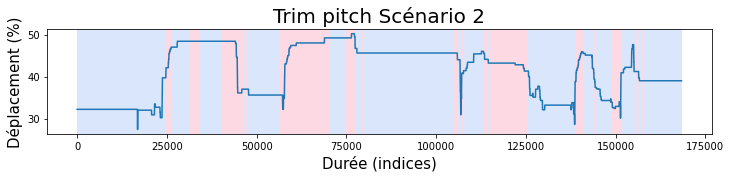

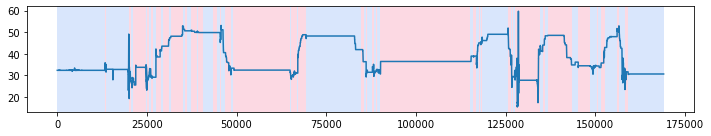

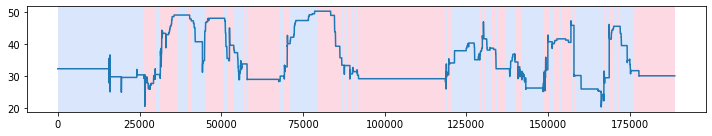

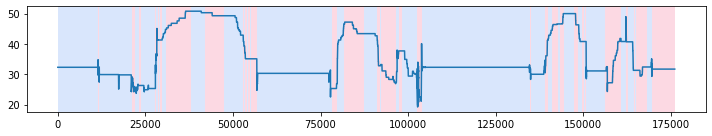

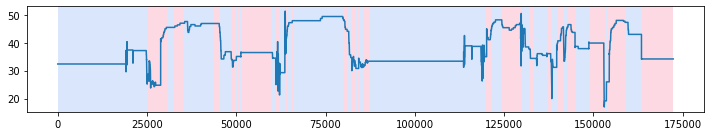

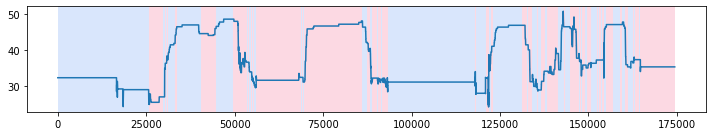

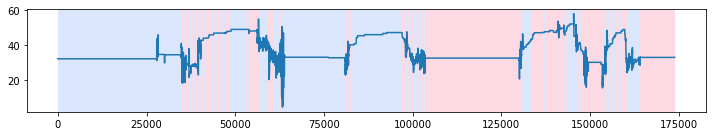

In [36]:
nb_ruptures_roll_S2 = []
algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P9S2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
nb_ruptures_roll_S2.append(len(result))

rpt.display(data_P9S2['trim_pitch'].to_numpy(), result)
title("Trim pitch Scénario 2",fontsize=20)
xlabel('Durée (indices)',fontsize=15)
ylabel('Déplacement (%)',fontsize=15)
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P8S2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P8S2['trim_pitch'].to_numpy(), result)
nb_ruptures_roll_S2.append(len(result))
plt.show()

algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P7S2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P7S2['trim_pitch'].to_numpy(), result)
nb_ruptures_roll_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P5S2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P5S2['trim_pitch'].to_numpy(), result)
nb_ruptures_roll_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P4S2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P4S2['trim_pitch'].to_numpy(), result)
nb_ruptures_roll_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P3S2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P3S2['trim_pitch'].to_numpy(), result)
nb_ruptures_roll_S2.append(len(result))
plt.show()


algo = rpt.KernelCPD(kernel='linear', min_size=2).fit(data_P2S2['trim_roll'].to_numpy())
result = algo.predict(pen=50)
rpt.display(data_P2S2['trim_pitch'].to_numpy(), result)
nb_ruptures_roll_S2.append(len(result))
plt.show()

In [37]:
nb_ruptures_roll_S2=np.array(nb_ruptures_roll_S2)
nb_ruptures_roll_S2_norm=(nb_ruptures_roll_S2)/nb_ruptures_roll_S2.max()

In [38]:
matplotlib.colors.cnames

{'aliceblue': '#F0F8FF',
 'antiquewhite': '#FAEBD7',
 'aqua': '#00FFFF',
 'aquamarine': '#7FFFD4',
 'azure': '#F0FFFF',
 'beige': '#F5F5DC',
 'bisque': '#FFE4C4',
 'black': '#000000',
 'blanchedalmond': '#FFEBCD',
 'blue': '#0000FF',
 'blueviolet': '#8A2BE2',
 'brown': '#A52A2A',
 'burlywood': '#DEB887',
 'cadetblue': '#5F9EA0',
 'chartreuse': '#7FFF00',
 'chocolate': '#D2691E',
 'coral': '#FF7F50',
 'cornflowerblue': '#6495ED',
 'cornsilk': '#FFF8DC',
 'crimson': '#DC143C',
 'cyan': '#00FFFF',
 'darkblue': '#00008B',
 'darkcyan': '#008B8B',
 'darkgoldenrod': '#B8860B',
 'darkgray': '#A9A9A9',
 'darkgreen': '#006400',
 'darkgrey': '#A9A9A9',
 'darkkhaki': '#BDB76B',
 'darkmagenta': '#8B008B',
 'darkolivegreen': '#556B2F',
 'darkorange': '#FF8C00',
 'darkorchid': '#9932CC',
 'darkred': '#8B0000',
 'darksalmon': '#E9967A',
 'darkseagreen': '#8FBC8F',
 'darkslateblue': '#483D8B',
 'darkslategray': '#2F4F4F',
 'darkslategrey': '#2F4F4F',
 'darkturquoise': '#00CED1',
 'darkviolet': '#9400D3

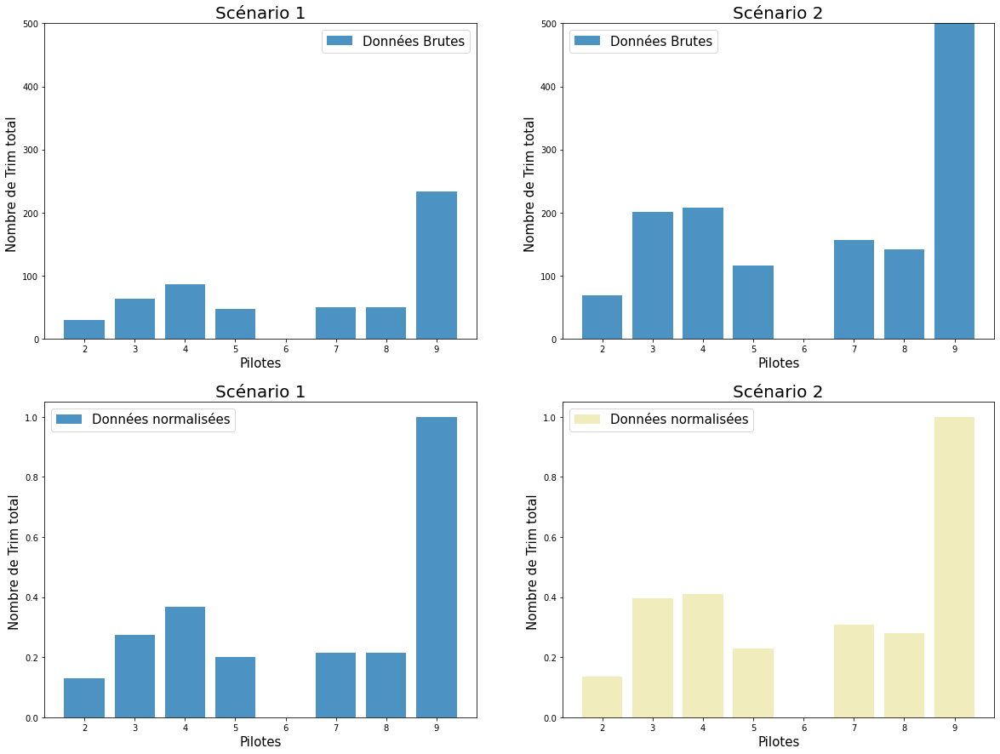

In [40]:
figure(figsize=(20,15))

subplot(2,2,1)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll, alpha=0.8,label='Données Brutes',width=0.8)
legend(fontsize=15)
title("Scénario 1",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(0,500)
ylabel('Nombre de Trim total ',fontsize=15)
subplot(2,2,2)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll_S2,alpha=0.8,label='Données Brutes')
legend(fontsize=15)
title("Scénario 2",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylim(0,500)
ylabel('Nombre de Trim total ',fontsize=15)
subplot(2,2,3)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll_norm, alpha=0.8,label='Données normalisées',width=0.8)
legend(fontsize=15)
title("Scénario 1",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylabel('Nombre de Trim total ',fontsize=15)


subplot(2,2,4)
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll_S2_norm,alpha=0.8,label='Données normalisées',color='#EEE8AA')
legend(fontsize=15)
title("Scénario 2",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylabel('Nombre de Trim total ',fontsize=15)

show()

0           0.001
1           0.010
2           0.050
3           0.090
4           0.130
           ...   
80060    3201.882
80061    3201.922
80062    3201.962
80063    3202.002
80064    3202.042
Name: reltime, Length: 80065, dtype: float64

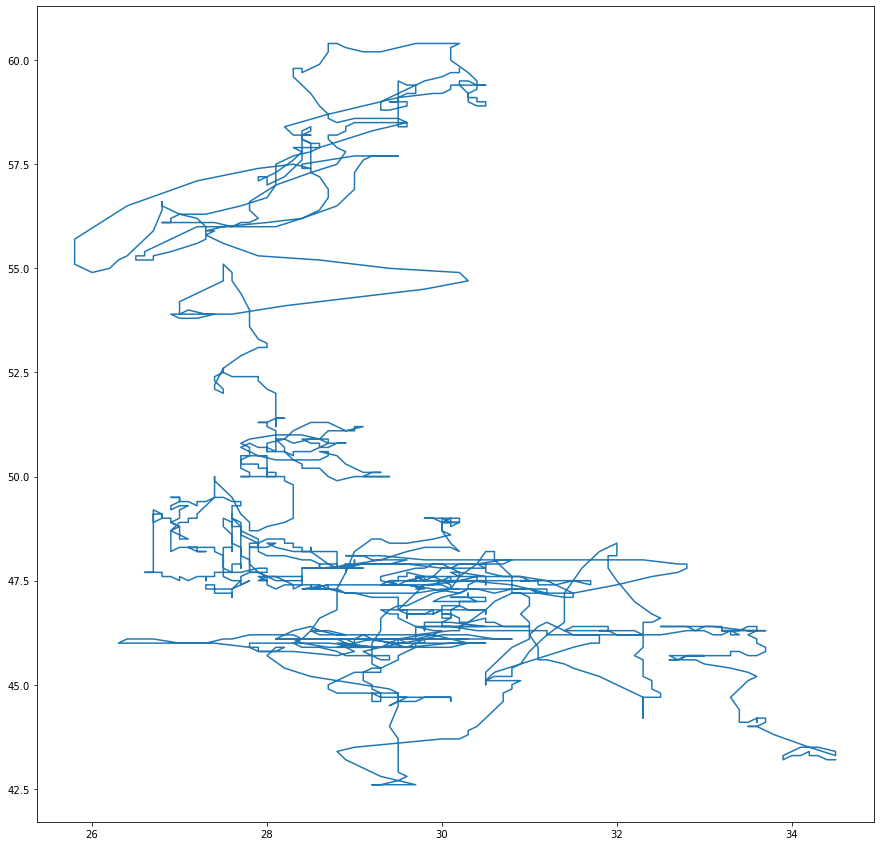

In [162]:
figure(figsize=(15,15))
plot(stationnaire_P8['cmd_pitch'],stationnaire_P8['cmd_roll'])
data_P8['reltime']

In [168]:
pitch8=np.array(stationnaire_P8['cmd_pitch'])
roll8=np.array(stationnaire_P8['cmd_roll'])

In [173]:
pitch8=(pitch8-pitch8.mean())/(pitch8.max()-pitch8.min())
roll8=(roll8-roll8.mean())/(roll8.max()-roll8.min())

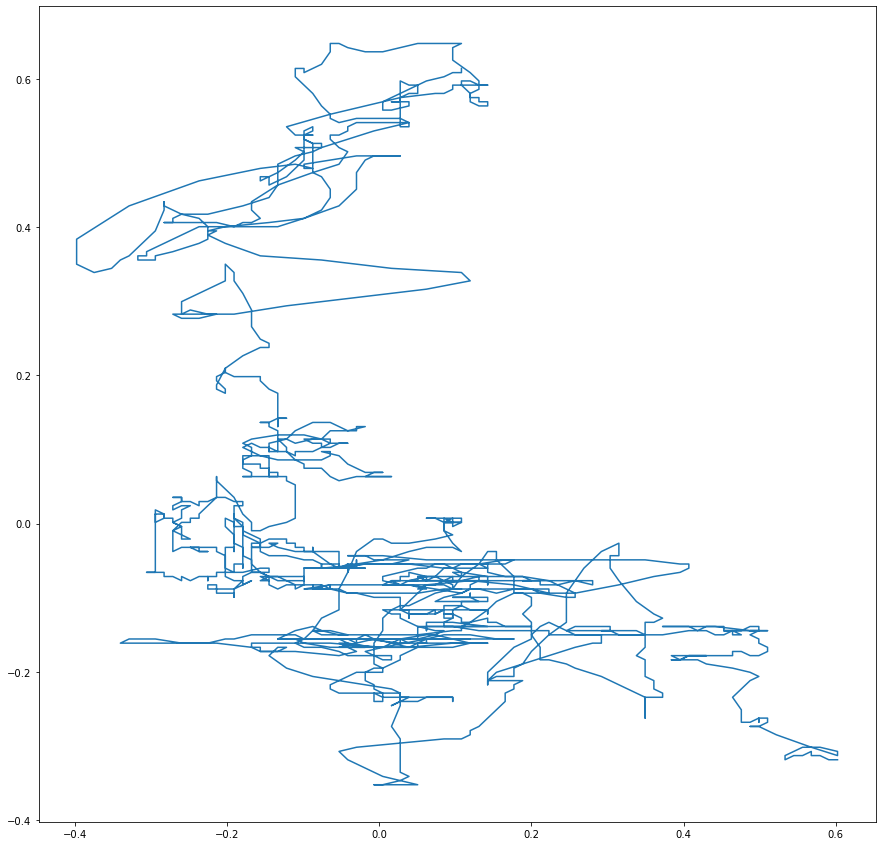

In [174]:
figure(figsize=(15,15))
plot(pitch8,roll8)

In [97]:
from scipy import signal

def freq_analysis(s, name, units, fs=25, n_window=2048, nfft=2048):
    
    window = signal.windows.bartlett(n_window)
    
    freqs, Pxx = signal.welch(x=s, fs=fs, window=window)
    
    with sns.axes_style("whitegrid"):
        f, ax = plt.subplots(figsize=(20, 3))
    
        ax.plot(freqs, Pxx)
        plt.loglog()
        plt.title('Power spectral density of ' + name, fontsize=40)
        plt.xlabel('Frequency (Hz)', fontsize=25)
        plt.ylabel('Power (' + units +')', fontsize=25)
        plt.xlim(left=0.008)
        plt.show()
    return

NameError: name 'y_axis' is not defined

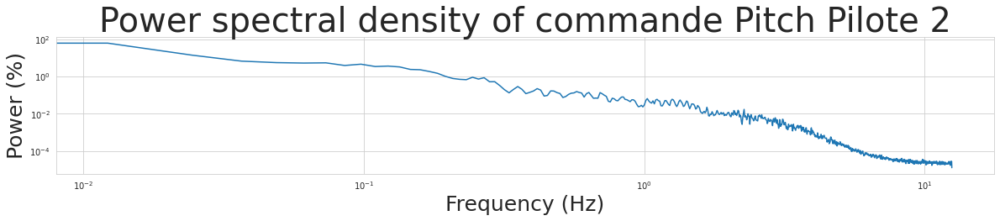

In [96]:
freq_analysis(data_P2["cmd_pitch"],'commande Pitch Pilote 2',units='%')
freq_analysis(data_P2S2["cmd_pitch"],'commande Pitch Pilote 2 S2',units='%')

#freq_analysis(data_P3["cmd_pitch"],'commande Pitch Pilote 3',units='%')
#freq_analysis(data_P3S2["cmd_pitch"],'commande Pitch Pilote 3 S2',units='%')

#freq_analysis(data_P4["cmd_pitch"],'commande Pitch Pilote 4',units='%')

freq_analysis(data_P5["cmd_pitch"],'commande Pitch Pilote 5',units='%')
freq_analysis(data_P5S2["cmd_pitch"],'commande Pitch Pilote 5 S2',units='%')

#freq_analysis(data_P7["cmd_pitch"],'commande Pitch Pilote 7',units='%')

#freq_analysis(data_P8["cmd_pitch"],'commande Pitch Pilote 8',units='%')

#freq_analysis(data_P9["cmd_pitch"],'commande Pitch Pilote 9',units='%')



<IPython.core.display.Javascript object>


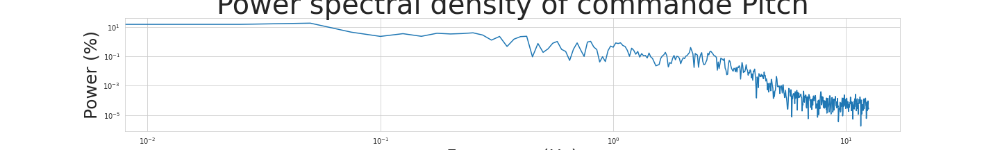

In [54]:
freq_analysis(stationnaire_P2["cmd_pitch"],'commande Pitch',units='%',n_window=1000,nfft=1000)

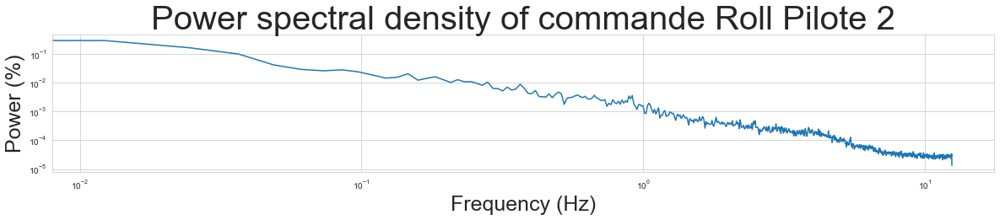

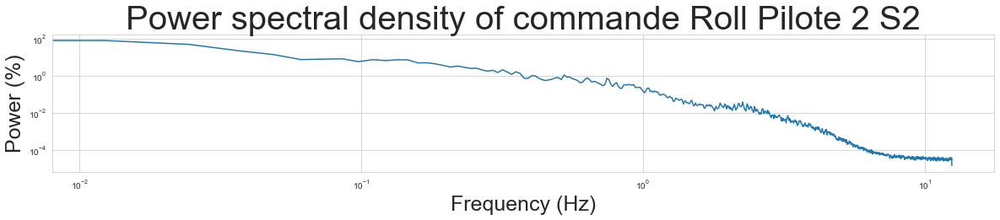

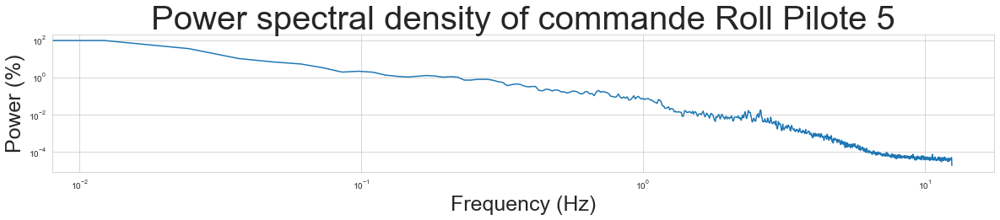

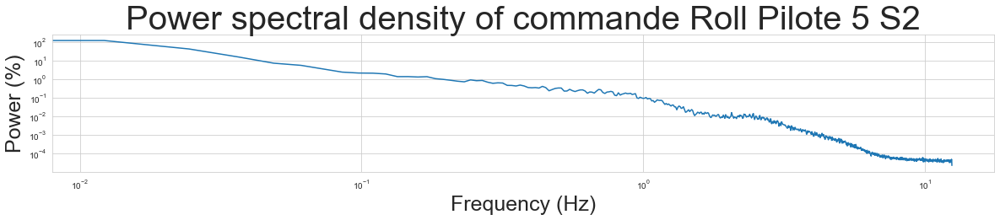

In [56]:
freq_analysis(data_P2["force_roll"],'commande Roll Pilote 2',units='%')
freq_analysis(data_P2S2["cmd_roll"],'commande Roll Pilote 2 S2',units='%')

freq_analysis(data_P5["cmd_roll"],'commande Roll Pilote 5',units='%')
freq_analysis(data_P5S2["cmd_roll"],'commande Roll Pilote 5 S2',units='%')

In [61]:
np.random.seed(1729)

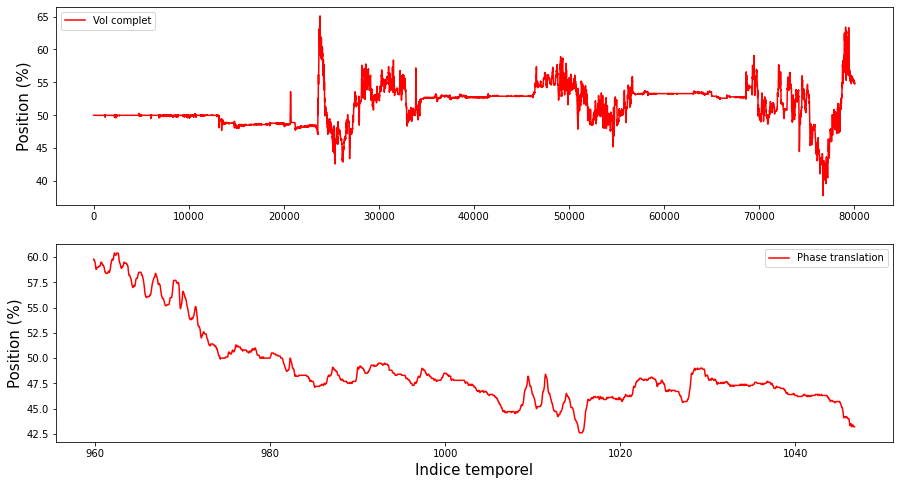

In [55]:
%matplotlib inline
figure(figsize=(15,8))
title("Commandes Pitch Pilote 8")
subplot(2,1,1)
plt.plot(data_P8['cmd_roll'].reset_index(drop=True),'r',label='Vol complet')
ylabel('Position (%)',fontsize=15)
legend()
subplot(2,1,2)
plt.plot(stationnaire_P8['reltime'],stationnaire_P8['cmd_roll'],'r',label='Phase translation')
ylabel('Position (%)',fontsize=15)
xlabel('Indice temporel',fontsize=15)
legend()
show()

In [ ]:
positionCm 

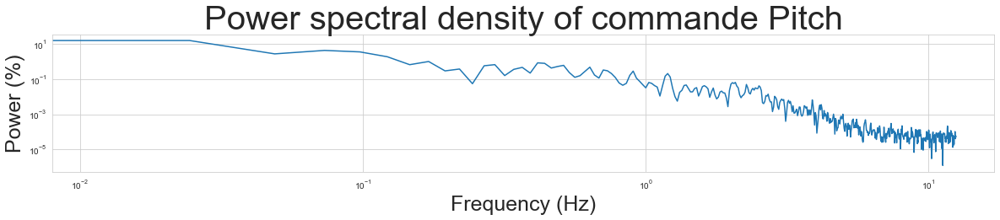

NameError: name 'yaxis' is not defined

In [94]:

freq_analysis(stationnaire_P8["cmd_pitch"],'commande Pitch',units='%',n_window=1024,nfft=1024)


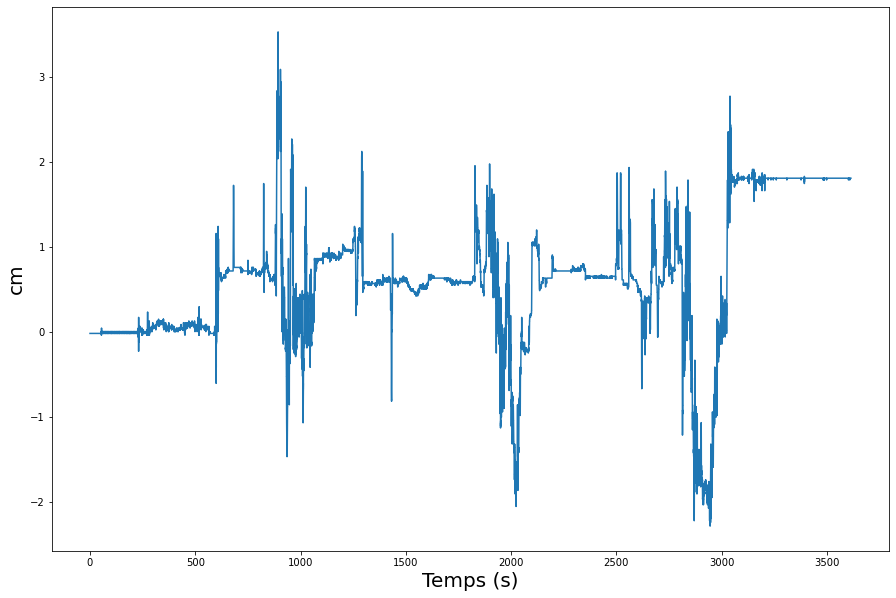

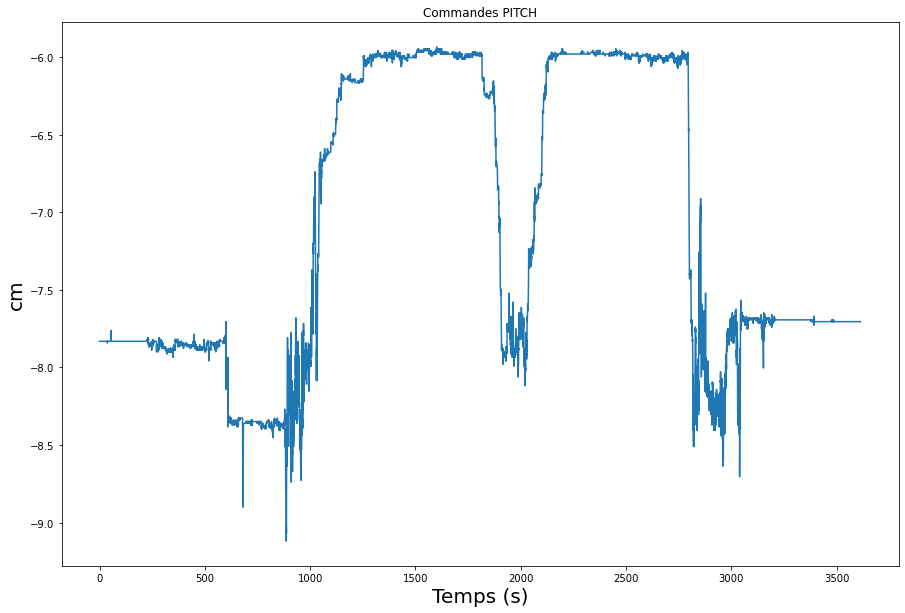

In [173]:
figure(figsize=(15,10))
plot(data_P3['reltime'],(data_P3["cmd_roll"]-50)*(10.5/50))
ylabel("cm",fontsize=20)
xlabel("Temps (s)",fontsize=20)
show()
%matplotlib inline
figure(figsize=(15,10))
title('Commandes PITCH')
plot(data_P3['reltime'],(data_P3["cmd_pitch"]*11.5/100)-11.5)
ylabel("cm",fontsize=20)
xlabel("Temps (s)",fontsize=20)
show()

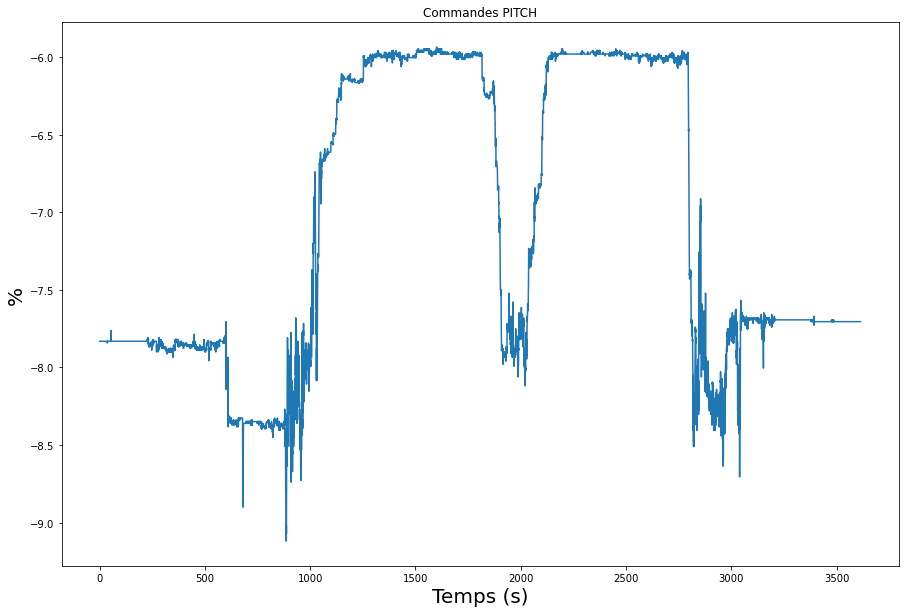

In [171]:
%matplotlib inline
figure(figsize=(15,10))
title('Commandes PITCH')
plot(data_P3['reltime'],(data_P3["cmd_pitch"]*11.5/100)-11.5)
ylabel("%",fontsize=20)
xlabel("Temps (s)",fontsize=20)
show()


<IPython.core.display.Javascript object>


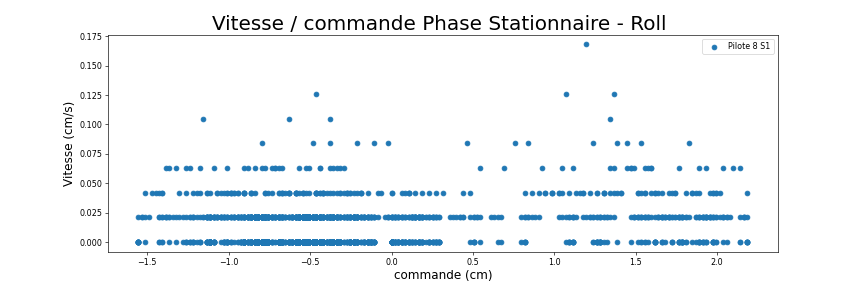

<IPython.core.display.Javascript object>


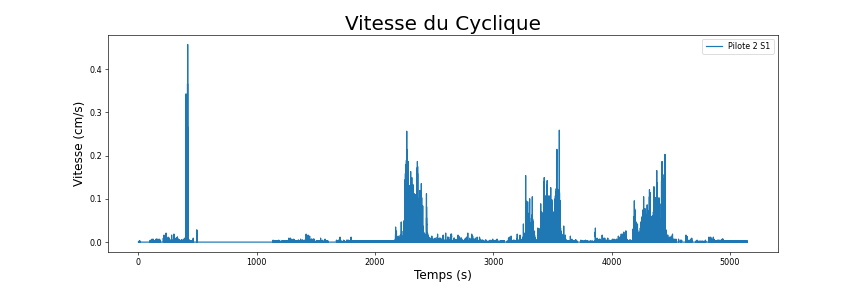

In [169]:
%matplotlib notebook
figure(figsize=(15,5))
title('Vitesse / commande Phase Stationnaire - Roll ',fontsize=25)
scatter(((stationnaire_P8["cmd_roll"]-50)*(10.5/50)),((stationnaire_P8["cmd_roll"]-50)*(10.5/50)).diff().abs(),label='Pilote 8 S1')
legend()
xlabel("commande (cm)",fontsize=15)
ylabel("Vitesse (cm/s)",fontsize=15)
figure(figsize=(15,5))
title('Vitesse du Cyclique',fontsize=25)
plot((data_P2["reltime"]),((data_P2["cmd_roll"]-50)*(10.5/50)).rolling(9,1).mean().diff().abs(),label='Pilote 2 S1')
legend()
xlabel("Temps (s)",fontsize=15)
ylabel("Vitesse (cm/s)",fontsize=15)
show()

<IPython.core.display.Javascript object>


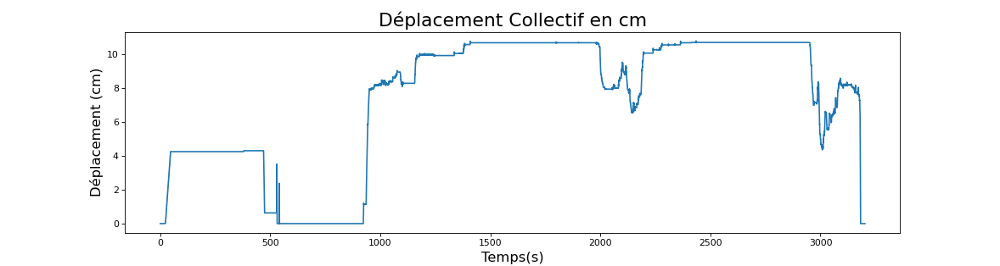

Text(0, 0.5, 'Déplacement (cm)')

In [37]:
figure(figsize=(15,4))
title('Déplacement Collectif en cm',fontsize=20)
plt.plot(data_P8['reltime'],data_P8['cmd_coll']*0.18)
xlabel('Temps(s)',fontsize=15)
ylabel('Déplacement (cm)',fontsize=15)

Text(0, 0.5, 'Déplacement (cm)')

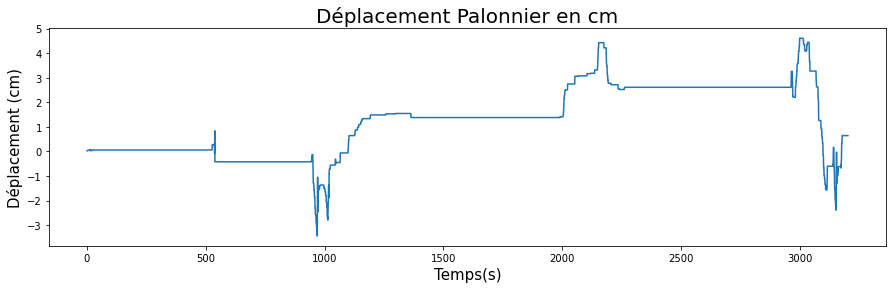

In [206]:
figure(figsize=(15,4))
title('Déplacement Palonnier en cm',fontsize=20)
plt.plot(data_P8['reltime'],(data_P8['cmd_yaw']-50)*7.5/50)
xlabel('Temps(s)',fontsize=15)
ylabel('Déplacement (cm)',fontsize=15)

In [132]:
 gps_P2 = pd.read_csv('Data-CSV/2017-05-10_12;47;27/am.txt', delimiter=';')

In [128]:
len(stationnaire_P8['cmd_pitch']),len(stationnaire_P8['cmd_roll']),len(stationnaire_P8['cmd_coll'])

(2175, 2175, 2175)

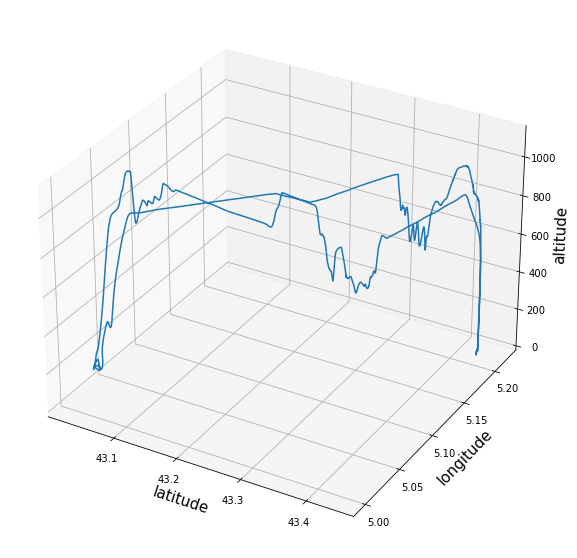

In [137]:
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.plot(gps_P2["lati"],gps_P2["longi"],gps_P2['radio_alti'])
xlabel('latitude',fontsize=15)
ylabel('longitude',fontsize=15)
ax.set_zlabel('altitude',fontsize=15)
show()

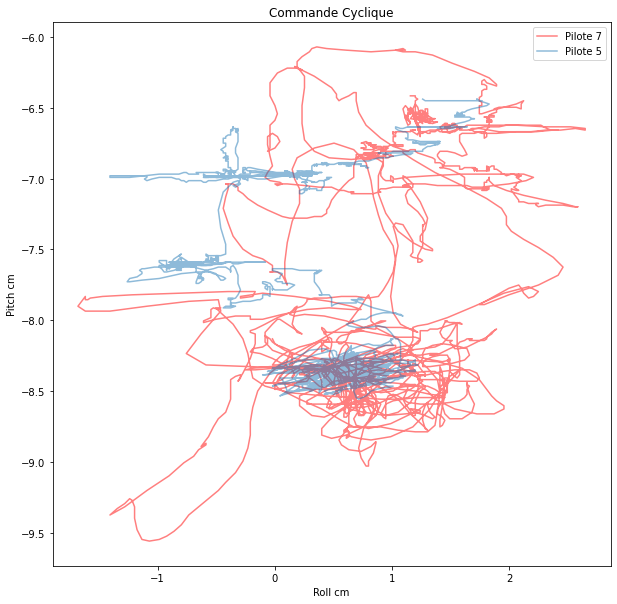

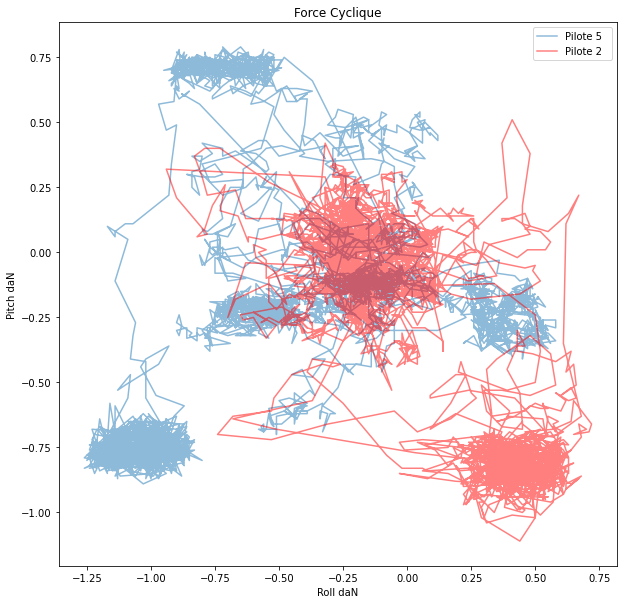

In [103]:
plt.figure(figsize=(10,10))
plt.title("Commande Cyclique")
plt.plot((decol1_P2['cmd_roll']-50)*(10.5/50),(decol1_P2['cmd_pitch']*11.5/100)-11.5,'r',label='Pilote 7',alpha=0.5)
plt.plot((decol1_P5['cmd_roll']-50)*(10.5/50),(decol1_P5['cmd_pitch']*11.5/100)-11.5,label='Pilote 5',alpha=0.5)

xlabel('Roll cm')
ylabel('Pitch cm')
plt.legend()
plt.show()

plt.figure(figsize=(10,10))
plt.title("Force Cyclique")
plt.plot(decol1_P5['force_roll'],decol1_P5['force_pitch'],label='Pilote 5  ',alpha=0.5)
plt.plot(decol1_P2['force_roll'],decol1_P2['force_pitch'],'r',label='Pilote 2',alpha=0.5)
xlabel('Roll daN')
ylabel('Pitch daN')
plt.legend()
plt.show()

In [59]:
from scipy import signal

def freq_analysis_double(s1,s2,s3,s4,s5,s6,s7, name, units, fs=25, n_window=2048, nfft=2048):
    
    window = signal.windows.bartlett(n_window)
    
    freqs1, Pxx1 = signal.welch(s1, fs=fs, window=window)
    freqs2, Pxx2 = signal.welch(s2, fs=fs, window=window)
    freqs3, Pxx3 = signal.welch(s3, fs=fs, window=window)
    freqs4, Pxx4 = signal.welch(s4, fs=fs, window=window)
    freqs5, Pxx5 = signal.welch(s5, fs=fs, window=window)
    freqs6, Pxx6 = signal.welch(s6, fs=fs, window=window)
    freqs7, Pxx7 = signal.welch(s7, fs=fs, window=window)
    
    
    with sns.axes_style("whitegrid"):
        f, ax = plt.subplots(figsize=(15,15))
    
        ax.plot(freqs1, Pxx1,label='Pilote 2')
        ax.plot(freqs2, Pxx2, label='Pilote 3')
        ax.plot(freqs3, Pxx3,label='Pilote 4')
        ax.plot(freqs4, Pxx4, label='Pilote 5')
        ax.plot(freqs5, Pxx5,label='Pilote 7')
        ax.plot(freqs6, Pxx6, label='Pilote 8')
        ax.plot(freqs7, Pxx7, label='Pilote 9')
        
        legend(fontsize = 20)
        plt.loglog()
        plt.title('Power spectral density ' + name, fontsize=40)
        plt.xlabel('Frequency (Hz)', fontsize=25)
        plt.ylabel('Power (' + units +')', fontsize=25)
        plt.xlim(left=0.008)
        ax.tick_params(labelsize=20)
        plt.show()
    return

<IPython.core.display.Javascript object>


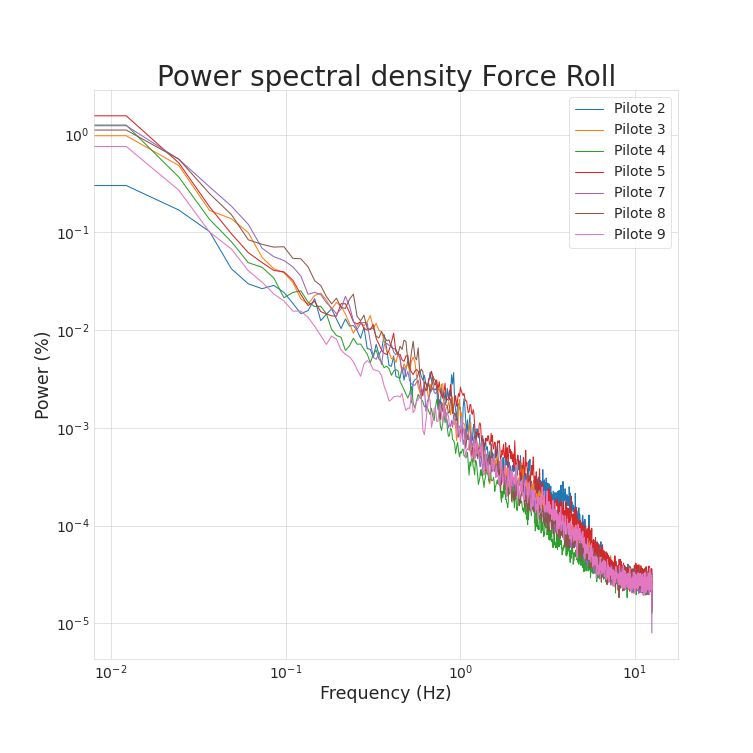

In [208]:
freq_analysis_double(data_P2["force_roll"],data_P3["force_roll"],data_P4["force_roll"],data_P5["force_roll"],data_P7["force_roll"],data_P8["force_roll"],data_P9["force_roll"],'Force Roll',units='%')

<IPython.core.display.Javascript object>


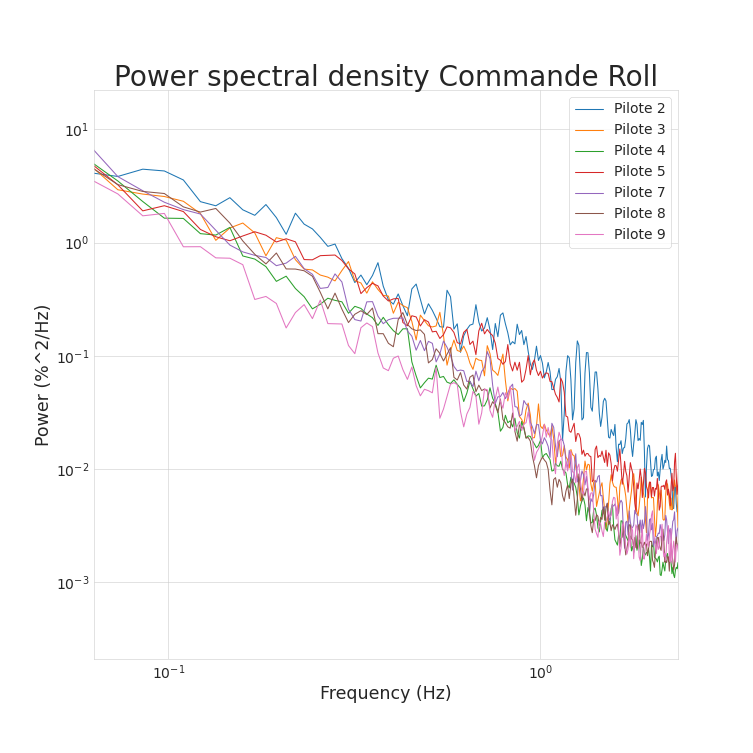

In [210]:
freq_analysis_double(data_P2["cmd_roll"],data_P3["cmd_roll"],data_P4["cmd_roll"],data_P5["cmd_roll"],data_P7["cmd_roll"],data_P8["cmd_roll"],data_P9["cmd_roll"],'Commande Roll',units='%^2/Hz')

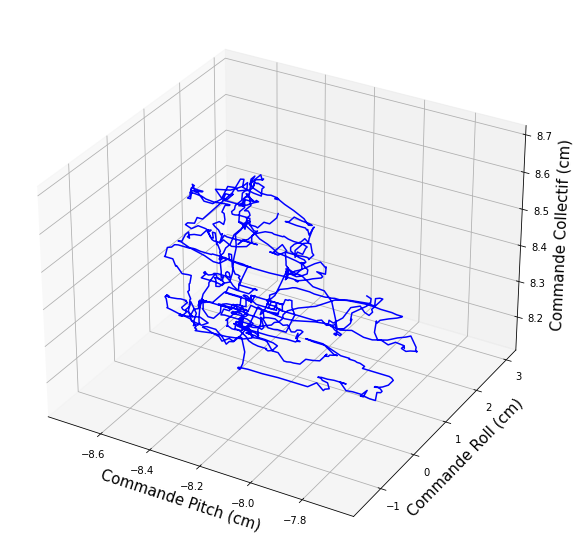

In [57]:
#%matplotlib notebook
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')
ax.plot((stationnaire_P3["cmd_pitch"]*11.5/100)-11.5,(stationnaire_P3["cmd_roll"]-50)*(10.5/50),stationnaire_P3['cmd_coll']*0.18,'b')
xlabel('Commande Pitch (cm)',fontsize=15)
ylabel('Commande Roll (cm)',fontsize=15)
ax.set_zlabel('Commande Collectif (cm)',fontsize=15)
show()

In [48]:
matplotlib.colors.cnames

{'aliceblue': '#F0F8FF',
 'antiquewhite': '#FAEBD7',
 'aqua': '#00FFFF',
 'aquamarine': '#7FFFD4',
 'azure': '#F0FFFF',
 'beige': '#F5F5DC',
 'bisque': '#FFE4C4',
 'black': '#000000',
 'blanchedalmond': '#FFEBCD',
 'blue': '#0000FF',
 'blueviolet': '#8A2BE2',
 'brown': '#A52A2A',
 'burlywood': '#DEB887',
 'cadetblue': '#5F9EA0',
 'chartreuse': '#7FFF00',
 'chocolate': '#D2691E',
 'coral': '#FF7F50',
 'cornflowerblue': '#6495ED',
 'cornsilk': '#FFF8DC',
 'crimson': '#DC143C',
 'cyan': '#00FFFF',
 'darkblue': '#00008B',
 'darkcyan': '#008B8B',
 'darkgoldenrod': '#B8860B',
 'darkgray': '#A9A9A9',
 'darkgreen': '#006400',
 'darkgrey': '#A9A9A9',
 'darkkhaki': '#BDB76B',
 'darkmagenta': '#8B008B',
 'darkolivegreen': '#556B2F',
 'darkorange': '#FF8C00',
 'darkorchid': '#9932CC',
 'darkred': '#8B0000',
 'darksalmon': '#E9967A',
 'darkseagreen': '#8FBC8F',
 'darkslateblue': '#483D8B',
 'darkslategray': '#2F4F4F',
 'darkslategrey': '#2F4F4F',
 'darkturquoise': '#00CED1',
 'darkviolet': '#9400D3

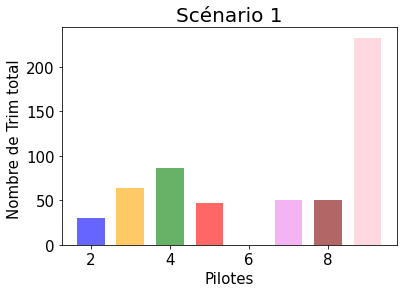

In [56]:
plt.bar([2,3,4,5,7,8,9],nb_ruptures_roll, alpha=0.6,label='Données Brutes',width=0.7,color=['b','#FFA500','#008000','r','#EE82EE','#800000','#FFC0CB'])
#legend(fontsize=15)
title("Scénario 1",fontsize=20)
xlabel("Pilotes",fontsize=15)
ylabel('Nombre de Trim total ',fontsize=15)
tick_params(labelsize=15)

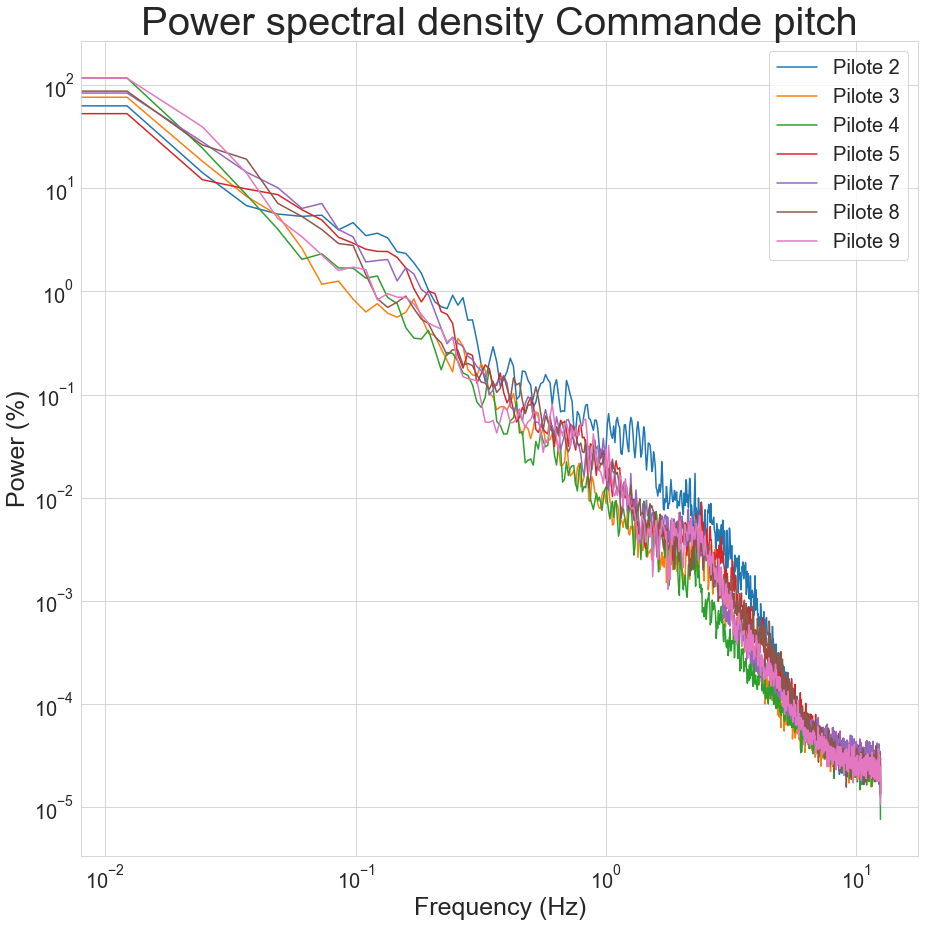

In [60]:
freq_analysis_double(data_P2["cmd_pitch"],data_P3["cmd_pitch"],data_P4["cmd_pitch"],data_P5["cmd_pitch"],data_P7["cmd_pitch"],data_P8["cmd_pitch"],data_P9["cmd_pitch"],'Commande pitch',units='%')

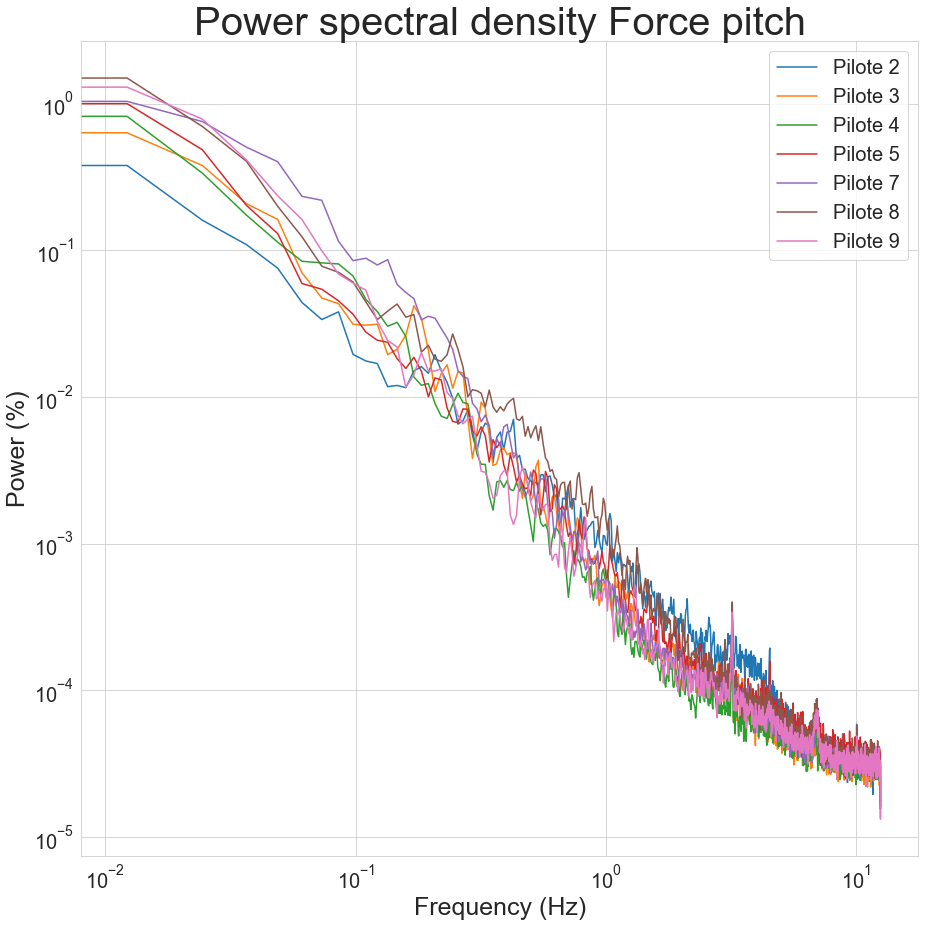

In [61]:
freq_analysis_double(data_P2["force_pitch"],data_P3["force_pitch"],data_P4["force_pitch"],data_P5["force_pitch"],data_P7["force_pitch"],data_P8["force_pitch"],data_P9["force_pitch"],'Force pitch',units='%')

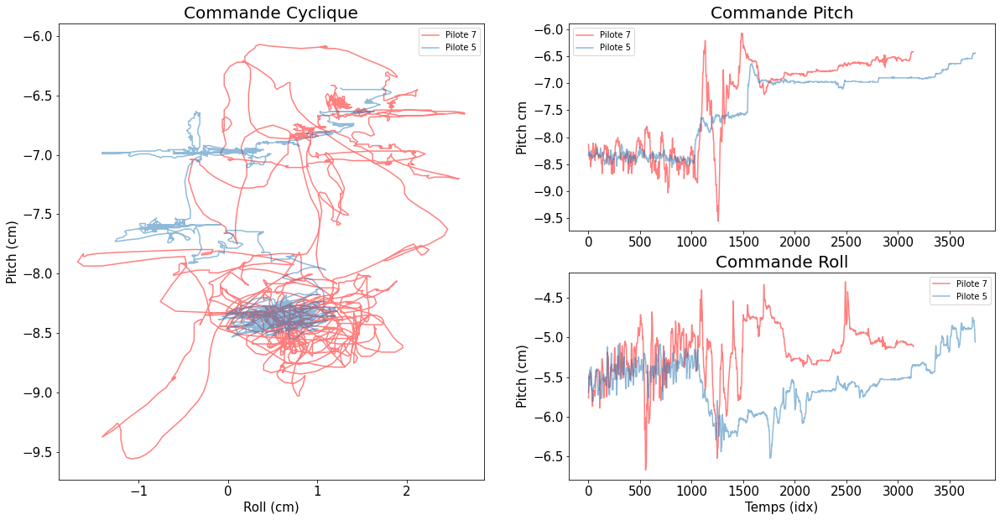

In [101]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.title("Commande Cyclique",fontsize=20)
plt.plot((decol1_P2['cmd_roll']-50)*(10.5/50),(decol1_P2['cmd_pitch']*11.5/100)-11.5,'r',label='Pilote 7',alpha=0.5)
plt.plot((decol1_P5['cmd_roll']-50)*(10.5/50),(decol1_P5['cmd_pitch']*11.5/100)-11.5,label='Pilote 5',alpha=0.5)
xlabel('Roll (cm)',fontsize=15)
ylabel('Pitch (cm)',fontsize=15)
tick_params(labelsize=15)
plt.legend()

plt.subplot(2,2,2)
plt.title("Commande Pitch",fontsize=20)
plt.plot(((decol1_P2['cmd_pitch']*11.5/100)-11.5).reset_index(drop=True),'r',label='Pilote 7',alpha=0.5)
plt.plot(((decol1_P5['cmd_pitch']*11.5/100)-11.5).reset_index(drop=True),label='Pilote 5',alpha=0.5)
#xlabel('Temps (idx)',fontsize=15)
ylabel('Pitch cm',fontsize=15)
tick_params(labelsize=15)
plt.legend()

plt.subplot(2,2,4)
plt.title("Commande Roll",fontsize=20)
plt.plot(((decol1_P2['cmd_roll']*11.5/100)-11.5).reset_index(drop=True),'r',label='Pilote 7',alpha=0.5)
plt.plot(((decol1_P5['cmd_roll']*11.5/100)-11.5).reset_index(drop=True),label='Pilote 5',alpha=0.5)
xlabel('Temps (idx)',fontsize=15)
ylabel('Pitch (cm)',fontsize=15)
plt.legend()
tick_params(labelsize=15)
plt.show()

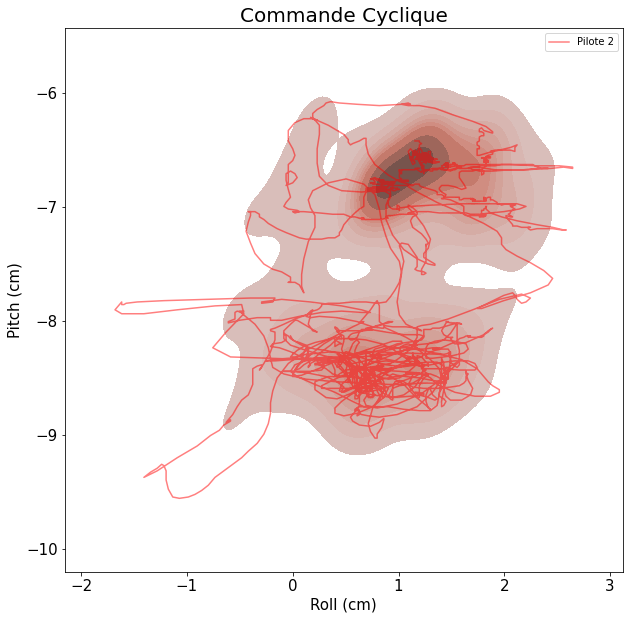

In [115]:
figure(figsize=(10,10))
plt.title("Commande Cyclique",fontsize=20)
sns.kdeplot(data=decol1_P2,x=(decol1_P2['cmd_roll']-50)*(10.5/50),y=(decol1_P2['cmd_pitch']*11.5/100)-11.5,fill=True, color='tab:brown')
plt.plot((decol1_P2['cmd_roll']-50)*(10.5/50),(decol1_P2['cmd_pitch']*11.5/100)-11.5,'r',label='Pilote 2',alpha=0.5)
xlabel('Roll (cm)',fontsize=15)
ylabel('Pitch (cm)',fontsize=15)
tick_params(labelsize=15)
tick_params(labelsize=15)
legend()
plt.show()

In [116]:
git init
git add README.md
git commit -m "first commit"
git branch -M main
git remote add origin https://github.com/MoussaNasr/Thales.git
git push -u origin main

SyntaxError: invalid syntax (<ipython-input-116-f8e428eff849>, line 1)